In [ ]:
import numpy as np 
import matplotlib.pyplot as plt
import qutip as qt


: 

# Import Scripts

In [ ]:
from scripts.helpers import *
from scripts.floquet import *
from scripts.coupler_floquet_driving_analysis import *

: 

In [3]:
%load_ext autoreload
%autoreload 2

## File Saving Parameters

In [9]:
slab_dir = r"Z:\Multimode\simulation\g_drive_backup\lateJune2025_1"
gdrive_dir = r"G:\Shared drives\SLab\Multimode\simulation\data\June2025_coupler_sims"
troyonium_dir = r"C:\Users\eeshg\Documents\multimode_sims\data"

In [10]:
import os
import shutil

def move_file(src_path, dest_dir):
    """
    Move a file from src_path to dest_dir.
    The file will be removed from the original directory.
    """
    if not os.path.isfile(src_path):
        raise FileNotFoundError(f"Source file not found: {src_path}")
    if not os.path.isdir(dest_dir):
        os.makedirs(dest_dir, exist_ok=True)
    dest_path = os.path.join(dest_dir, os.path.basename(src_path))
    shutil.move(src_path, dest_path)
    return dest_path

# drc_path = r"G:\Shared drives\SLab\Multimode\simulation\data\June2025_coupler_sims\yo.txt"
# dest_dir = save_dir
# moved_file_path = move_file(drc_path, dest_dir)
# print(f"Moved file to: {moved_file_path}")

# def move_all_files(src_dir, dest_dir):
#     """
#     Move all files and folders from src_dir to dest_dir.
#     """
#     if not os.path.isdir(src_dir):
#         raise NotADirectoryError(f"Source directory not found: {src_dir}")
#     if not os.path.isdir(dest_dir):
#         os.makedirs(dest_dir, exist_ok=True)
#     for item in os.listdir(src_dir):
#         src_path = os.path.join(src_dir, item)
#         dest_path = os.path.join(dest_dir, item)
#         if os.path.isfile(src_path):
#             shutil.move(src_path, dest_path)
#         elif os.path.isdir(src_path):
#             shutil.move(src_path, dest_path)
import os
import shutil

def move_folder(src, dst):
    try:
        print(f"Copying {src} to {dst}...")
        if os.path.exists(dst):
            print(f"Destination already exists: {dst}")
            return
        
        shutil.copytree(src, dst)
        print("Copy successful.")

        print("Deleting original folder...")
        shutil.rmtree(src)
        print("Original folder deleted.")

    except PermissionError as e:
        print(f"Permission denied while deleting files. Error: {e}")
    except shutil.Error as e:
        print(f"Shutil error during move: {e}")
    except Exception as e:
        print(f"Unexpected error: {e}")


# Example usage:
source_directory = r"G:\Shared drives\SLab\Multimode\simulation\data\June2025_coupler_sims\_source_folder"
# move_all_files(source_directory, dest_dir)


In [11]:
move_folder(troyonium_dir, slab_dir)

Copying C:\Users\eeshg\Documents\multimode_sims\data to Z:\Multimode\simulation\g_drive_backup\lateJune2025_1...
Copy successful.
Deleting original folder...
Permission denied while deleting files. Error: [WinError 5] Access is denied: 'C:\\Users\\eeshg\\Documents\\multimode_sims\\data\\2025-06-15\\plots'


# Hamiltonians

## General Alice Bob Cavity Hamiltonian

Let the Hamiltonian for Alice (A), Bob (B), and a coupler mode (C), all modeled as cavity modes with annihilation operators $a$, $b$, and $c$ and frequencies $\omega_A$, $\omega_B$, $\omega_C$, be:

$$
H = \omega_A\, a^\dagger a + \omega_B\, b^\dagger b + \omega_C\, c^\dagger c  + g_{AC} (a^\dagger c + a c^\dagger) + g_{BC} (b^\dagger c + b c^\dagger)
$$

where:
- $a$, $b$, $c$ are annihilation operators for Alice, Bob, and the coupler mode,
- $a^\dagger$, $b^\dagger$, $c^\dagger$ are the corresponding creation operators,
- $g_{AC}$, $g_{BC}$ are couplings between Alice/Coupler and Bob/Coupler.

## LINC Potential 
$$U = 2M^2E_J \cos{\phi_{ext}}\cos{\theta/M}$$
- $M$: Integer parameter related to the number of junctions or modes in the system  
- $E_J$: Josephson energy  
- $\phi_{ext}$: External flux phase  
- $\theta$: Collective phase variable, e.g., $\theta = \theta_{\mathrm{zpt}} (c + c^\dagger)$  
- $\theta_{\mathrm{zpt}} = (2E_C/E_L)^{1/4}$
- $U$: LINC potential energy

If we set $\phi_{ext} = \frac{\pi}{2} + \phi_{AC}$, then H becomes:
$$
U = 2M^2E_J \sin{\phi_{AC}}\cos{\theta/M}
$$



In [17]:
##

# Floquet sweeps on coupler hamiltonian

In [16]:
# Parameters for LINC potential (example values, adjust as needed)
M = 1               # Integer parameter (number of junctions/modes)
E_J = 2 * np.pi * 10e3    # Josephson energy (in appropriate units)
# phi_AC = np.pi / 4   # Phase variable (in radians)
E_C = 2 * np.pi * 60   # Charging energy
E_L = 2 * np.pi * 35*1e3    # Inductive energy

# Parameters for the general Alice-Bob-Cavity Hamiltonian (all units are in MHz)
omega_A = 2 * np.pi * 4.9e3      # Frequency of Alice's mode
omega_B = 2 * np.pi * 5.3e3      # Frequency of Bob's mode
omega_C = 2 * np.pi * 4.0e3      # Frequency of Coupler mode
g_AC = 2 * np.pi * 100         # Coupling between Alice and Coupler
g_BC = 2 * np.pi * 80         # Coupling between Bob and Coupler


In [129]:
coup_ham = CouplerHamiltonian(
    trunc=6,
    omega_A=omega_A,
    omega_B=omega_B,
    omega_C=omega_C,
    g_AC=g_AC,
    g_BC=g_BC,
    E_C=E_C,
    E_L=E_L,
    E_J=E_J
)
# more coupler lebvels 

Initializing CouplerHamiltonian with truncation: 6
No couplings added to Hamiltonian
Adding jc couplings to Hamiltonian


In [130]:
state_labels = ['|0,0,0>', '|0,0,1>', '|0,0,2>' , 
                '|0,1,0>', '|0,2,0>',  
                '|1,0,0>', '|2,0,0>', ]
# find the dressed energies 
coup_analysis = coupler_driving_analysis("yoyoyo", troyonium_dir, None, coup_ham)
dressed_energies = {}
static_energies = {}
for state in state_labels:
    dressed_energies[state] = coup_ham.get_dressed_energy(state)
    static_energies[state] = coup_ham.basis_energies[coup_ham.ket_to_basis_index(state)]

# Print the static Kerrs 
coupler_static = coup_analysis.get_kerr(static_energies['|0,0,0>'], static_energies['|0,0,1>'], static_energies['|0,0,2>'])
coupler_dressed = coup_analysis.get_kerr(dressed_energies['|0,0,0>'], dressed_energies['|0,0,1>'], dressed_energies['|0,0,2>'])
print(f"Coupler static Kerr: {coupler_static}")
print(f"Coupler dressed Kerr: {coupler_dressed}")

# do for alice 
alice_static = coup_analysis.get_kerr(static_energies['|0,0,0>'], static_energies['|0,1,0>'], static_energies['|0,2,0>'])
alice_dressed = coup_analysis.get_kerr(dressed_energies['|0,0,0>'], dressed_energies['|0,1,0>'], dressed_energies['|0,2,0>'])
print(f"bob static Kerr: {alice_static}")
print(f"bob dressed Kerr: {alice_dressed}")

# do for bob
bob_static = coup_analysis.get_kerr(static_energies['|0,0,0>'], static_energies['|1,0,0>'], static_energies['|2,0,0>'])
bob_dressed = coup_analysis.get_kerr(dressed_energies['|0,0,0>'], dressed_energies['|1,0,0>'], dressed_energies['|2,0,0>'])
print(f"alice static Kerr: {bob_static}")
print(f"alice dressed Kerr: {bob_dressed}")

Index for ket |0,0,0>: 0
Index for ket |0,0,1>: 1
Index for ket |0,0,2>: 4
Index for ket |0,1,0>: 3
Index for ket |0,2,0>: 9
Index for ket |1,0,0>: 2
Index for ket |2,0,0>: 7
Coupler static Kerr: 7.275957614183426e-12
Coupler dressed Kerr: 8.934875950217247e-08
bob static Kerr: 0.0
bob dressed Kerr: 5.238689482212067e-10
alice static Kerr: 1.4551915228366852e-11
alice dressed Kerr: 8.672941476106644e-09


In [124]:
# divide all values in dressed and static by 2*np.pi to get MHz
dressed_energies = {k: v / (2 * np.pi) for k, v in dressed_energies.items()}
static_energies = {k: v / (2 * np.pi) for k, v in static_energies.items()}
# find difference between states and '|0,0,0>'
new_dressed_energies = dressed_energies.copy()
new_static_energies = static_energies.copy()
new_dressed_energies = {k: v - dressed_energies['|0,0,0>'] for k, v in dressed_energies.items()}
new_static_energies = {k: v - static_energies['|0,0,0>'] for k, v in static_energies.items()}
new_dressed_energies, new_static_energies

({'|0,0,0>': 0.0,
  '|0,0,1>': 3982.3907713422404,
  '|0,0,2>': 7964.781542698702,
  '|0,1,0>': 5304.284439587948,
  '|0,2,0>': 10608.568879175979,
  '|1,0,0>': 4909.697580123785,
  '|2,0,0>': 9819.39516024895},
 {'|0,0,0>': 0.0,
  '|0,0,1>': 3999.9999999999995,
  '|0,0,2>': 8000.000000000001,
  '|0,1,0>': 5300.0,
  '|0,2,0>': 10600.0,
  '|1,0,0>': 4900.0,
  '|2,0,0>': 9800.000000000002})

Max overlap with dressed state: Quantum object: dims=[[6, 6, 6], [1, 1, 1]], shape=(216, 1), type='ket', dtype=Dense
Qobj data =
[[ 1.51206086e-03]
 [ 1.80411242e-16]
 [-1.15237079e-02]
 [-1.94289029e-16]
 [ 9.05362823e-06]
 [ 3.60822483e-16]
 [-6.93889390e-17]
 [-3.02685491e-03]
 [ 3.03576608e-16]
 [ 1.73541049e-04]
 [ 1.94289029e-16]
 [-1.74988453e-07]
 [-3.94264921e-04]
 [ 4.99481749e-16]
 [ 5.32004847e-05]
 [ 2.99184086e-17]
 [-2.13454202e-06]
 [-1.91736820e-16]
 [-1.05372531e-17]
 [ 6.36005917e-06]
 [ 1.79178393e-16]
 [-7.02241351e-07]
 [ 3.86320161e-17]
 [ 2.39327941e-08]
 [ 8.87718657e-08]
 [ 5.37978337e-18]
 [-8.34407677e-08]
 [-2.96028583e-19]
 [ 8.24105484e-09]
 [-4.52636178e-19]
 [ 1.72222814e-19]
 [-1.77847098e-09]
 [-1.01486087e-19]
 [ 9.95362752e-10]
 [-8.74663972e-21]
 [-8.75827501e-11]
 [-2.75994581e-18]
 [ 1.50869292e-01]
 [-1.93335466e-17]
 [ 1.40670423e-04]
 [ 7.71517815e-18]
 [-1.84980575e-07]
 [ 2.79046289e-02]
 [ 9.48721473e-18]
 [-1.79621408e-03]
 [ 5.94774692e-1

<Figure size 1000x600 with 0 Axes>

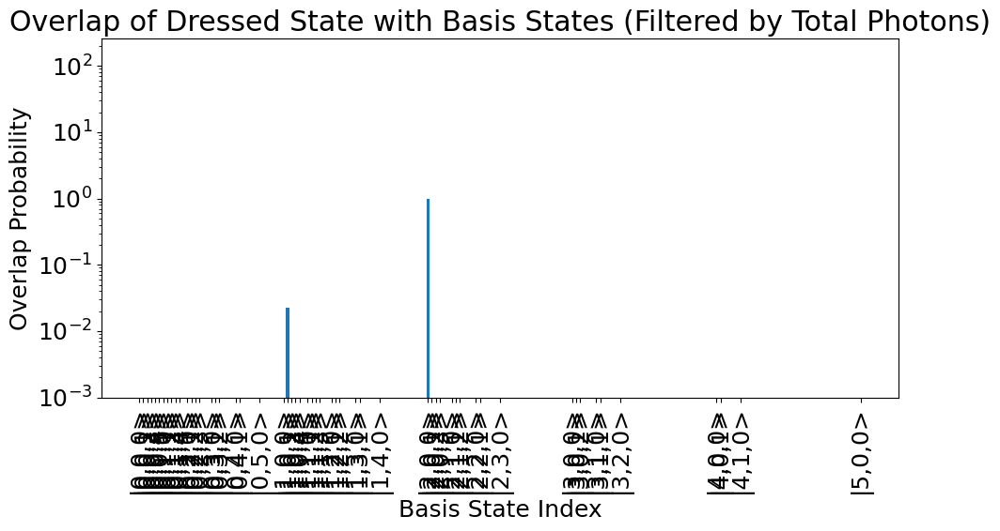

In [125]:
state_label = '|2,0,0>'
# in dressed states , find the overlap with the static state
basis_state = coup_ham.get_basis_state(state_label)
dressed_states = coup_ham.dressed_states
dressed_state_overlaps = [basis_state.overlap(dressed_state) for dressed_state in dressed_states]
idx_manax_overlap = np.argmax(np.abs(dressed_state_overlaps))
print(f"Max overlap with dressed state: {dressed_states[idx_manax_overlap]} with overlap {dressed_state_overlaps[idx_manax_overlap]}")
# Plot the dressed state overlap with the static state
plt.figure(figsize=(10, 6))


# coup_ham.plot_basis_state_overlap(coup_ham.get_dressed_state(state_label), max_total_photons = 4, yscale = 'log')
coup_ham.plot_basis_state_overlap(coup_ham.dressed_states[idx_manax_overlap], max_total_photons = 5, yscale = 'log')

### Digression

In [22]:
import qutip as qt
omegad = 2 * np.pi * 1100 # Floquet drive frequency
amp = 0.001
args = {'amp': amp, 'omega': omegad}

H0 = coup_ham.generate_H0(no_coupling=True)
operator, time_func = coup_ham.linc_potential_operator()
H_fq = [H0, [operator, time_func]]

floquet_class= FloquetHamiltonian(H = H_fq, T=2*np.pi/omegad, args=args, save_dir=save_dir)
floquet_class.init_floquet_basis()
fname = floquet_class.compute_floquet_modes()
f_energies, f_modes = floquet_class.load_floquet_modes(fname)


No couplings added to Hamiltonian


c:\Anaconda3\envs\Lib\site-packages\qutip\solver\options.py:16: FutureWarning: Dedicated options class are no longer needed, options should be passed as dict to solvers.
  warnings.warn(


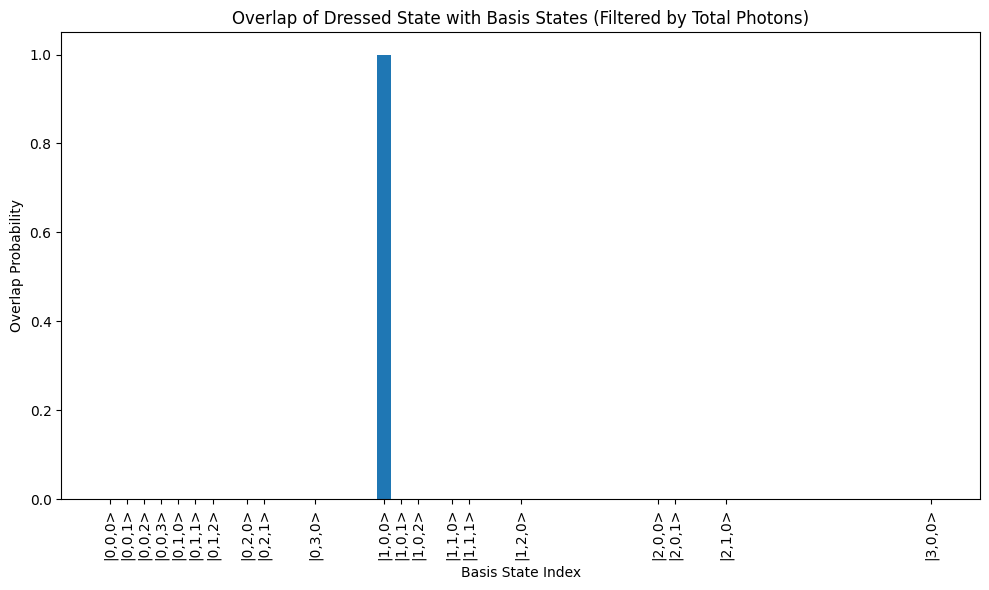

In [23]:
# Get the driven uncoupled states 

# find the modes closes to alice 
alice_state = coup_ham.basis_states[coup_ham.ket_to_basis_index('|1,0,0>')]
bob_state = coup_ham.basis_states[coup_ham.ket_to_basis_index('|0,1,0>')]

#find overlaps with floquet states (undriven states)
alice_overlap_idxs, alice_overlaps = floquet_class.find_max_overlap_indices(alice_state, f_modes, return_overlaps=True)
bob_overlap_idxs, bob_overlaps = floquet_class.find_max_overlap_indices(bob_state, f_modes, return_overlaps=True)

alice_driven_uncoupled_state = f_modes[alice_overlap_idxs[0]]
bob_driven_uncoupled_state = f_modes[bob_overlap_idxs[0]]

plus_driven_uncoupled_state = (alice_driven_uncoupled_state + bob_driven_uncoupled_state) / np.sqrt(2)
minus_driven_uncoupled_state = (alice_driven_uncoupled_state - bob_driven_uncoupled_state) / np.sqrt(2)

coup_ham.plot_dressed_state_overlap(f_modes[alice_overlap_idxs[0]])


### Lets do undriven vs driven sweep

In [131]:
min_freq = 385 * 2 * np.pi
max_freq = 400 * 2 * np.pi
freq_num = 10
amp = 0.2 * np.pi

In [132]:
# no g's 
args = {'amp': 0, 'omega': 0}
H0 = coup_ham.generate_H0(coupling=False)
operator, time_func = coup_ham.linc_potential_operator()

H_fq = [H0, [operator, time_func]]
floquet_class_uncoup = FloquetHamiltonian(H = H_fq, T=2*np.pi/200, args=args, save_dir=troyonium_dir)

f_name = floquet_class_uncoup.sweep_ac_drive_frequency(amp, freq_range = (min_freq, max_freq), num_points= freq_num)
return_args_uncoup = floquet_class_uncoup.load_sweep_results(f_name, 'frequencies')

c:\Anaconda3\envs\Lib\site-packages\qutip\solver\options.py:16: FutureWarning: Dedicated options class are no longer needed, options should be passed as dict to solvers.
  warnings.warn(


No couplings added to Hamiltonian


Computing Floquet modes:   0%|          | 0/10 [00:00<?, ?it/s]c:\Anaconda3\envs\Lib\site-packages\scipy\sparse\_coo.py:437: SparseEfficiencyWarning: Constructing a DIA matrix with 216 diagonals is inefficient
  warn("Constructing a DIA matrix with %d diagonals "
Computing Floquet modes: 100%|██████████| 10/10 [05:26<00:00, 32.69s/it]

Results saved to C:\Users\eeshg\Documents\multimode_sims\data\sweep_ac_drive_frequency_20250617_070648.csv


In [133]:
# with the g's
H0 = coup_ham.generate_H0(coupling=True)
operator, time_func = coup_ham.linc_potential_operator()

H_fq = [H0, [operator, time_func]]
floquet_class_coup = FloquetHamiltonian(H = H_fq, T=2*np.pi/200, args=args, save_dir=troyonium_dir)

f_name = floquet_class_coup.sweep_ac_drive_frequency(amp, freq_range = (min_freq, max_freq), num_points= freq_num)
return_args_coup = floquet_class_coup.load_sweep_results(f_name, 'frequencies')

c:\Anaconda3\envs\Lib\site-packages\qutip\solver\options.py:16: FutureWarning: Dedicated options class are no longer needed, options should be passed as dict to solvers.
  warnings.warn(


Adding jc couplings to Hamiltonian


Computing Floquet modes:   0%|          | 0/10 [00:00<?, ?it/s]c:\Anaconda3\envs\Lib\site-packages\scipy\sparse\_coo.py:437: SparseEfficiencyWarning: Constructing a DIA matrix with 216 diagonals is inefficient
  warn("Constructing a DIA matrix with %d diagonals "
Computing Floquet modes: 100%|██████████| 10/10 [06:32<00:00, 39.24s/it]

Results saved to C:\Users\eeshg\Documents\multimode_sims\data\sweep_ac_drive_frequency_20250617_071321.csv


#### Tracking number assignment to floquet states 

In [52]:
return_args_coup.keys()


dict_keys(['frequencies', 'modes', 'energies'])

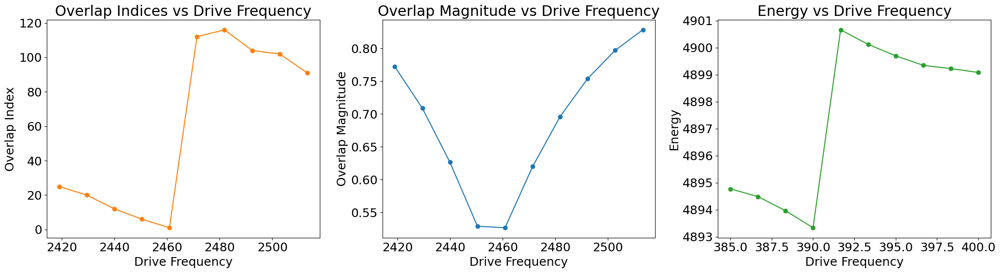

In [90]:
state_label = '|1,0,0>'
overlaps = []
overlap_idxs = []
energies = []
for idx, freq in enumerate(return_args_coup['frequencies']):
    state = coup_ham.basis_states[coup_ham.ket_to_basis_index(state_label)]

    # Find the state in the uncoupled modes
    overlap_idxs_uncoup, overlaps_uncoup = floquet_class_coup.find_max_overlap_indices(
    state, return_args_coup['modes'][idx], return_overlaps=True
    )
    # FInd energy of asociated floquet state
    dressed_idx = coup_ham.basis_to_dressed_mapping_dict[coup_ham.ket_to_basis_index(state_label)]
    dressed_energy = coup_ham.dressed_energies[dressed_idx] 
    quasienergy = return_args_coup['energies'][idx][overlap_idxs_uncoup[0]]
    mapping = floquet_class_coup.map_quasienergy_to_dressed_energy(
        quasienergy, dressed_energy, freq
    )
    energy = mapping['closest_quasienergy']
    energies.append(energy)

    #store the overlaps and indices
    overlaps.append(overlaps_uncoup[0])
    overlap_idxs.append(overlap_idxs_uncoup[0])
    # Plot energies as a third subplot
fig, axs = plt.subplots(1, 3, figsize=(21, 6))

# Plot overlap indices
axs[0].plot(return_args_coup['frequencies'], overlap_idxs, marker='o', color='tab:orange')
axs[0].set_xlabel('Drive Frequency')
axs[0].set_ylabel('Overlap Index')
axs[0].set_title('Overlap Indices vs Drive Frequency')

# Plot overlaps
axs[1].plot(return_args_coup['frequencies'], np.abs(overlaps), marker='o', color='tab:blue')
axs[1].set_xlabel('Drive Frequency')
axs[1].set_ylabel('Overlap Magnitude')
axs[1].set_title('Overlap Magnitude vs Drive Frequency')

# Plot energies
axs[2].plot(return_args_coup['frequencies']/2/np.pi,np.array( energies)/2/np.pi, marker='o', color='tab:green')
axs[2].set_xlabel('Drive Frequency')
axs[2].set_ylabel('Energy')
axs[2].set_title('Energy vs Drive Frequency')

plt.tight_layout()



In [ ]:
from qutip import Qobj

# If vec is shape (1, 125), flatten it first
vec_flat = vec.flatten()
qutip_ket = Qobj(vec_flat, dims=[[5, 5, 5], [1, 1, 1]])


Overlap index: 25, Overlap: 0.772100894952411
overlap of state1 with floquet state: (0.8786927193009004+0j)
Overlap index: 20, Overlap: 0.7086886165113457
overlap of state1 with floquet state: (0.8418364547293885+0j)
Overlap index: 12, Overlap: 0.6263971347265975
overlap of state1 with floquet state: (0.7914525473625046+0j)
Overlap index: 6, Overlap: 0.5287805147318614
overlap of state1 with floquet state: (0.7271729606715732+0j)
Overlap index: 1, Overlap: 0.5264333913772504
overlap of state1 with floquet state: (0.7255572971015111+0j)
Overlap index: 112, Overlap: 0.6196365624835062
overlap of state1 with floquet state: (0.7871699705168549+0j)
Overlap index: 116, Overlap: 0.6959212545544732
overlap of state1 with floquet state: (0.8342189488104865+0j)
Overlap index: 104, Overlap: 0.7540424473553499
overlap of state1 with floquet state: (0.8683561754000197+0j)
Overlap index: 102, Overlap: 0.7969820194667118
overlap of state1 with floquet state: (0.8927384944465606+0j)
Overlap index: 91,

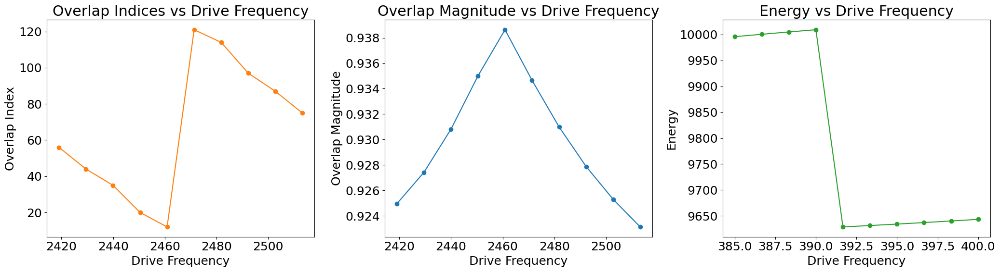

In [107]:
two_state_label = '|2,0,0>'
single_state_label = '|1,0,0>'
adag = coup_ham.c_dag
overlaps = []
overlap_idxs = []
energies = []
for idx, freq in enumerate(return_args_coup['frequencies']):
    state1 = coup_ham.basis_states[coup_ham.ket_to_basis_index(single_state_label)]

    # Find the state in the uncoupled modes
    overlap_idx, overlap = floquet_class_coup.find_max_overlap_indices(
    state1, return_args_coup['modes'][idx], return_overlaps=True
    )
    print(f"Overlap index: {overlap_idx[0]}, Overlap: {overlap[0]}")
    
    # now apply the a_dag operator to the corresponding floquet state 
    floquet_state = return_args_coup['modes'][idx][overlap_idx[0]]
    qutip_floquet_state = qt.Qobj(floquet_state.full().flatten(), dims=state1.dims)
    print(f"overlap of state1 with floquet state: {state1.overlap(qutip_floquet_state)}")
    adag_state = (adag * qutip_floquet_state).unit()

    # find the floquet state that has the maximum overlap with the floquet state
    overlap_idx, overlap = floquet_class_coup.find_max_overlap_indices(
        adag_state, return_args_coup['modes'][idx], return_overlaps=True
    )

    # FInd energy of asociated floquet state
    dressed_idx = coup_ham.basis_to_dressed_mapping_dict[coup_ham.ket_to_basis_index(two_state_label)]
    dressed_energy = coup_ham.dressed_energies[dressed_idx] 
    quasienergy = return_args_coup['energies'][idx][overlap_idx[0]]
    mapping = floquet_class_coup.map_quasienergy_to_dressed_energy(
        quasienergy, dressed_energy, freq
    )
    energy = mapping['closest_quasienergy']
    energies.append(energy)

    #store the overlaps and indices
    overlaps.append(overlap[0])
    overlap_idxs.append(overlap_idx[0])
    # Plot energies as a third subplot
fig, axs = plt.subplots(1, 3, figsize=(21, 6))

# Plot overlap indices
axs[0].plot(return_args_coup['frequencies'], overlap_idxs, marker='o', color='tab:orange')
axs[0].set_xlabel('Drive Frequency')
axs[0].set_ylabel('Overlap Index')
axs[0].set_title('Overlap Indices vs Drive Frequency')

# Plot overlaps
axs[1].plot(return_args_coup['frequencies'], np.abs(overlaps), marker='o', color='tab:blue')
axs[1].set_xlabel('Drive Frequency')
axs[1].set_ylabel('Overlap Magnitude')
axs[1].set_title('Overlap Magnitude vs Drive Frequency')

# Plot energies
axs[2].plot(return_args_coup['frequencies']/2/np.pi,np.array( energies)/2/np.pi, marker='o', color='tab:green')
axs[2].set_xlabel('Drive Frequency')
axs[2].set_ylabel('Energy')
axs[2].set_title('Energy vs Drive Frequency')

plt.tight_layout()

Overlap index: 25, Overlap: 0.772100894952411
overlap of state1 with floquet state: (0.8786927193009004+0j)
Overlap index: 20, Overlap: 0.7086886165113457
overlap of state1 with floquet state: (0.8418364547293885+0j)
Overlap index: 12, Overlap: 0.6263971347265975
overlap of state1 with floquet state: (0.7914525473625046+0j)
Overlap index: 6, Overlap: 0.5287805147318614
overlap of state1 with floquet state: (0.7271729606715732+0j)
Overlap index: 1, Overlap: 0.5264333913772504
overlap of state1 with floquet state: (0.7255572971015111+0j)
Overlap index: 112, Overlap: 0.6196365624835062
overlap of state1 with floquet state: (0.7871699705168549+0j)
Overlap index: 116, Overlap: 0.6959212545544732
overlap of state1 with floquet state: (0.8342189488104865+0j)
Overlap index: 104, Overlap: 0.7540424473553499
overlap of state1 with floquet state: (0.8683561754000197+0j)
Overlap index: 102, Overlap: 0.7969820194667118
overlap of state1 with floquet state: (0.8927384944465606+0j)
Overlap index: 91,

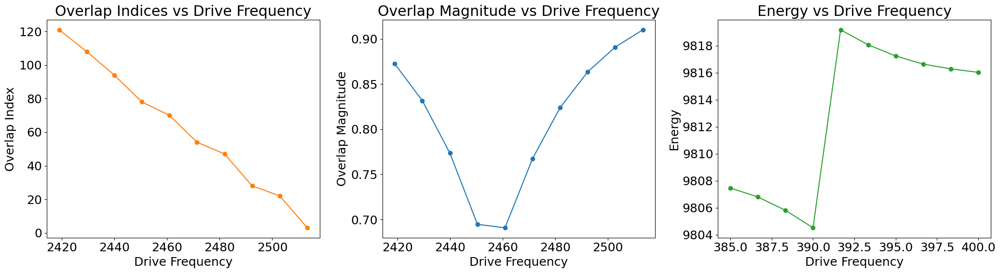

In [108]:
two_state_label = '|2,0,0>'
single_state_label = '|1,0,0>'
adag = coup_ham.a_dag
overlaps = []
overlap_idxs = []
energies = []

alice_result = coup_analysis.calculate_coupled_uncoupled_dressed_overlaps_and_energies(
                floquet_class_uncoup, floquet_class_coup, return_args_uncoup, return_args_coup, single_state_label
            )
for idx, freq in enumerate(return_args_coup['frequencies']):
    state1 = coup_ham.basis_states[coup_ham.ket_to_basis_index(single_state_label)]

    # Find the state in the uncoupled modes
    overlap_idx, overlap = floquet_class_coup.find_max_overlap_indices(
    state1, return_args_coup['modes'][idx], return_overlaps=True
    )
    print(f"Overlap index: {overlap_idx[0]}, Overlap: {overlap[0]}")
    
    # now apply the a_dag operator to the corresponding floquet state 
    floquet_state = return_args_coup['modes'][idx][alice_result['idxs_coup_with_dressed'][idx]]
    qutip_floquet_state = qt.Qobj(floquet_state.full().flatten(), dims=state1.dims)
    print(f"overlap of state1 with floquet state: {state1.overlap(qutip_floquet_state)}")
    adag_state = (adag * qutip_floquet_state).unit()

    # find the floquet state that has the maximum overlap with the floquet state
    overlap_idx, overlap = floquet_class_coup.find_max_overlap_indices(
        adag_state, return_args_coup['modes'][idx], return_overlaps=True
    )

    # FInd energy of asociated floquet state
    dressed_idx = coup_ham.basis_to_dressed_mapping_dict[coup_ham.ket_to_basis_index(two_state_label)]
    dressed_energy = coup_ham.dressed_energies[dressed_idx] 
    quasienergy = return_args_coup['energies'][idx][overlap_idx[0]]
    mapping = floquet_class_coup.map_quasienergy_to_dressed_energy(
        quasienergy, dressed_energy, freq
    )
    energy = mapping['closest_quasienergy']
    energies.append(energy)

    #store the overlaps and indices
    overlaps.append(overlap[0])
    overlap_idxs.append(overlap_idx[0])
    # Plot energies as a third subplot
fig, axs = plt.subplots(1, 3, figsize=(21, 6))

# Plot overlap indices
axs[0].plot(return_args_coup['frequencies'], overlap_idxs, marker='o', color='tab:orange')
axs[0].set_xlabel('Drive Frequency')
axs[0].set_ylabel('Overlap Index')
axs[0].set_title('Overlap Indices vs Drive Frequency')

# Plot overlaps
axs[1].plot(return_args_coup['frequencies'], np.abs(overlaps), marker='o', color='tab:blue')
axs[1].set_xlabel('Drive Frequency')
axs[1].set_ylabel('Overlap Magnitude')
axs[1].set_title('Overlap Magnitude vs Drive Frequency')

# Plot energies
axs[2].plot(return_args_coup['frequencies']/2/np.pi,np.array( energies)/2/np.pi, marker='o', color='tab:green')
axs[2].set_xlabel('Drive Frequency')
axs[2].set_ylabel('Energy')
axs[2].set_title('Energy vs Drive Frequency')

plt.tight_layout()

In [47]:
state1.dims

[[5, 5, 5], [1, 1, 1]]

In [65]:
state = '|1,0,0>'
alice_result = coup_analysis.calculate_coupled_uncoupled_dressed_overlaps_and_energies(
                floquet_class_uncoup, floquet_class_coup, return_args_uncoup, return_args_coup, state
            )

In [ ]:
alice_result['idxs_coup_with_uncoupled'][idx]

[25, 20, 12, 6, 1, 112, 116, 104, 102, 91]

#### Normal Analysis

In [95]:
state.norm()

1.0

Running full g and Kerr analysis...
Processed two-photon state: |2,0,0>
Processed two-photon state: |0,2,0>
Processed two-photon state: |0,0,2>


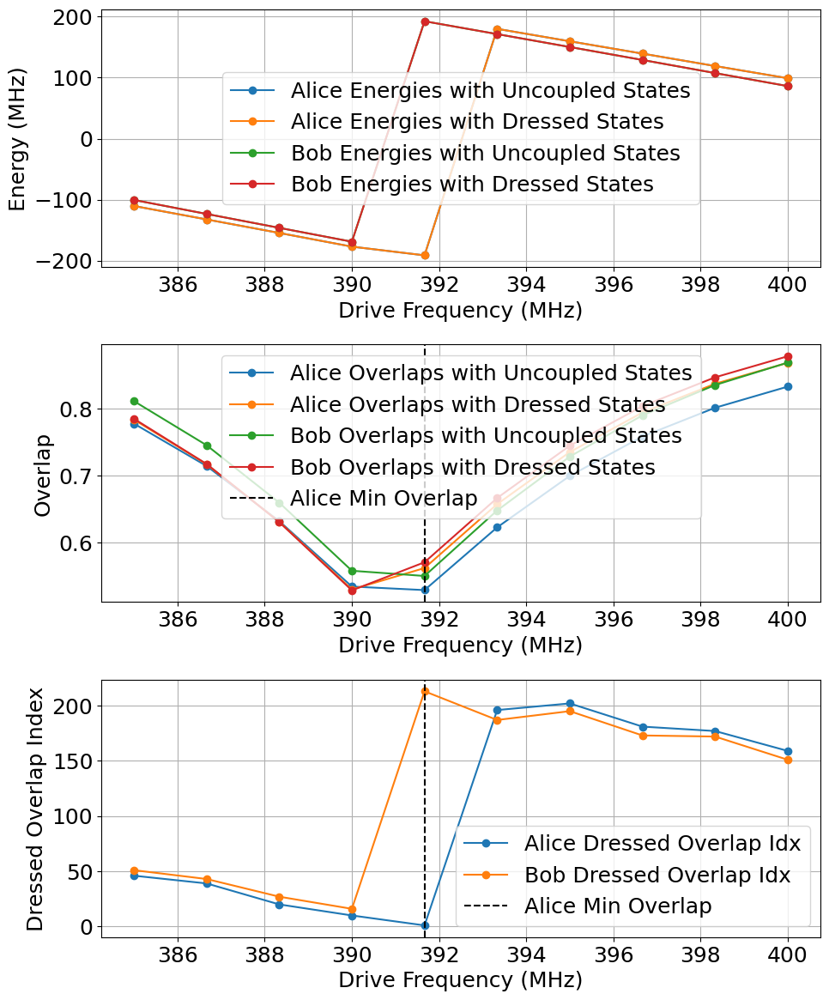

Saving plot to C:\Users\eeshg\Documents\multimode_sims\data\2025-06-17\plots\coupled_uncoupled_dressed_overlaps_and_energies_22.png
Minimum frequency: 391.6666666666667 MHz, Minimum index: 4


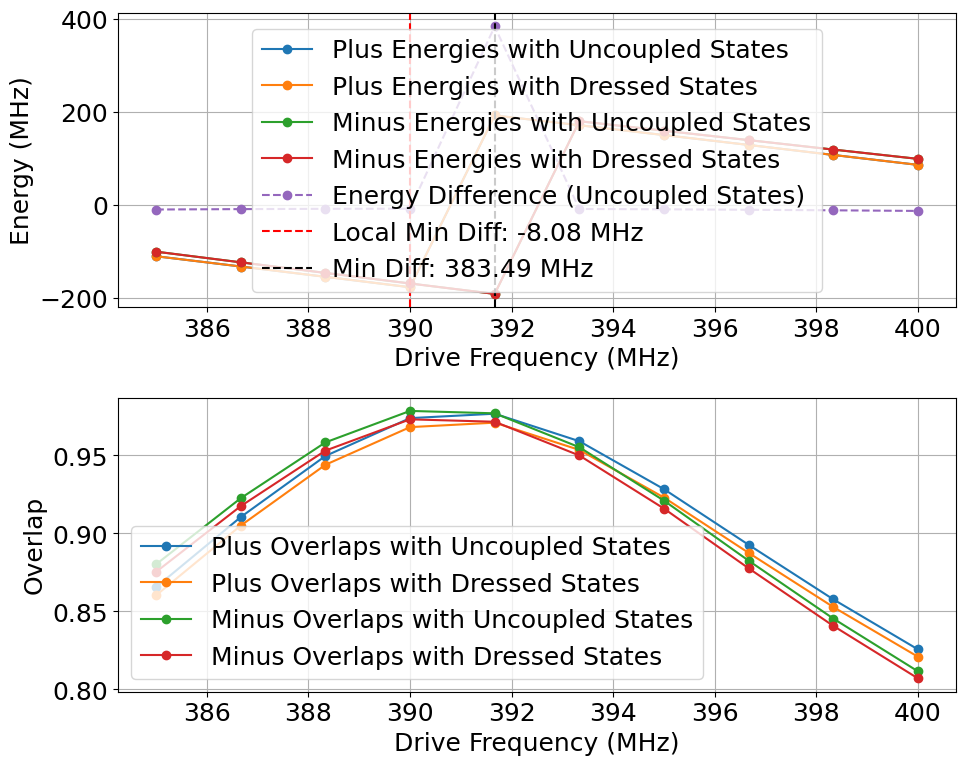

Saving plot to C:\Users\eeshg\Documents\multimode_sims\data\2025-06-17\plots\coupled_uncoupled_dressed_overlaps_and_energies_23.png


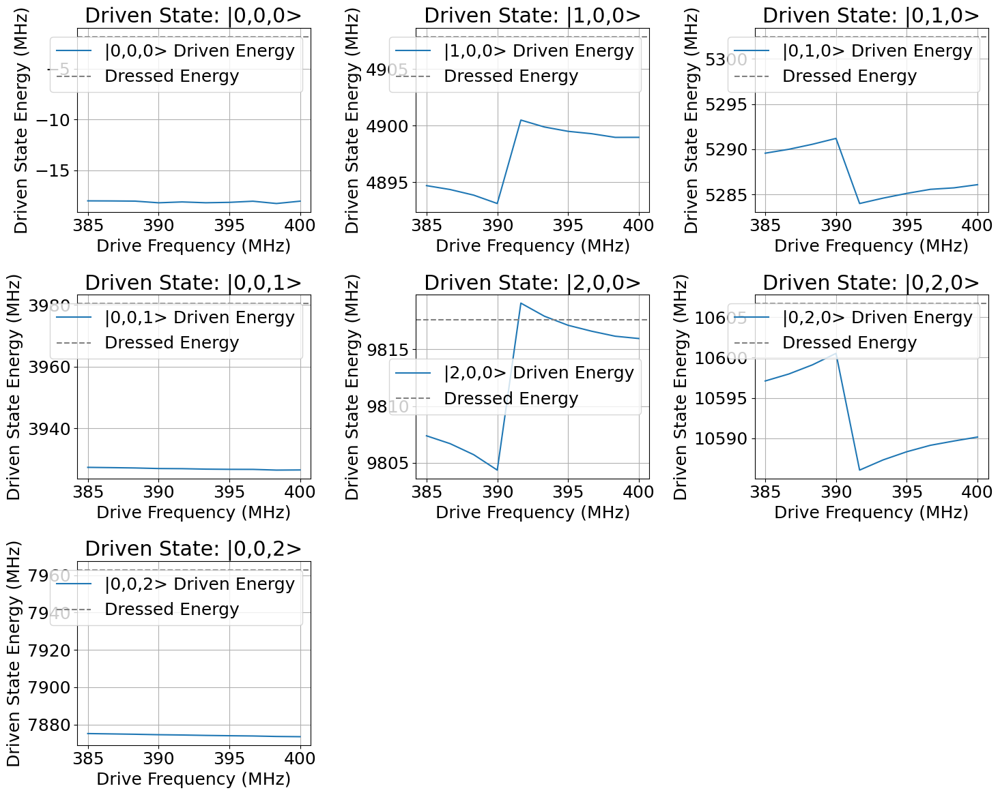

Saving plot to C:\Users\eeshg\Documents\multimode_sims\data\2025-06-17\plots\dressed_state_frequency_shift_11.png
Saving plot to C:\Users\eeshg\Documents\multimode_sims\data\2025-06-17\plots\kerr_shifts_vs_drive_frequency_5.png


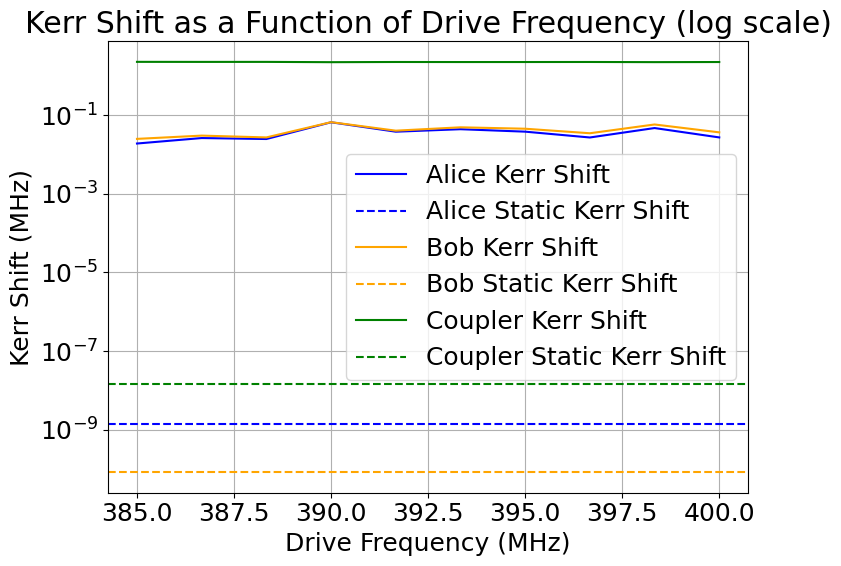

In [134]:
coup_analysis = coupler_driving_analysis(sim_name='coupler_driving_analysis',
                                        plots_dir=troyonium_dir,
                                        save_dir=troyonium_dir,
                                        coupler_ham = coup_ham)
return_dict = coup_analysis.run_full_g_kerr_analysis( floquet_class_uncoup, floquet_class_coup, return_args_uncoup, return_args_coup, 
                                    )

In [145]:
return_dict['kerr_dict']['alice_kerr']/2/np.pi, return_dict['kerr_dict']['bob_kerr']/2/np.pi, return_dict['kerr_dict']['coupler_kerr']/2/np.pi

(array([-0.01899656, -0.02616712, -0.02471188, -0.06589899, -0.03796009,
        -0.04388591, -0.03803581, -0.02704296, -0.04699004, -0.02714525]),
 array([-0.02492664, -0.03017867, -0.02715486, -0.06632866, -0.0403079 ,
        -0.04907118, -0.04516555, -0.03465581, -0.05792202, -0.03652592]),
 array([2.26578716, 2.25935911, 2.2611787 , 2.22253382, 2.24725532,
        2.24041868, 2.24280469, 2.24842843, 2.22867679, 2.24279457]))

In [140]:
2*coup_ham.E_J/coup_ham.E_L

0.5714285714285715

In [144]:
0.57**2 *coup_ham.E_C/2/np.pi * (0.2*np.pi)**2

7.695922727793436

In [76]:
coup_ham.b_dag

Quantum object: dims=[[5, 5, 5], [5, 5, 5]], shape=(125, 125), type='oper', dtype=Dia, isherm=False
Qobj data =
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

In [64]:
return_dict.keys()

dict_keys(['g_BS', 'delta_BS', 'freq_shifts', 'dressed_energies', 'kerr_dict'])

In [289]:
# I have a function sin(eps sin(omega_dt)) 
# this is a bessel function, find the component which is 0*omegad
def bessel_zero_component(amp, omega_dt):
    """Calculate the zero component of the Bessel function."""
    from scipy.special import jn
    return jn(0, amp * np.sin(omega_dt))
amp = 0.005
omega_dt = 1100 * 2 * np.pi
bessel_zero = bessel_zero_component(amp, omega_dt)
print(f"Bessel zero component: {bessel_zero}")

Bessel zero component: 1.0


In [303]:
coup_ham.theta_zpt**4

3.7878787878787885

In [304]:
(coup_ham.E_C/coup_ham.E_L)

1.893939393939394

The combinatorial formula for choosing 4 elements from 4 distinct elements (`A, B, C, D`), where **exactly one element is repeated twice** and the other two are all different (i.e., the multiset is of the form `{x, x, y, z}` with `x, y, z` all distinct), is:

\[
\text{Number of ways} = \binom{4}{1} \times \binom{3}{2} \times \frac{4!}{2!1!1! \cdot 3!}
\]

But let's break it down:

1. **Choose the element to be repeated:**  
    There are 4 choices (`A`, `B`, `C`, or `D`).

2. **Choose the other two distinct elements:**  
    Choose 2 out of the remaining 3 elements: \(\binom{3}{2} = 3\).

3. **Arrange the 4 elements (taking into account the repetition):**  
    The number of unique arrangements of the multiset `{x, x, y, z}` is \(\frac{4!}{2!1!1!} = 12\).

So, the total number is:
\[
4 \times 3 \times 12 = 144
\]

However, if you only care about the **unique multisets** (not arrangements), then it's:
\[
4 \times 3 = 12
\]
(because for each choice of repeated element, and each choice of 2 others, you get a unique multiset).

**Summary:**
- **Unique multisets:** \(4 \times 3 = 12\)
- **Ordered arrangements:** \(4 \times 3 \times 12 = 144\)

In [243]:
state_labels = ['|0,0,0>', '|0,0,1>', '|0,0,2>' , 
                '|0,1,0>', '|0,2,0>',  
                '|1,0,0>', '|2,0,0>', ]
# find the dressed energies 
dressed_energies = {}
static_energies = {}
for state in state_labels:
    dressed_energies[state] = coup_ham.get_dressed_energy(state)
    static_energies[state] = coup_ham.basis_energies[coup_ham.ket_to_basis_index(state)]

# Print the static Kerrs 
coupler_static = coup_analysis.get_kerr(static_energies['|0,0,0>'], static_energies['|0,0,1>'], static_energies['|0,0,2>'])
coupler_dressed = coup_analysis.get_kerr(dressed_energies['|0,0,0>'], dressed_energies['|0,0,1>'], dressed_energies['|0,0,2>'])
print(f"Coupler static Kerr: {coupler_static}")
print(f"Coupler dressed Kerr: {coupler_dressed}")

# do for alice 
alice_static = coup_analysis.get_kerr(static_energies['|0,0,0>'], static_energies['|0,1,0>'], static_energies['|0,2,0>'])
alice_dressed = coup_analysis.get_kerr(dressed_energies['|0,0,0>'], dressed_energies['|0,1,0>'], dressed_energies['|0,2,0>'])
print(f"Alice static Kerr: {alice_static}")
print(f"Alice dressed Kerr: {alice_dressed}")

# do for bob
bob_static = coup_analysis.get_kerr(static_energies['|0,0,0>'], static_energies['|1,0,0>'], static_energies['|2,0,0>'])
bob_dressed = coup_analysis.get_kerr(dressed_energies['|0,0,0>'], dressed_energies['|1,0,0>'], dressed_energies['|2,0,0>'])
print(f"Bob static Kerr: {bob_static}")
print(f"Bob dressed Kerr: {bob_dressed}")



Coupler static Kerr: 1.4551915228366852e-11
Coupler dressed Kerr: 0.12051485365373082
Alice static Kerr: 0.0
Alice dressed Kerr: 0.003864513913867995
Bob static Kerr: 1.4551915228366852e-11
Bob dressed Kerr: 0.08130369882564992


In [ ]:
static_energies

{'|0,0,0>': 0.0,
 '|0,0,1>': 40840.70449666731,
 '|0,0,2>': 81681.40899333464,
 '|0,1,0>': 37699.11184307752,
 '|0,2,0>': 75398.22368615503,
 '|1,0,0>': 30787.608005179973,
 '|2,0,0>': 61575.21601035996}

In [261]:
print(dressed_energies['|0,0,1>'] - dressed_energies['|0,0,0>'])
print(dressed_energies['|0,0,2>'] - dressed_energies['|0,0,0>'])

40813.62165628647
81627.3638274266


In [263]:
(81627.3638274266 - 2*40813.62165628647)/2/np.pi

0.019180534674987624

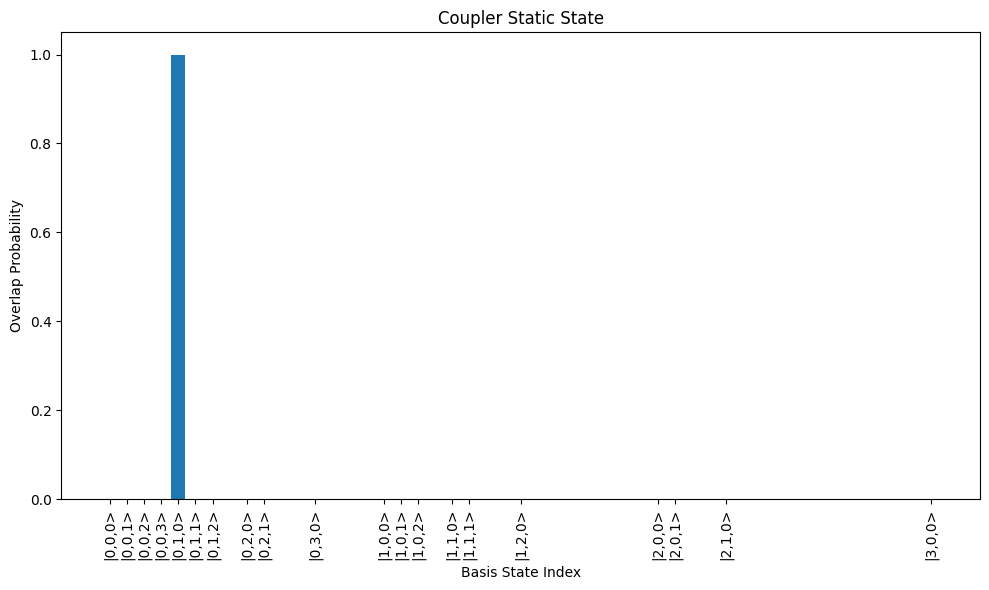

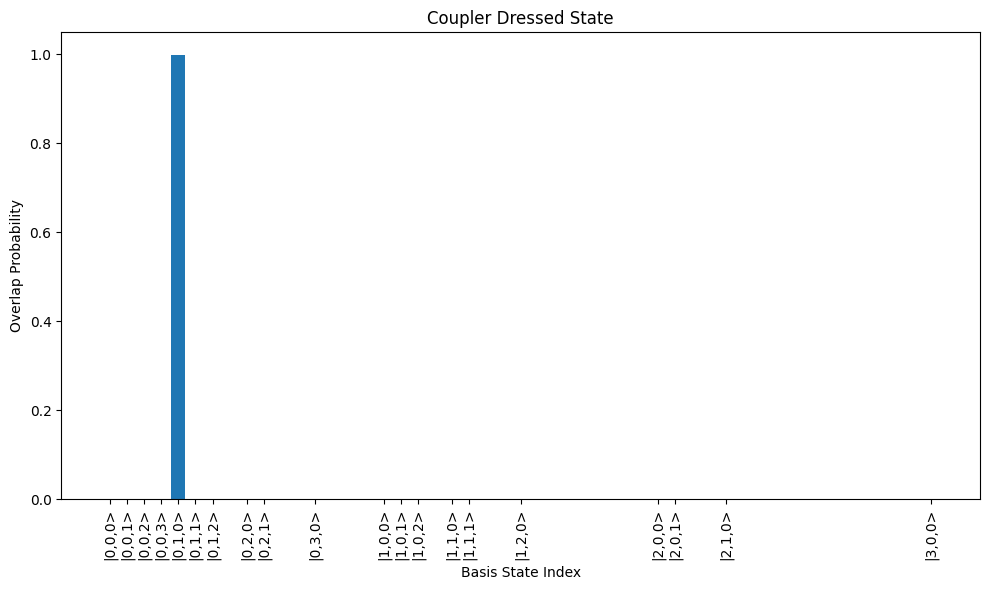

In [253]:
coupler_static_state = coup_ham.basis_states[coup_ham.ket_to_basis_index('|0,1,0>')]
coupler_dressed_state = coup_ham.get_dressed_state('|0,1,0>')

coup_ham.plot_basis_state_overlap(coupler_static_state, title='Coupler Static State')
coup_ham.plot_basis_state_overlap(coupler_dressed_state, title='Coupler Dressed State')


In [247]:
return_dict['kerr_dict']['alice_static_kerr']

0.08130369882564992

In [89]:
# return_args_uncoup = floquet_class_uncoup.load_sweep_results('sweep_ac_drive_frequency_5')
# return_args_coup = floquet_class_coup.load_sweep_results('sweep_ac_drive_frequency_6')

In [152]:
return_args_coup['frequencies']

array([6880.08791136, 6882.65247679, 6885.21704222, 6887.78160766,
       6890.34617309, 6892.91073852, 6895.47530395, 6898.03986938,
       6900.60443481, 6903.16900025, 6905.73356568, 6908.29813111,
       6910.86269654, 6913.42726197, 6915.9918274 , 6918.55639283,
       6921.12095827, 6923.6855237 , 6926.25008913, 6928.81465456,
       6931.37921999, 6933.94378542, 6936.50835085, 6939.07291629,
       6941.63748172, 6944.20204715, 6946.76661258, 6949.33117801,
       6951.89574344, 6954.46030888, 6957.02487431, 6959.58943974,
       6962.15400517, 6964.7185706 , 6967.28313603, 6969.84770146,
       6972.4122669 , 6974.97683233, 6977.54139776, 6980.10596319,
       6982.67052862, 6985.23509405, 6987.79965948, 6990.36422492,
       6992.92879035, 6995.49335578, 6998.05792121, 7000.62248664,
       7003.18705207, 7005.75161751])

In [153]:
fname

'FloquetHamiltonian_7'

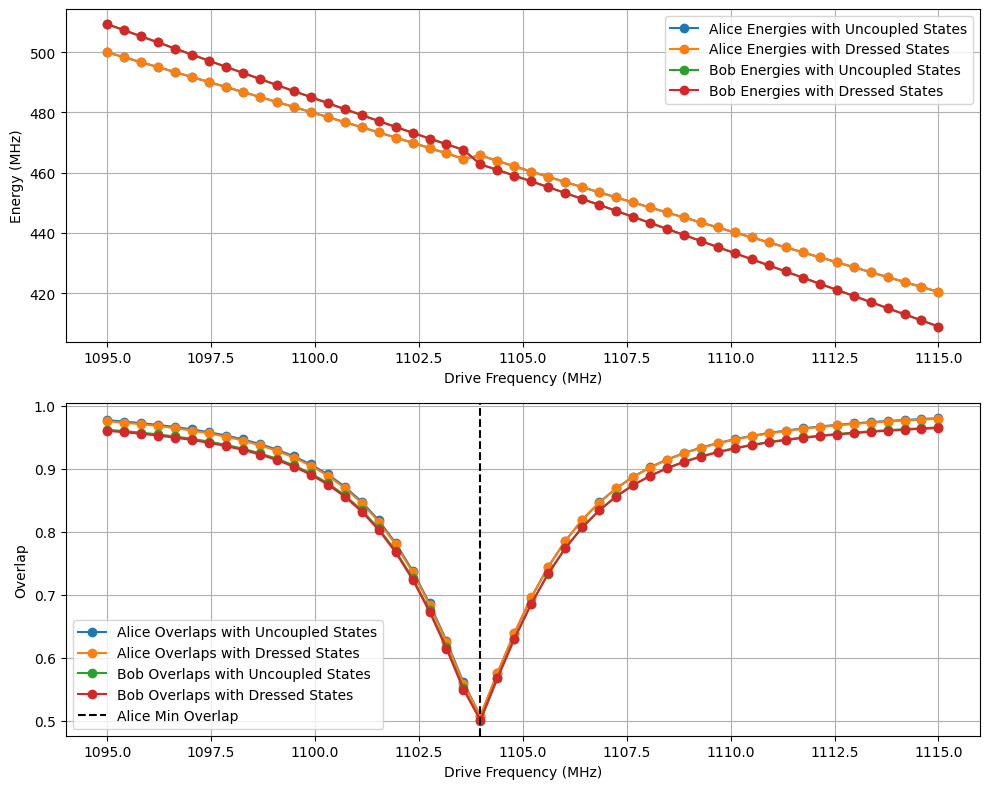

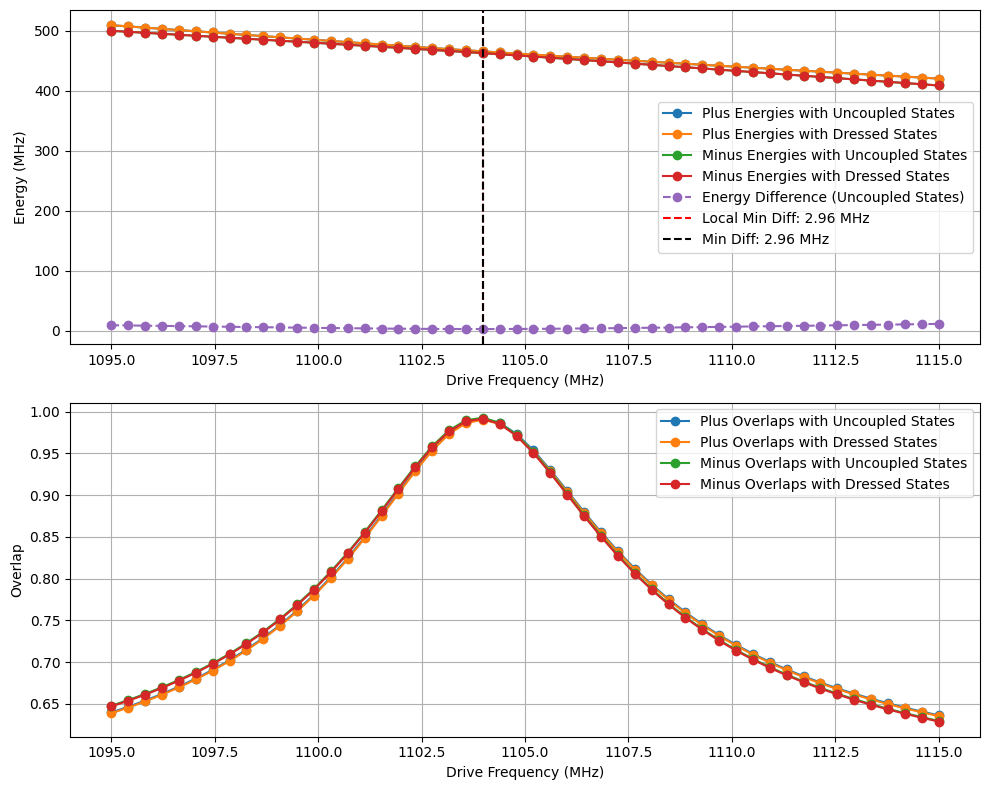

In [154]:
coup_analysis = coupler_driving_analysis(sim_name='coupler_driving_analysis',
                                        save_dir=save_dir,
                                        coupler_ham = coup_ham)
# Call the function for Alice and Bob
alice_results = coup_analysis.calculate_coupled_uncoupled_dressed_overlaps_and_energies(
    floquet_class_uncoup, floquet_class_coup,  return_args_uncoup, return_args_coup, '|1,0,0>'
)

bob_results = coup_analysis.calculate_coupled_uncoupled_dressed_overlaps_and_energies(
    floquet_class_uncoup, floquet_class_coup, return_args_uncoup, return_args_coup, '|0,1,0>'
)

min_freq, min_idx = coup_analysis.plot_coupled_uncoupled_dressed_overlaps_and_energies(return_args_coup, 
                                                                 alice_results, 
                                                                 bob_results)
# Call the function for plus and minus states
plus_minus_results = coup_analysis.calculate_overlaps_and_energies_plus_minus(
    floquet_class_uncoup, floquet_class_coup,  return_args_uncoup, return_args_coup, '|1,0,0>', '|0,1,0>'
)
# Plot the results for plus and minus states
min_energy_diff = coup_analysis.plot_plus_minus_overlaps_and_energies(return_args_coup, return_args_uncoup, plus_minus_results, min_idx)



In [209]:
coup_analysis = coupler_driving_analysis(sim_name='coupler_driving_analysis',
                                        save_dir=save_dir,
                                        coupler_ham = coup_ham)

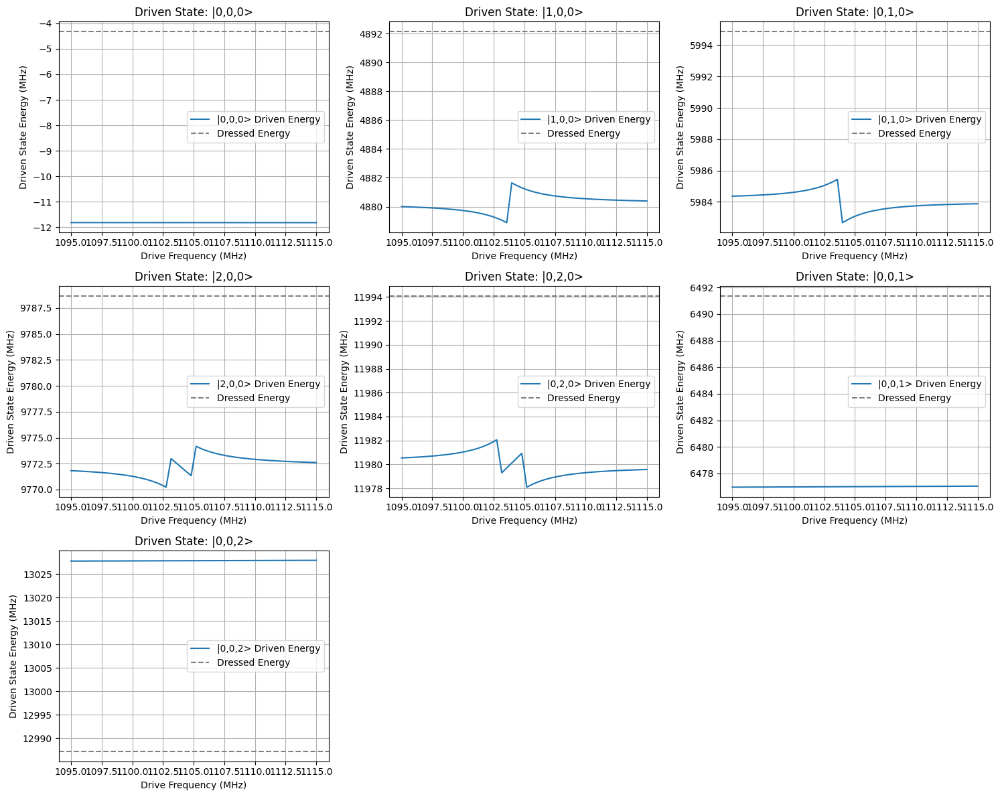

Saving plot to G:\Shared drives\SLab\Multimode\simulation\data\June2025_coupler_sims\2025-06-05\plots\dressed_state_frequency_shift_1.png


In [227]:
state_labels = ['|0,0,0>', '|1,0,0>', '|0,1,0>', '|2,0,0>', '|0,2,0>', '|0,0,1>', '|0,0,2>']
results_dict = {}
for state in state_labels:
    results_dict[state] = coup_analysis.calculate_coupled_uncoupled_dressed_overlaps_and_energies(
        floquet_class_uncoup, floquet_class_coup, return_args_uncoup, return_args_coup, state
    )
freq_shifts, dressed_energies = coup_analysis.plot_dressed_state_frequency_shift(state_labels, return_args_coup, floquet_class_coup, results_dict)


In [216]:
coup_ham.get_participation_factors()

{'alice': -0.062499999999999986, 'bob': -0.09999999999999991}

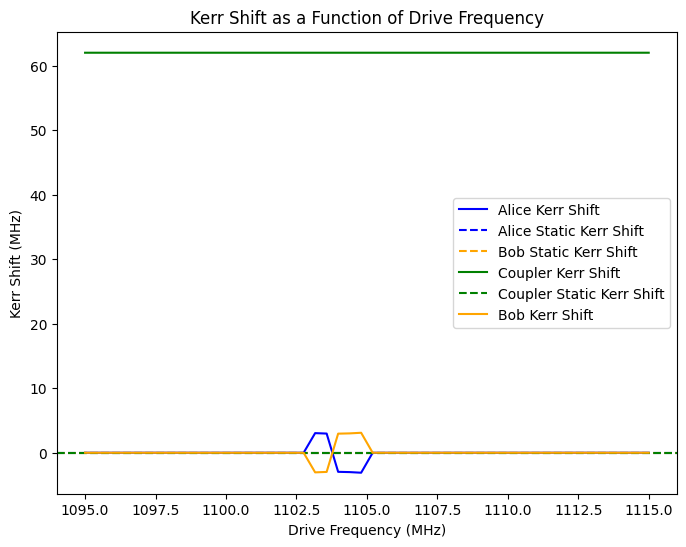

In [220]:
alice_kerr =  (freq_shifts['|2,0,0>'] + freq_shifts['|0,0,0>']) - 2* freq_shifts['|1,0,0>'] 
alice_static_kerr = (dressed_energies['|2,0,0>'] + dressed_energies['|0,0,0>']) - 2 * dressed_energies['|1,0,0>']
bob_kerr =  (freq_shifts['|0,2,0>']+ freq_shifts['|0,0,0>']) - 2* freq_shifts['|0,1,0>']
bob_static_kerr = (dressed_energies['|0,2,0>'] + dressed_energies['|0,0,0>']) - 2 * dressed_energies['|0,1,0>']

coupler_kerr = (freq_shifts['|0,0,2>'] + freq_shifts['|0,0,0>']) - 2 * freq_shifts['|0,0,1>']
coupler_static_kerr = (dressed_energies['|0,0,2>'] + dressed_energies['|0,0,0>']) - 2 * dressed_energies['|0,0,1>']

# plot as a function of drive frequency
plt.figure(figsize=(8, 6))
plt.plot(return_args_coup['frequencies']/2/np.pi, alice_kerr/2/np.pi, label='Alice Kerr Shift', color='blue')
# the static kerrs should be horizontal lines
plt.axhline(alice_static_kerr/2/np.pi, color='blue', linestyle='--', label='Alice Static Kerr Shift')
plt.axhline(bob_static_kerr/2/np.pi, color='orange', linestyle='--', label='Bob Static Kerr Shift')
plt.plot(return_args_coup['frequencies']/2/np.pi, coupler_kerr/2/np.pi, label='Coupler Kerr Shift', color='green')
plt.axhline(coupler_static_kerr/2/np.pi, color='green', linestyle='--', label='Coupler Static Kerr Shift')
# plt.plot(return_args_coup['frequencies']/2/np.pi, bob_static_kerr/2/np.pi, label='Bob Static Kerr Shift', color='orange', linestyle='--')
plt.plot(return_args_coup['frequencies']/2/np.pi, bob_kerr/2/np.pi, label='Bob Kerr Shift', color='orange')
plt.xlabel('Drive Frequency (MHz)')
plt.ylabel('Kerr Shift (MHz)')
plt.title('Kerr Shift as a Function of Drive Frequency')
plt.legend()

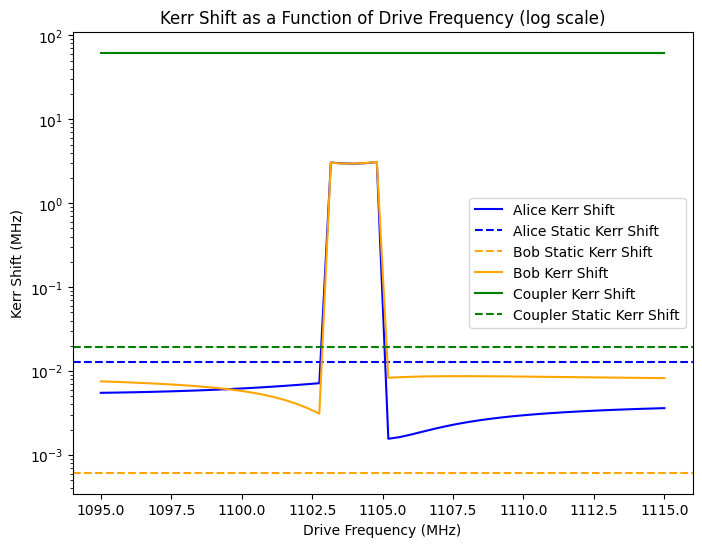

In [222]:

plt.figure(figsize=(8, 6))
plt.plot(return_args_coup['frequencies']/2/np.pi, np.abs(alice_kerr/2/np.pi), label='Alice Kerr Shift', color='blue')
plt.axhline(np.abs(alice_static_kerr/2/np.pi), color='blue', linestyle='--', label='Alice Static Kerr Shift')
plt.axhline(np.abs(bob_static_kerr/2/np.pi), color='orange', linestyle='--', label='Bob Static Kerr Shift')
plt.plot(return_args_coup['frequencies']/2/np.pi, np.abs(bob_kerr/2/np.pi), label='Bob Kerr Shift', color='orange')
plt.plot(return_args_coup['frequencies']/2/np.pi, np.abs(coupler_kerr/2/np.pi), label='Coupler Kerr Shift', color='green')
plt.axhline(np.abs(coupler_static_kerr/2/np.pi), color='green', linestyle='--', label='Coupler Static Kerr Shift')
plt.xlabel('Drive Frequency (MHz)')
plt.ylabel('Kerr Shift (MHz)')
plt.title('Kerr Shift as a Function of Drive Frequency (log scale)')
plt.yscale('log')
plt.legend()

In [223]:
100/(1400)

0.07142857142857142

In [224]:
50/400

0.125

In [172]:
alice_dressed_state_idx = coup_ham.basis_to_dressed_mapping_dict[coup_ham.ket_to_basis_index("|1,0,0>")]
alice_dressed_energy = coup_ham.dressed_energies[alice_dressed_state_idx]
alice_dressed_energy

30738.454536041536

In [173]:
quasienergy = alice_results['energies_coup_with_uncoupled'][0]   
quasienergy

3141.591153129633

In [183]:
(alice_dressed_energy - quasienergy)%return_args_coup['frequencies'][0] 

76.5117374653164

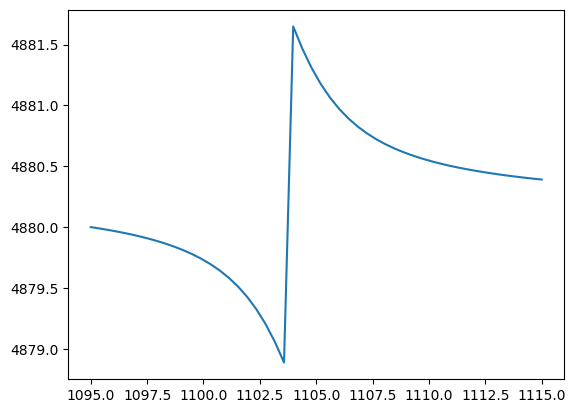

In [ ]:
alice_driven_energy = []
for idx, freq in enumerate(return_args_coup['frequencies']):
    quasienergy = alice_results['energies_coup_with_uncoupled'][idx]
    return_dict = floquet_class_coup.map_quasienergy_to_dressed_energy(quasienergy, alice_dressed_energy, return_args_coup['frequencies'][idx])
    alice_driven_energy.append(return_dict['closest_quasienergy'])
alice_driven_energy = np.array(alice_driven_energy)
plt.plot(return_args_coup['frequencies']/2/np.pi, alice_driven_energy/2/np.pi, label='Alice Driven Energy')

In [ ]:
#mapping quasienergy to dressed state
alice_results.keys(

dict_keys(['overlaps_coup_with_uncoupled', 'energies_coup_with_uncoupled', 'overlaps_coup_with_dressed', 'energies_coup_with_dressed'])

In [155]:
alice_results.keys()

dict_keys(['overlaps_coup_with_uncoupled', 'energies_coup_with_uncoupled', 'overlaps_coup_with_dressed', 'energies_coup_with_dressed'])

In [85]:
min_energy_diff

0.7566020312698924

Text(0, 0.5, 'Energy Difference (MHz)')

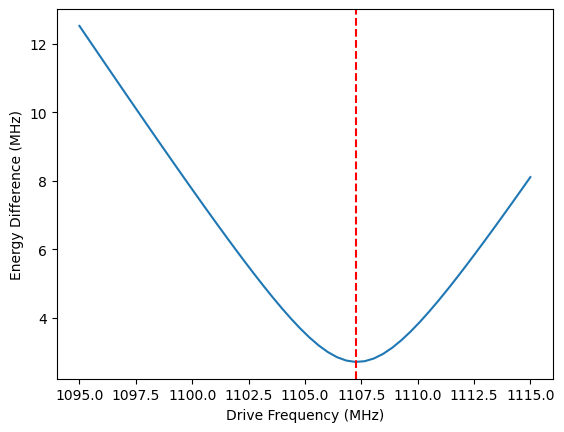

In [91]:
differences = np.array(plus_minus_results['plus_energies_coup_with_uncoupled']) / 2 / np.pi - np.array(plus_minus_results['minus_energies_coup_with_uncoupled']) / 2 / np.pi
freqs = return_args_coup['frequencies'] / 2 / np.pi
idx_start = None
idx_end = None
plt.plot(freqs[idx_start:idx_end], differences[idx_start:idx_end], label='Energy Difference (Coupled - Uncoupled)')
# plt.plot(freqs[idx_start:], differences[idx_start:], label='Energy Difference (Coupled - Uncoupled)')
plt.axvline(x=freqs[min_idx], color='r', linestyle='--', label='Minimum Frequency')
plt.xlabel('Drive Frequency (MHz)')
plt.ylabel('Energy Difference (MHz)')


# plt.yscale('log')

In [141]:
differences[idx_start:idx_end]

array([-1.84943149, -1.4453952 , -1.04136209,  0.        ,  0.23337173,
        0.17094442,  0.57487296,  0.97889384,  1.38292613,  1.78696209])

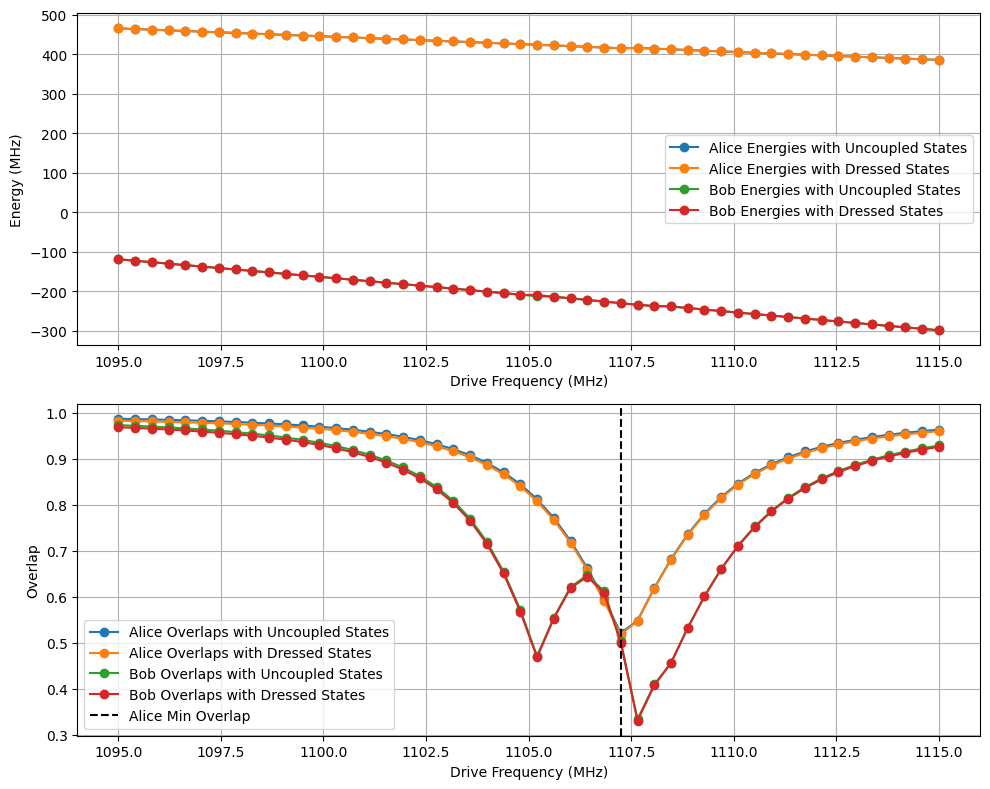

In [92]:
# for alice 2 photon state
alice_two_photon_results = coup_ham.calculate_coupled_uncoupled_dressed_overlaps_and_energies(
    floquet_class_uncoup, floquet_class_coup,  return_args_uncoup, return_args_coup, '|2,0,0>'
)
alice_two_photon_results.keys()

min_freq, min_idx = coup_ham.plot_coupled_uncoupled_dressed_overlaps_and_energies(return_args_coup, 
                                                                 alice_results, 
                                                                 alice_two_photon_results)

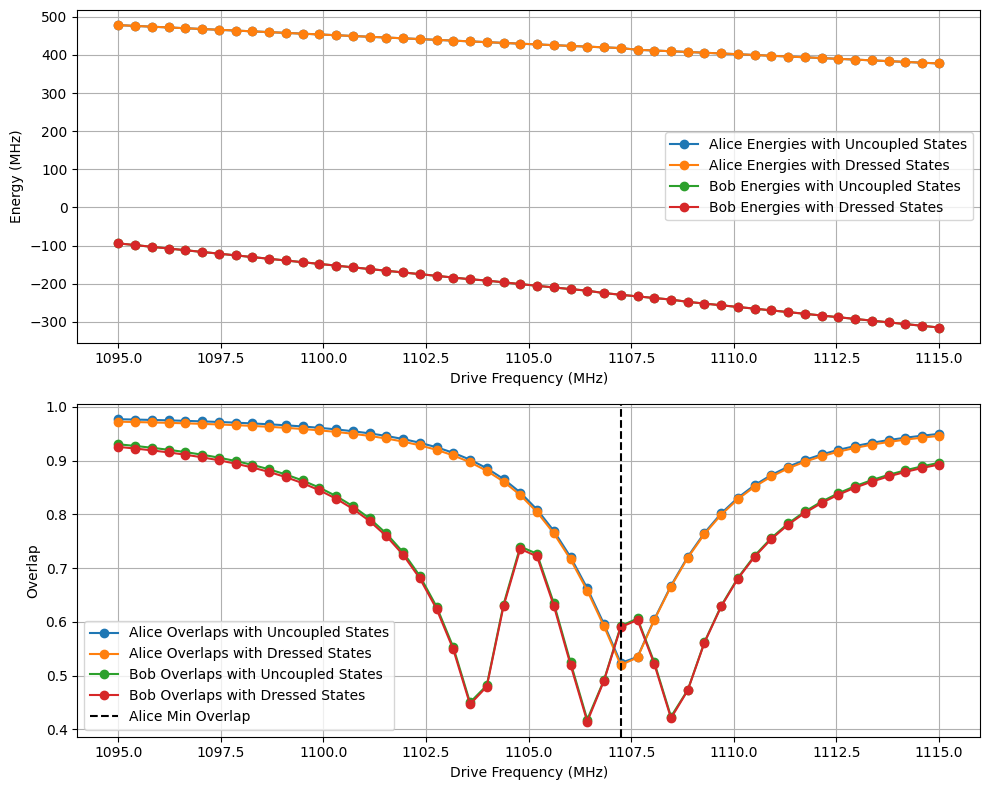

In [93]:
# for alice 2 photon state
alice_two_photon_results = coup_ham.calculate_coupled_uncoupled_dressed_overlaps_and_energies(
    floquet_class_uncoup, floquet_class_coup,  return_args_uncoup, return_args_coup, '|0,2,0>'
)
alice_two_photon_results.keys()

min_freq, min_idx = coup_ham.plot_coupled_uncoupled_dressed_overlaps_and_energies(return_args_coup, 
                                                                 bob_results, 
                                                                 alice_two_photon_results)

In [120]:
alice_two_photon_results.keys()

dict_keys(['overlaps_coup_with_uncoupled', 'energies_coup_with_uncoupled', 'overlaps_coup_with_dressed', 'energies_coup_with_dressed'])

## Sweep Amplitude

In [362]:
troyonium_dir

'C:\\Users\\eeshg\\Documents\\multimode_sims'

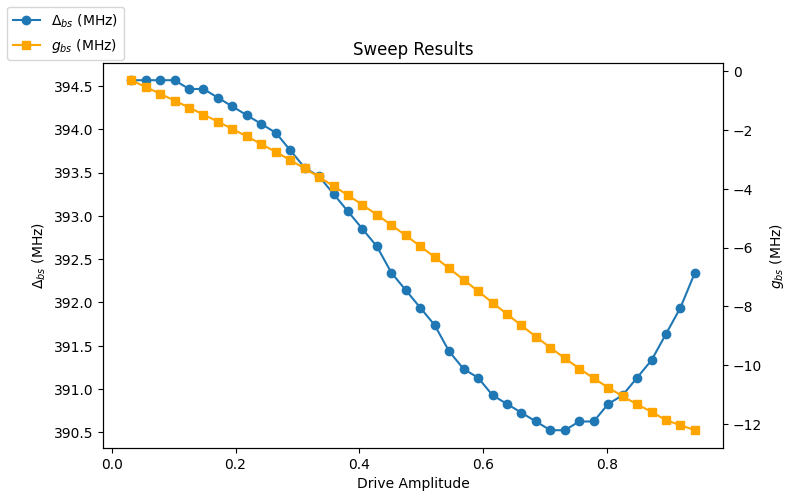

Saving plot to G:\Shared drives\SLab\Multimode\simulation\data\June2025_coupler_sims\2025-06-15\plots\floquet_amp_sweep_results_39.png
Results saved to C:\Users\eeshg\Documents\multimode_sims\data\sweep_amps_and_frequencies_20250616_091330.csv


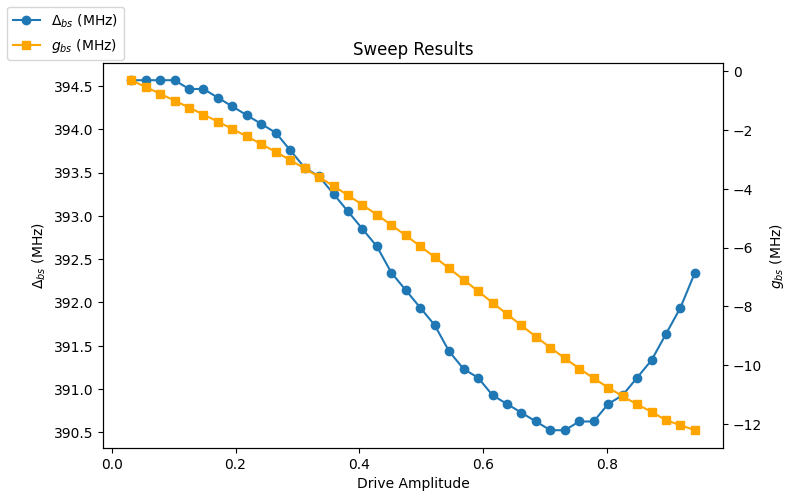

Saving plot to G:\Shared drives\SLab\Multimode\simulation\data\June2025_coupler_sims\2025-06-15\plots\floquet_amp_sweep_results_40.png


In [21]:
amp_list = np.linspace(0.01, 0.3, 40)*np.pi  # Amplitude sweep range
min_freq_for_fq = 388 * 2 * np.pi
max_freq_for_fq = 398 * 2 * np.pi
freq_pts = 100
# Perform the amplitude sweep
coup_analysis = coupler_driving_analysis(sim_name='coupler_amp_sweep_analysis',
                                        save_dir=troyonium_dir,
                                        plots_dir = gdrive_dir,
                                        coupler_ham=coup_ham)
amp_sweep_results = coup_analysis.sweep_floquet_amplitude_and_analyze( amp_list, min_freq_for_fq, max_freq_for_fq, freq_pts)

Text(0.5, 1.0, 'BS Rate vs Drive Amplitude')

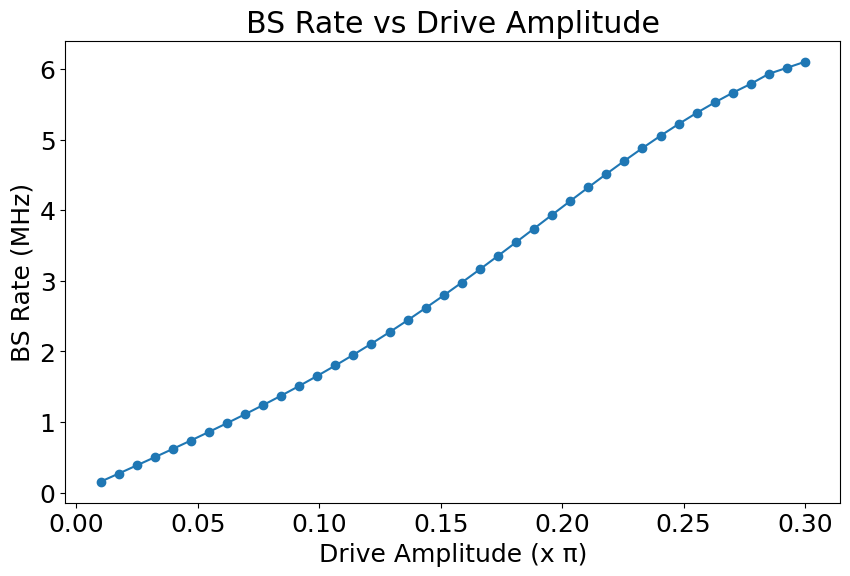

In [31]:
amp_list = amp_sweep_results['amp_list']#/np.pi
bs_rate = np.abs(np.array(amp_sweep_results['g_bs'])/2)
plt.rcParams.update({'font.size': 18})
plt.figure(figsize=(10, 6))
plt.plot(amp_list/np.pi, bs_rate, marker='o', linestyle='-', color='tab:blue')
plt.xlabel('Drive Amplitude (x π)')
plt.ylabel('BS Rate (MHz)')
plt.title('BS Rate vs Drive Amplitude')


In [24]:
amp_sweep_results.keys()

dict_keys(['amp_list', 'uncoupled_fnames', 'coupled_fnames', 'delta_bs', 'g_bs'])

In [75]:
0.3/np.pi

0.0954929658551372

In [14]:
amp_sweep_results.keys()

dict_keys(['amp_list', 'uncoupled_fnames', 'coupled_fnames', 'delta_bs', 'g_bs'])

### Analysze the driven kerr shifts 

c:\Anaconda3\envs\Lib\site-packages\qutip\solver\options.py:16: FutureWarning: Dedicated options class are no longer needed, options should be passed as dict to solvers.
  warnings.warn(


Analyzing amplitude 0.01 at index 0


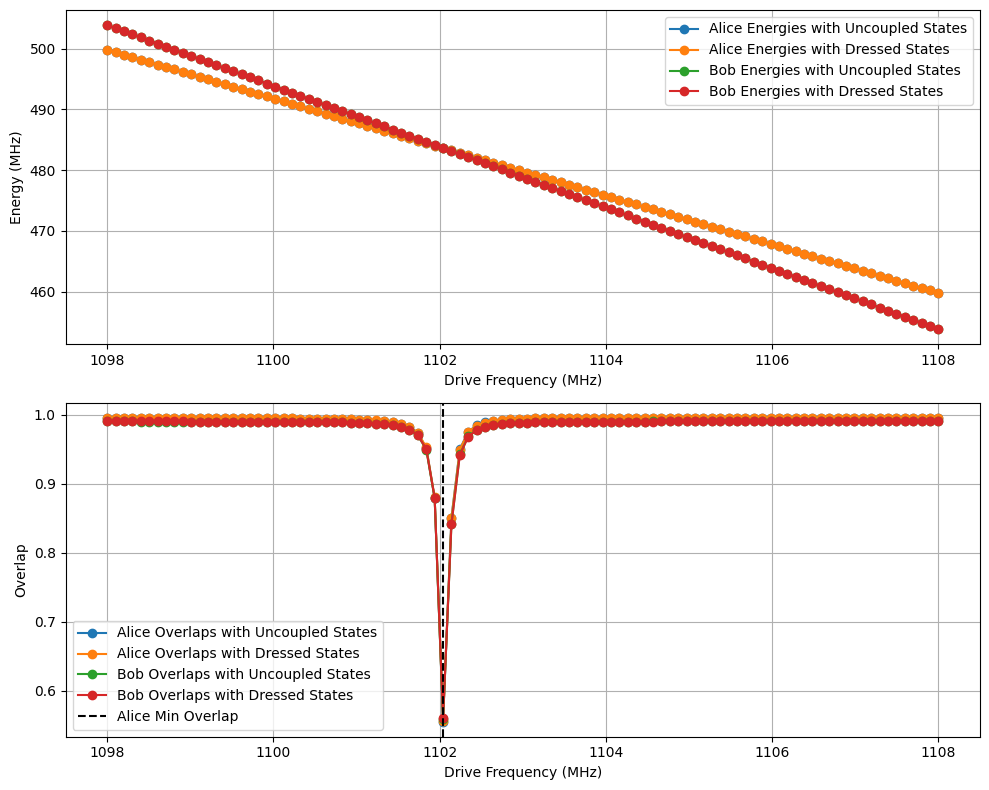

Minimum frequency: 1102.0404040404042 MHz, Minimum index: 40


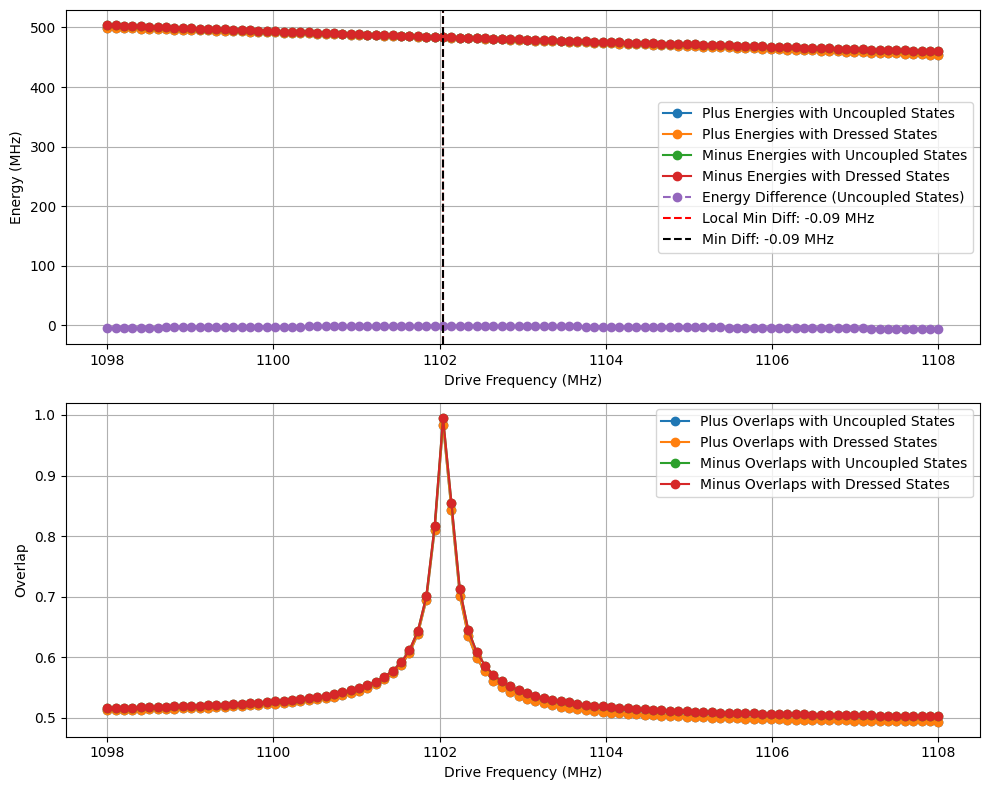

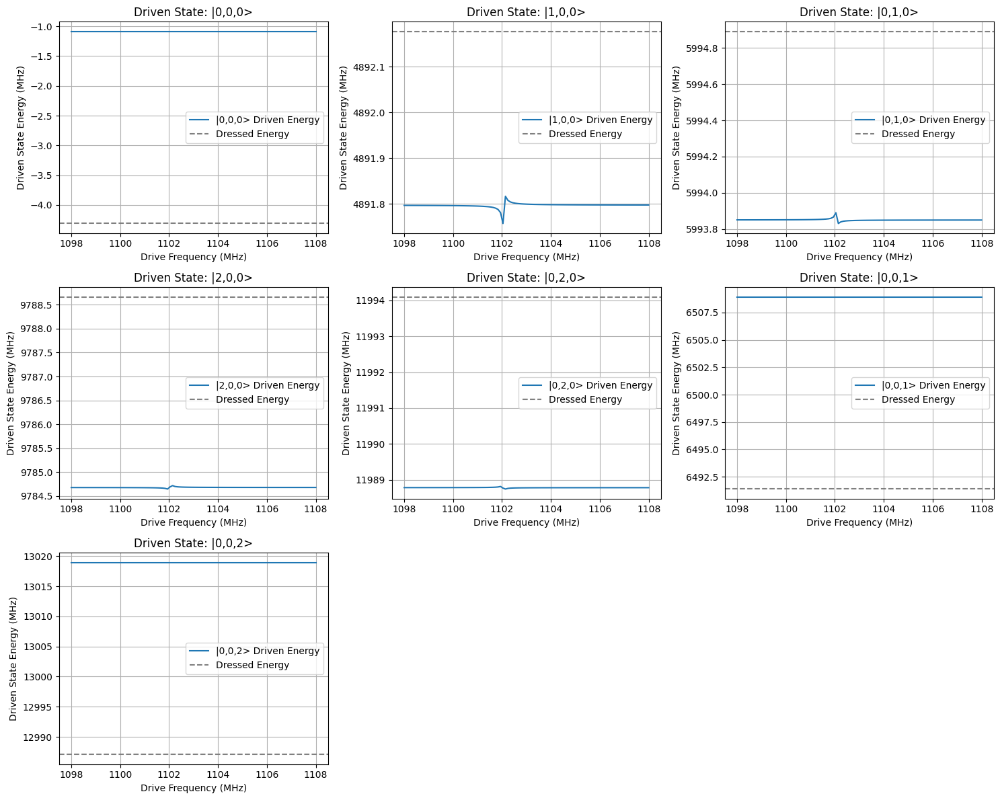

Saving plot to G:\Shared drives\SLab\Multimode\simulation\data\June2025_coupler_sims\2025-06-09\plots\dressed_state_frequency_shift_19.png


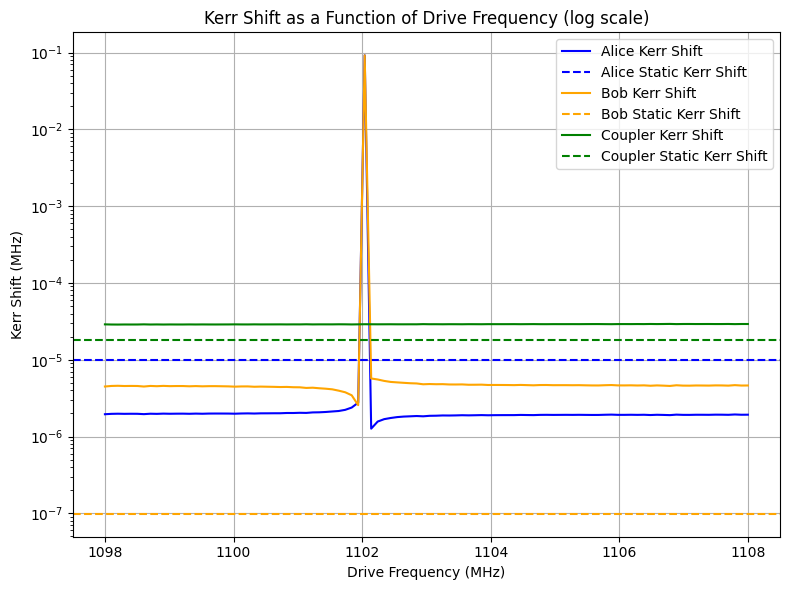

Analyzing amplitude 0.0422222222222222 at index 1


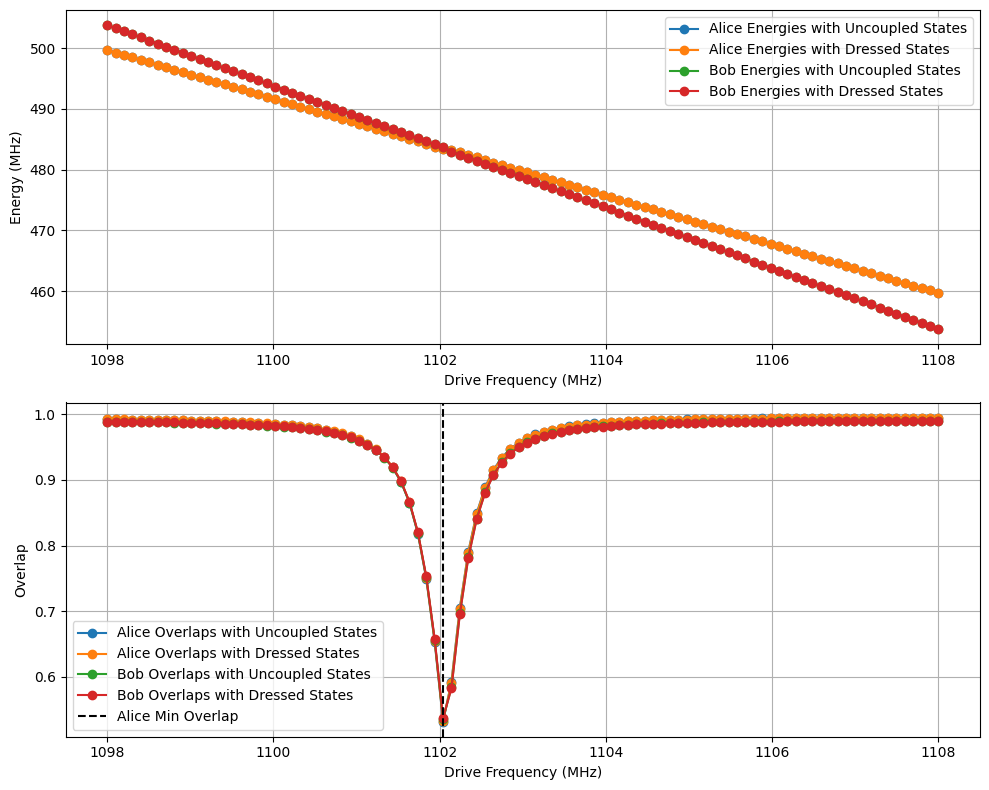

Minimum frequency: 1102.0404040404042 MHz, Minimum index: 40


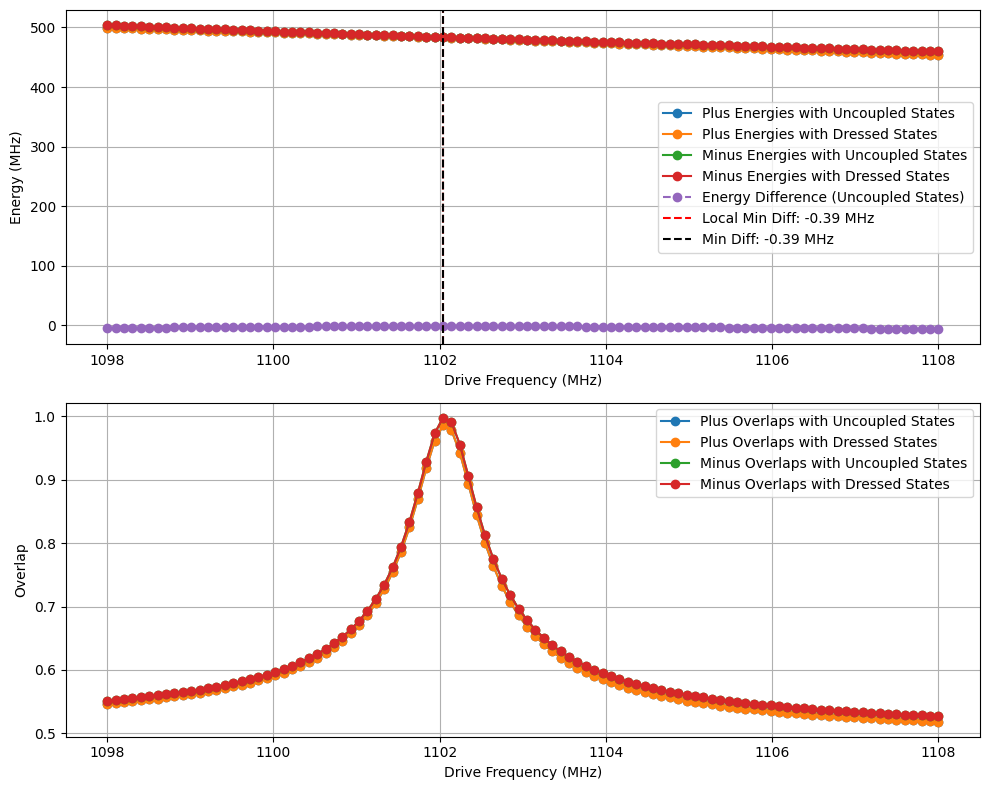

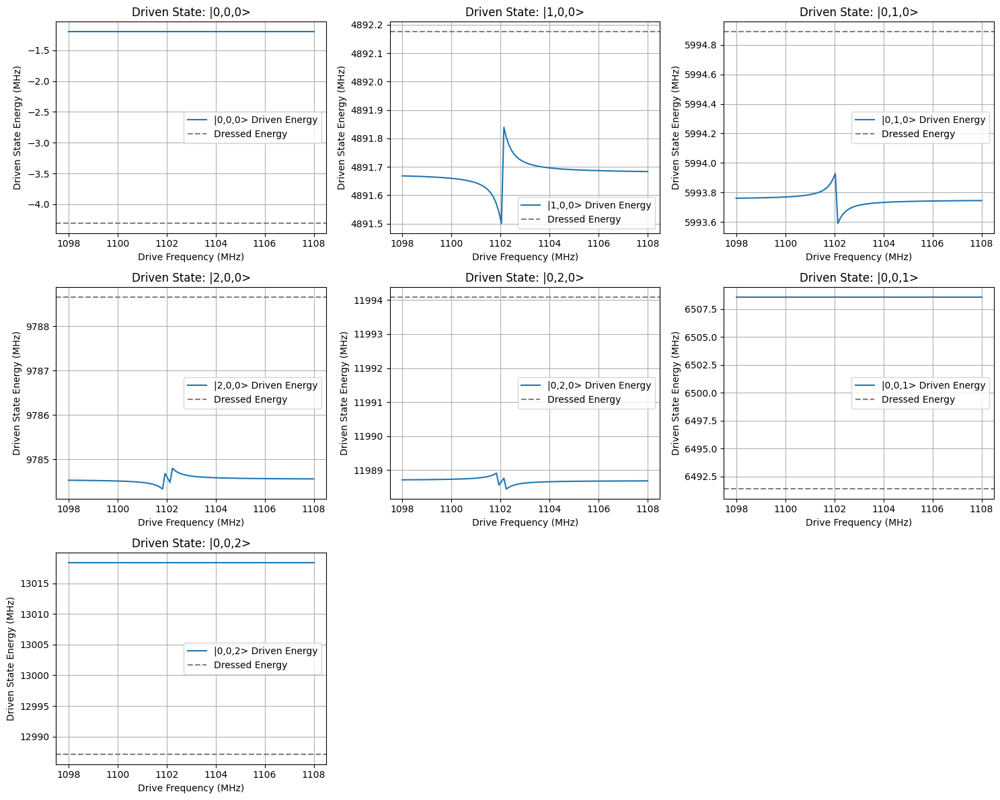

Saving plot to G:\Shared drives\SLab\Multimode\simulation\data\June2025_coupler_sims\2025-06-09\plots\dressed_state_frequency_shift_20.png


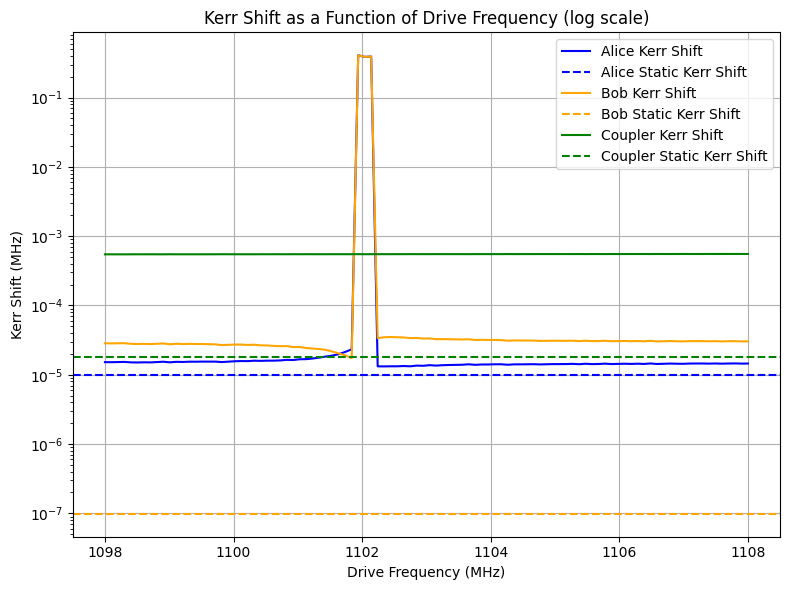

Analyzing amplitude 0.0744444444444444 at index 2


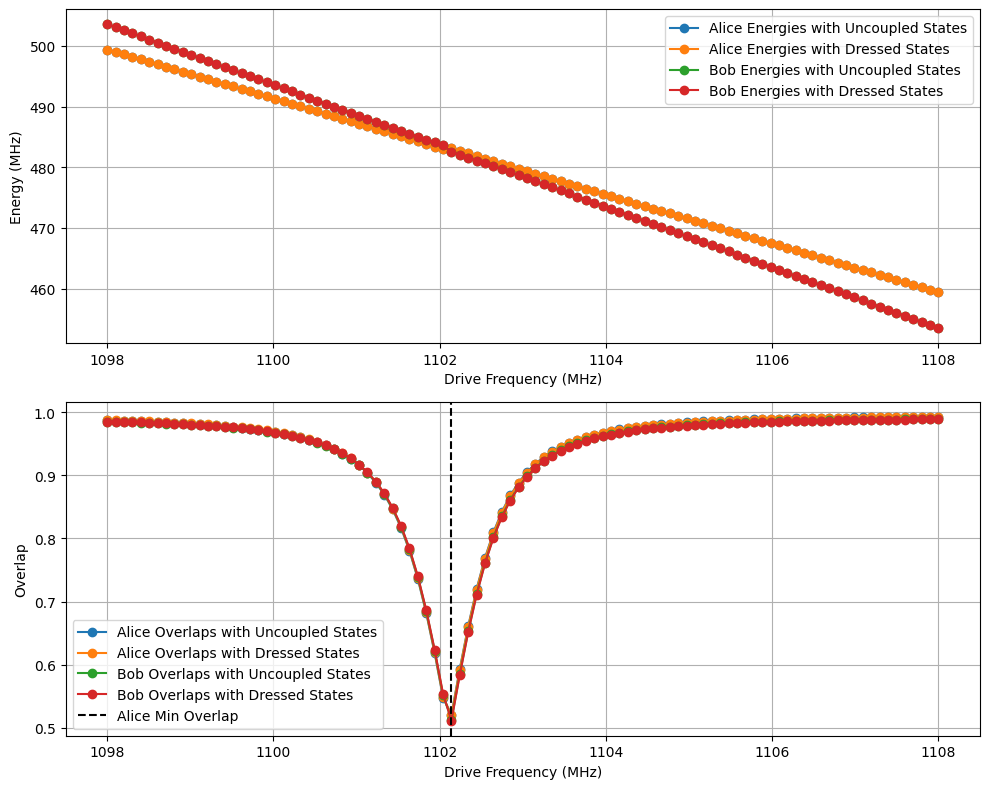

Minimum frequency: 1102.141414141414 MHz, Minimum index: 41


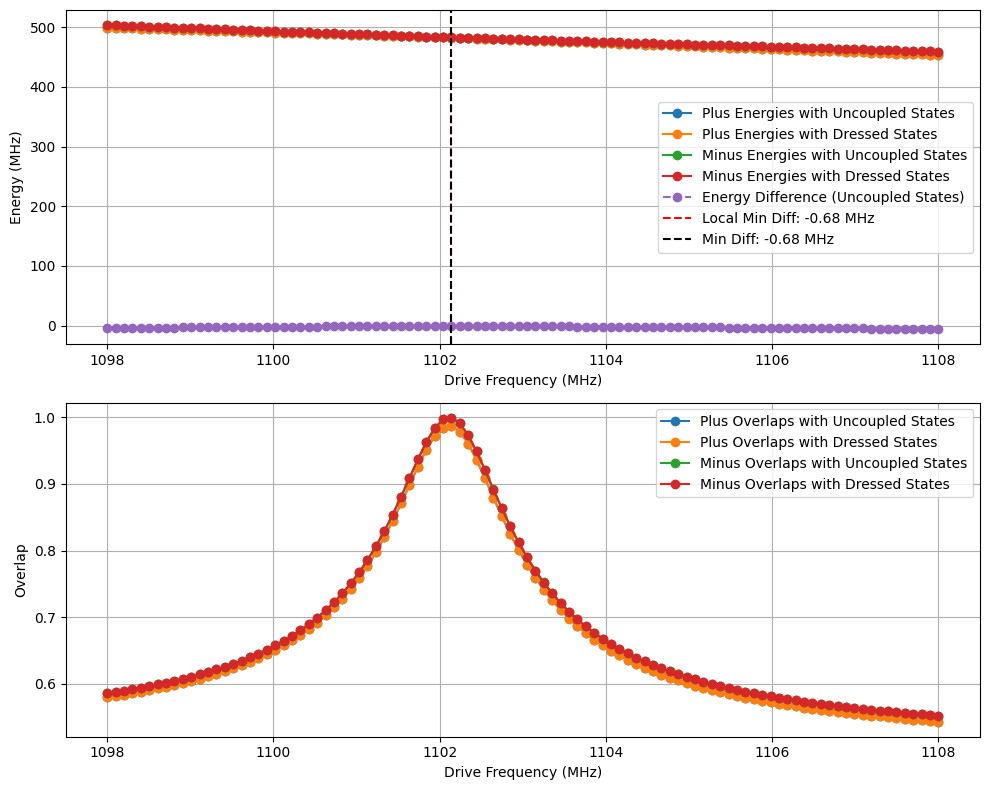

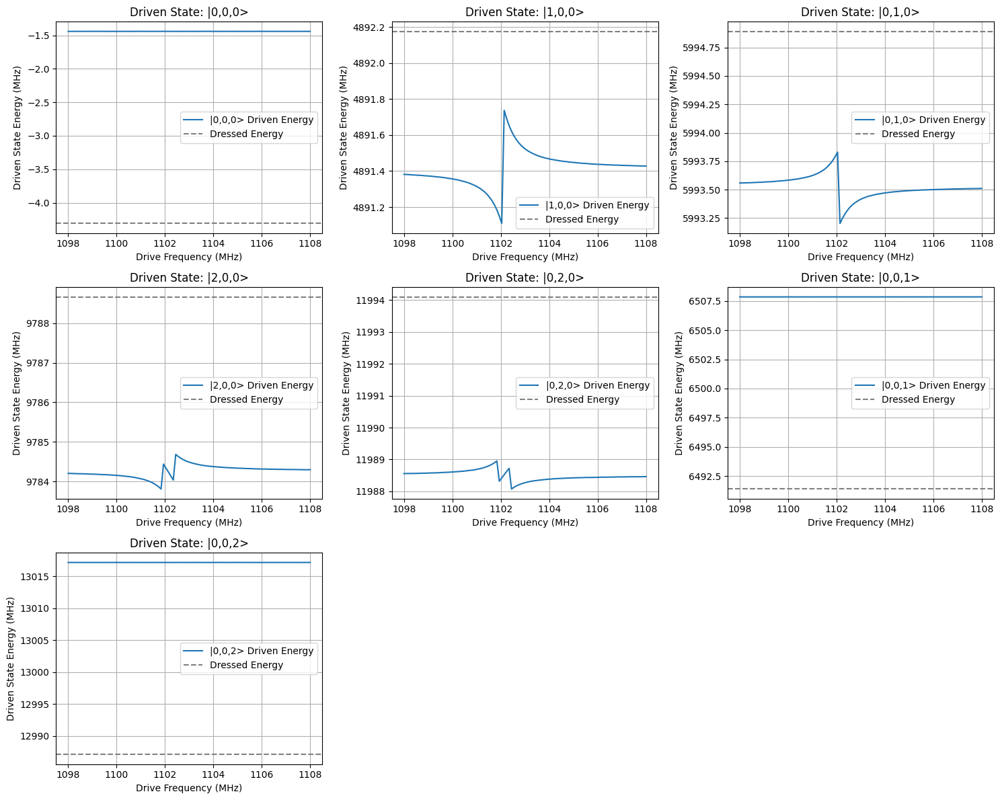

Saving plot to G:\Shared drives\SLab\Multimode\simulation\data\June2025_coupler_sims\2025-06-09\plots\dressed_state_frequency_shift_21.png


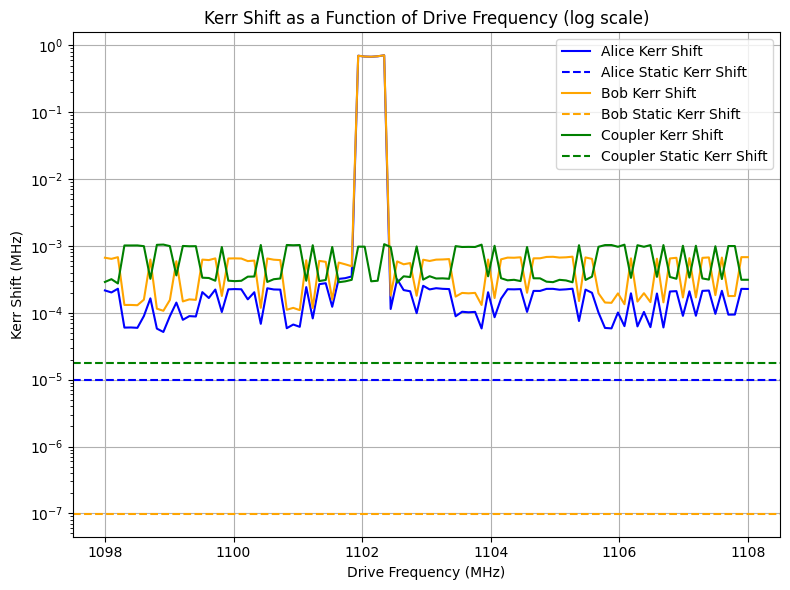

Analyzing amplitude 0.1066666666666666 at index 3


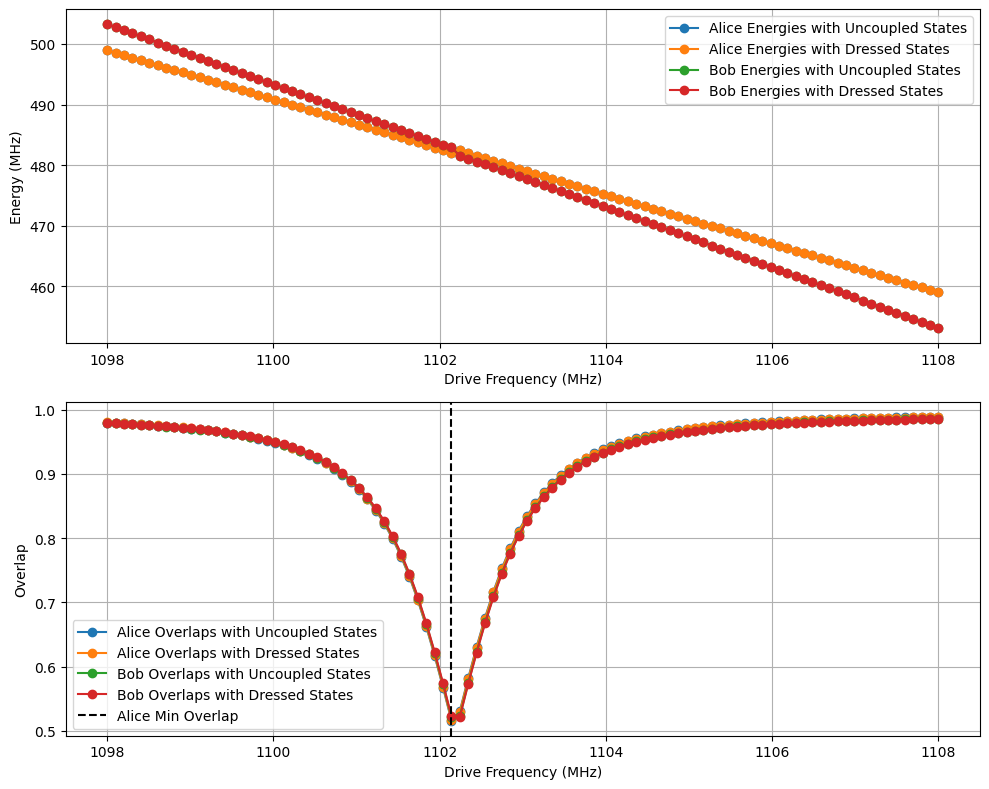

Minimum frequency: 1102.141414141414 MHz, Minimum index: 41


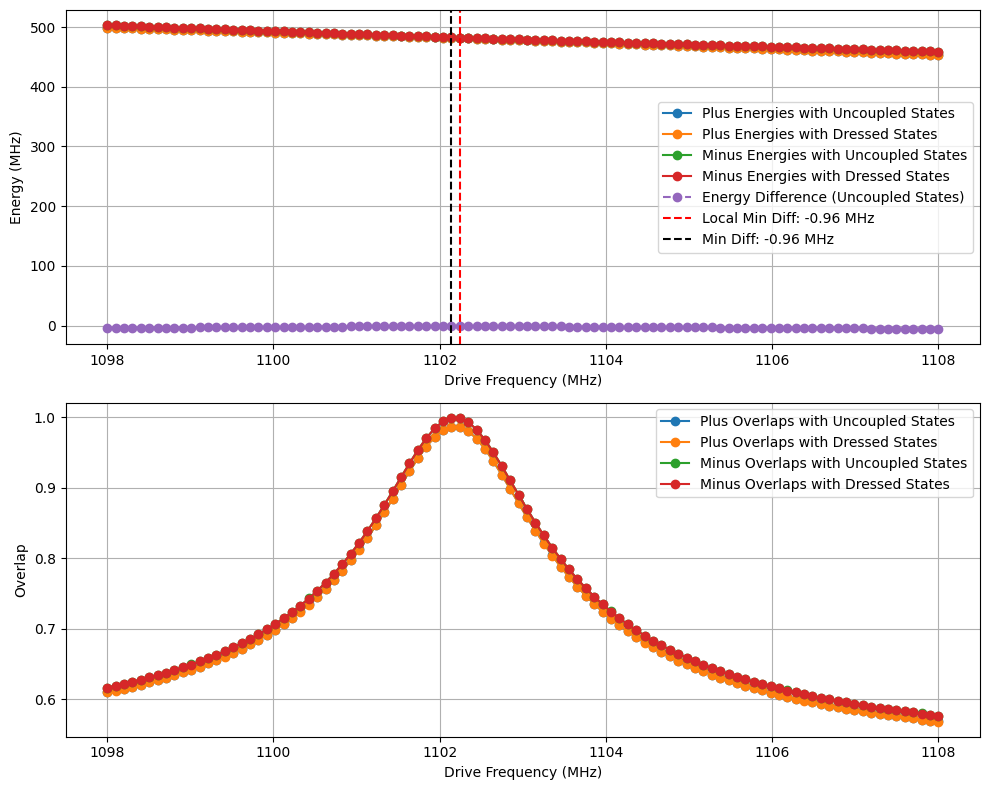

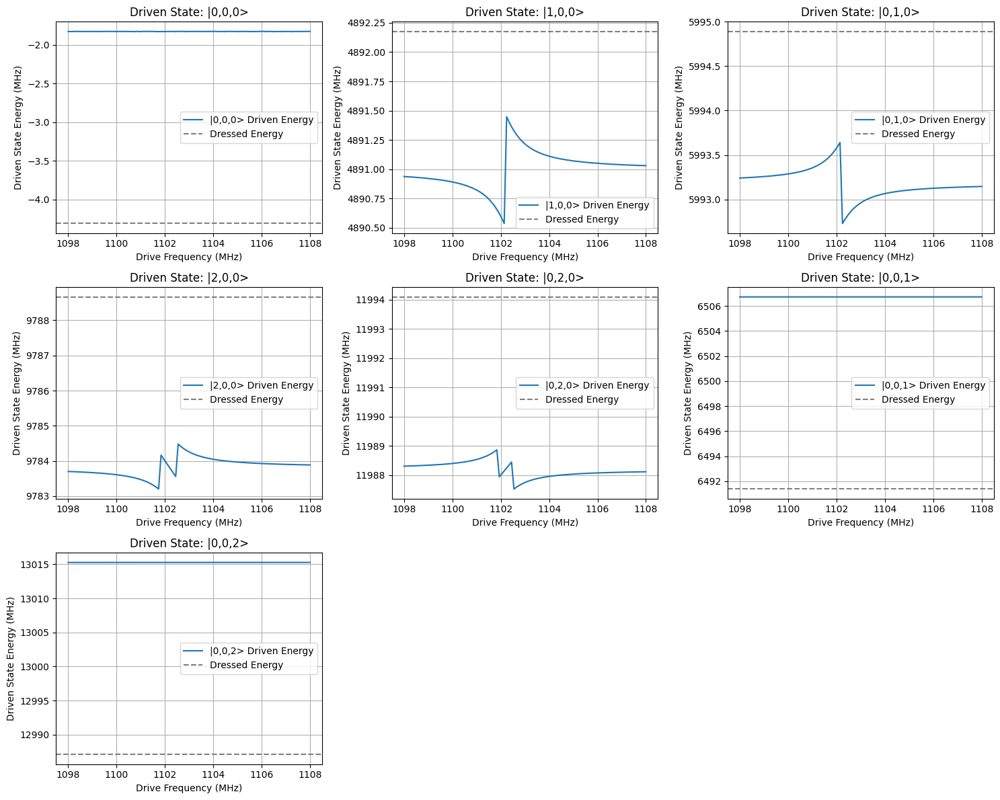

Saving plot to G:\Shared drives\SLab\Multimode\simulation\data\June2025_coupler_sims\2025-06-09\plots\dressed_state_frequency_shift_22.png


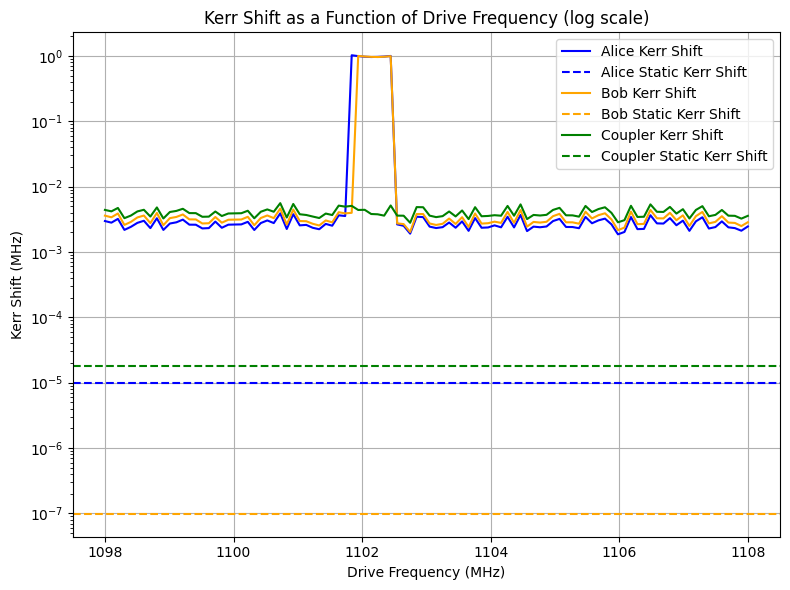

Analyzing amplitude 0.1388888888888889 at index 4


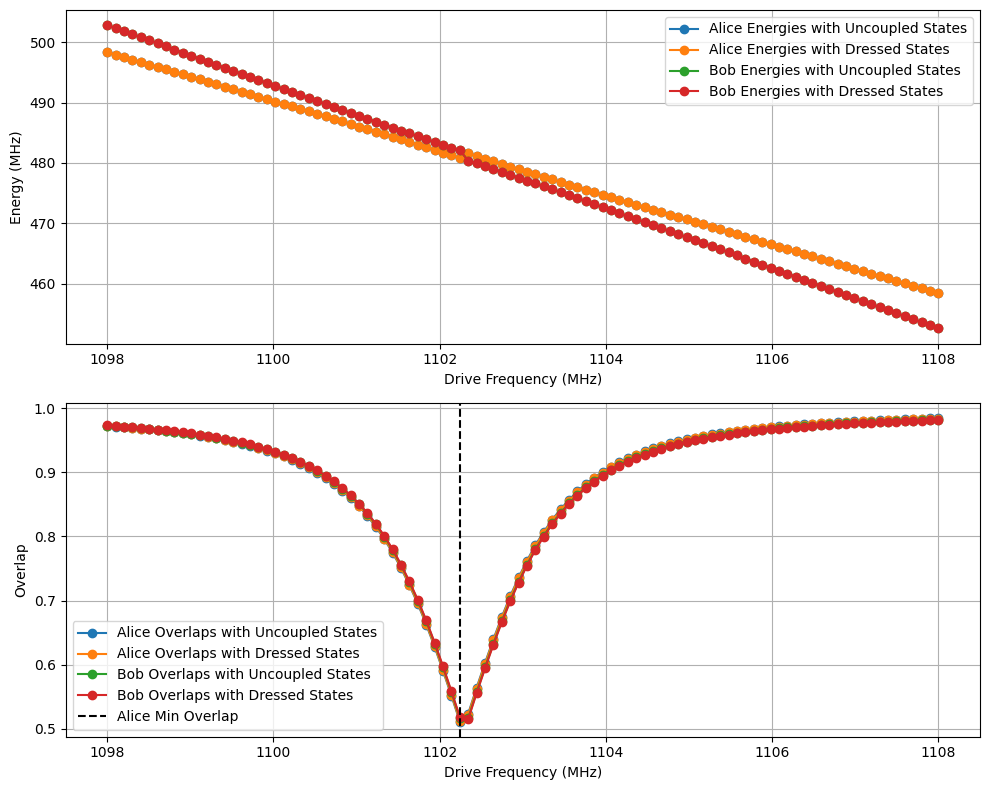

Minimum frequency: 1102.2424242424242 MHz, Minimum index: 42


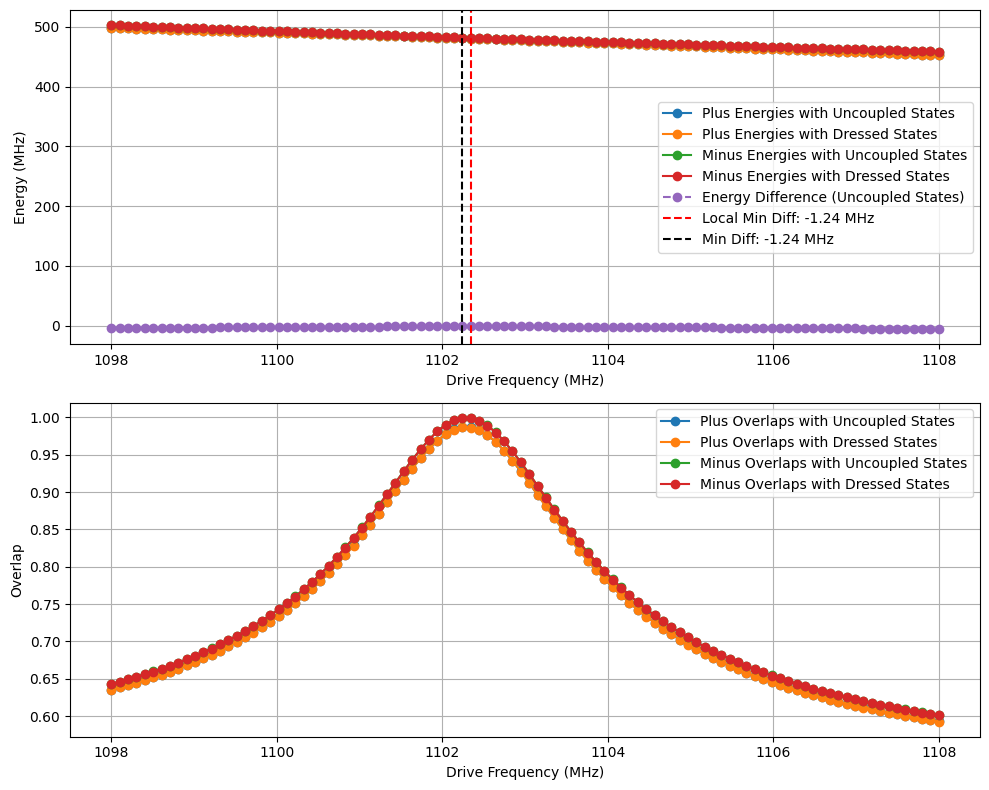

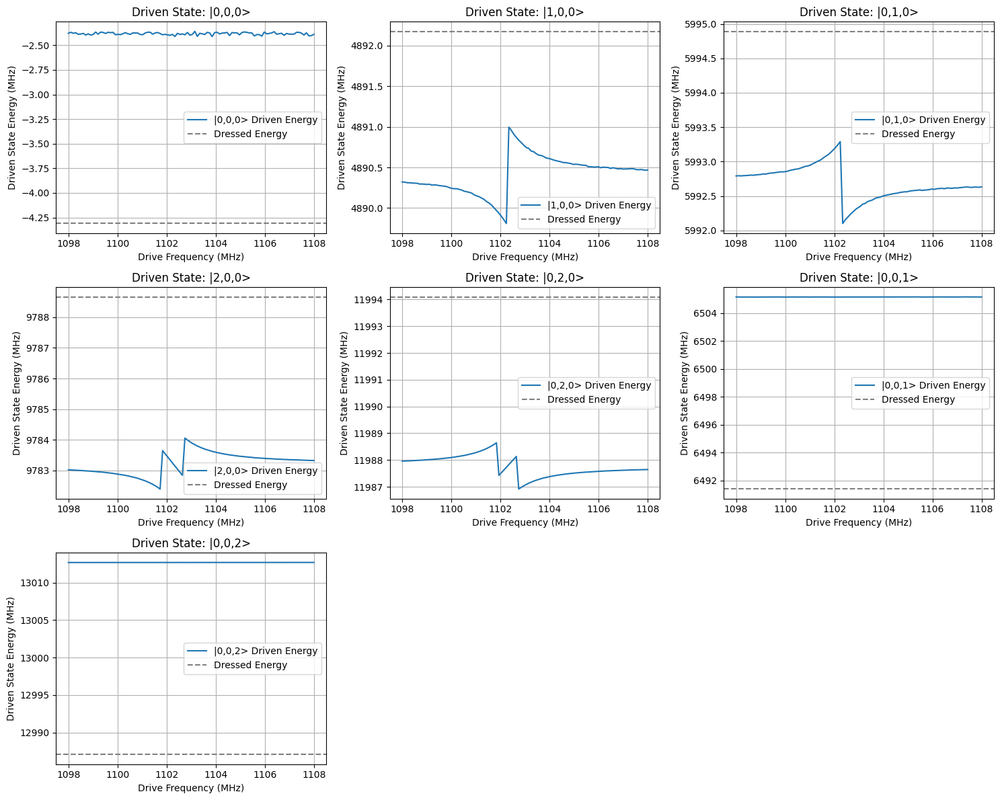

Saving plot to G:\Shared drives\SLab\Multimode\simulation\data\June2025_coupler_sims\2025-06-09\plots\dressed_state_frequency_shift_23.png


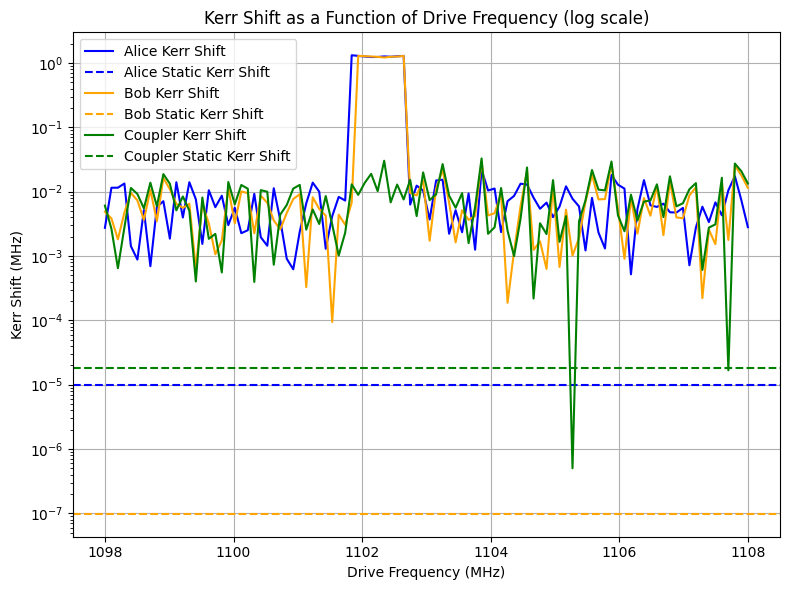

Analyzing amplitude 0.1711111111111111 at index 5


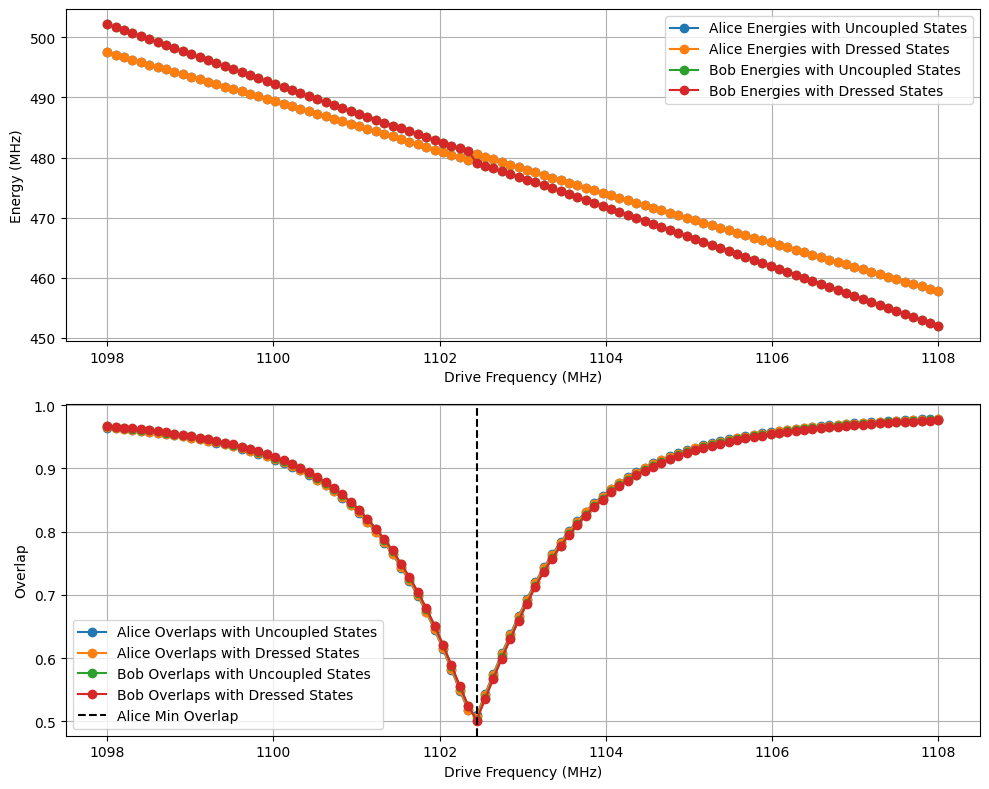

Minimum frequency: 1102.4444444444446 MHz, Minimum index: 44


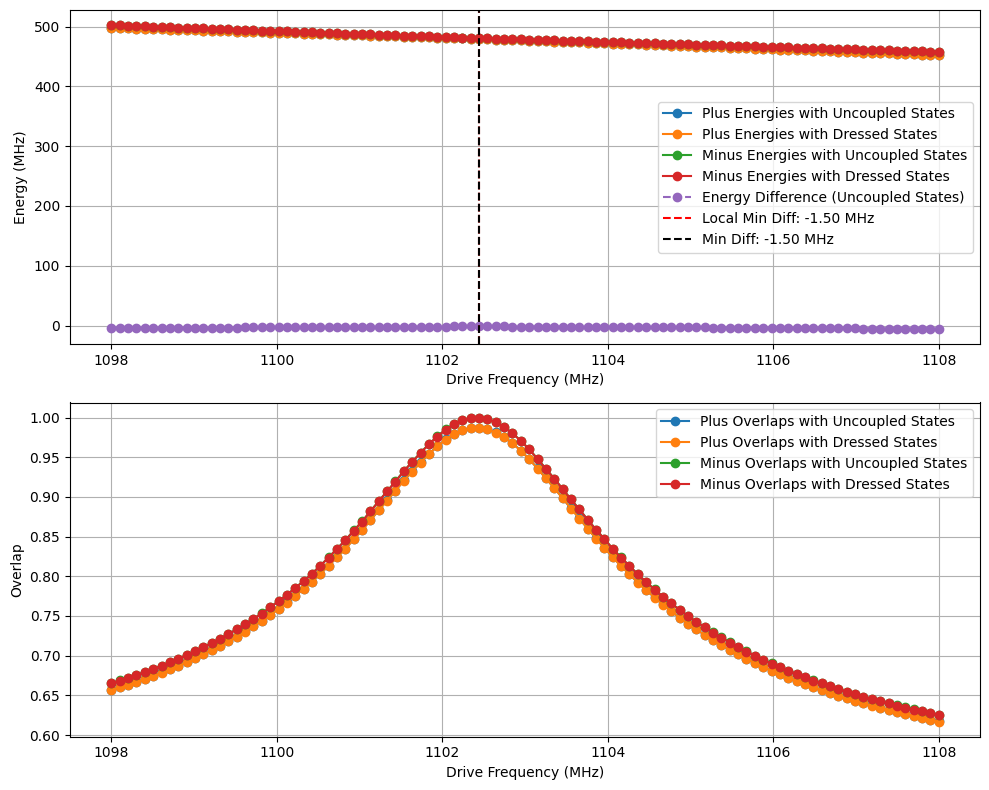

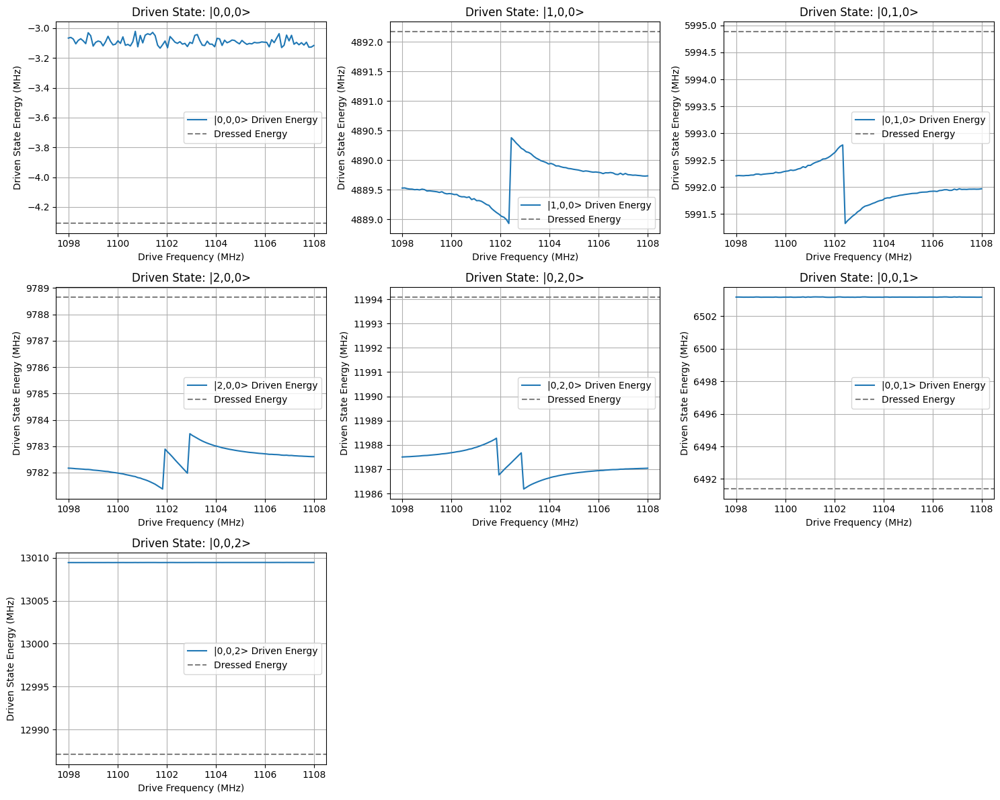

Saving plot to G:\Shared drives\SLab\Multimode\simulation\data\June2025_coupler_sims\2025-06-09\plots\dressed_state_frequency_shift_24.png


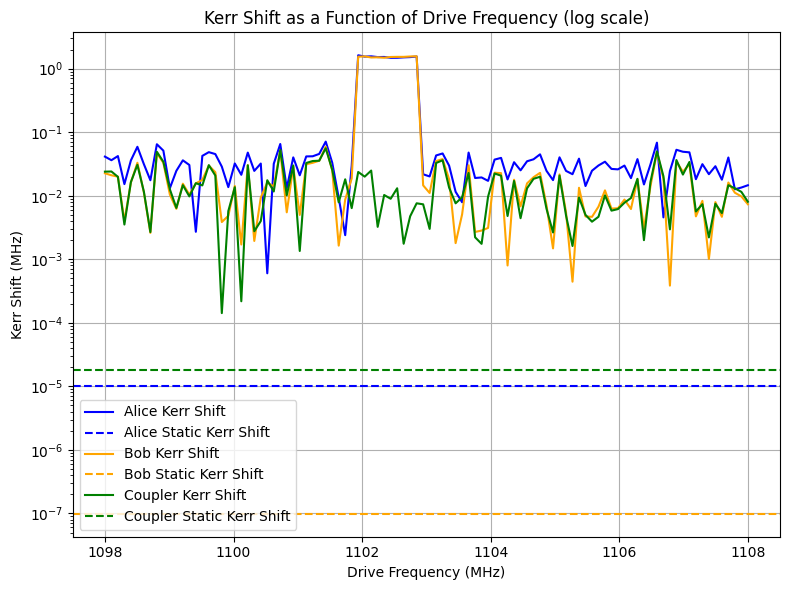

Analyzing amplitude 0.2033333333333333 at index 6


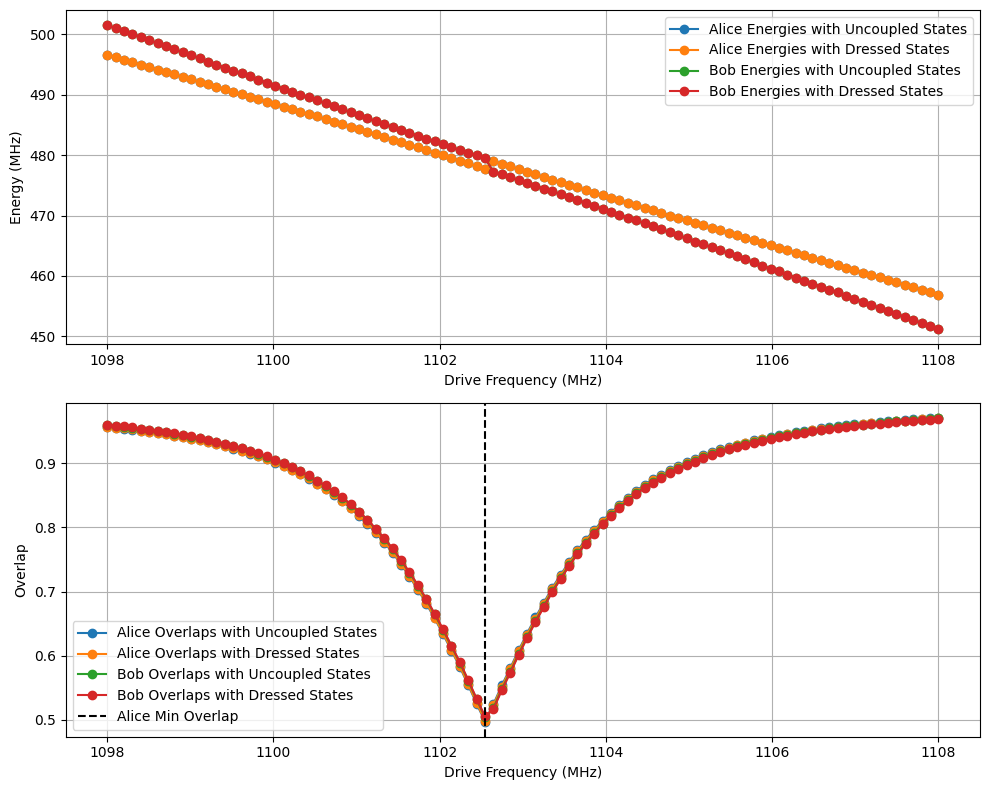

Minimum frequency: 1102.5454545454545 MHz, Minimum index: 45


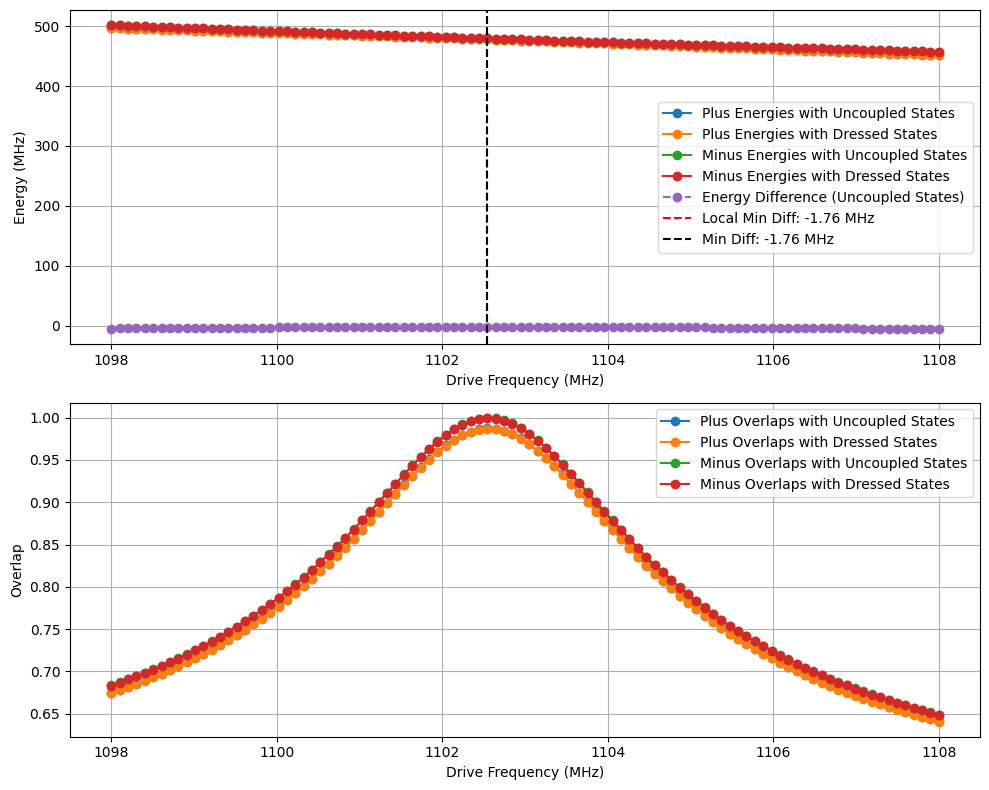

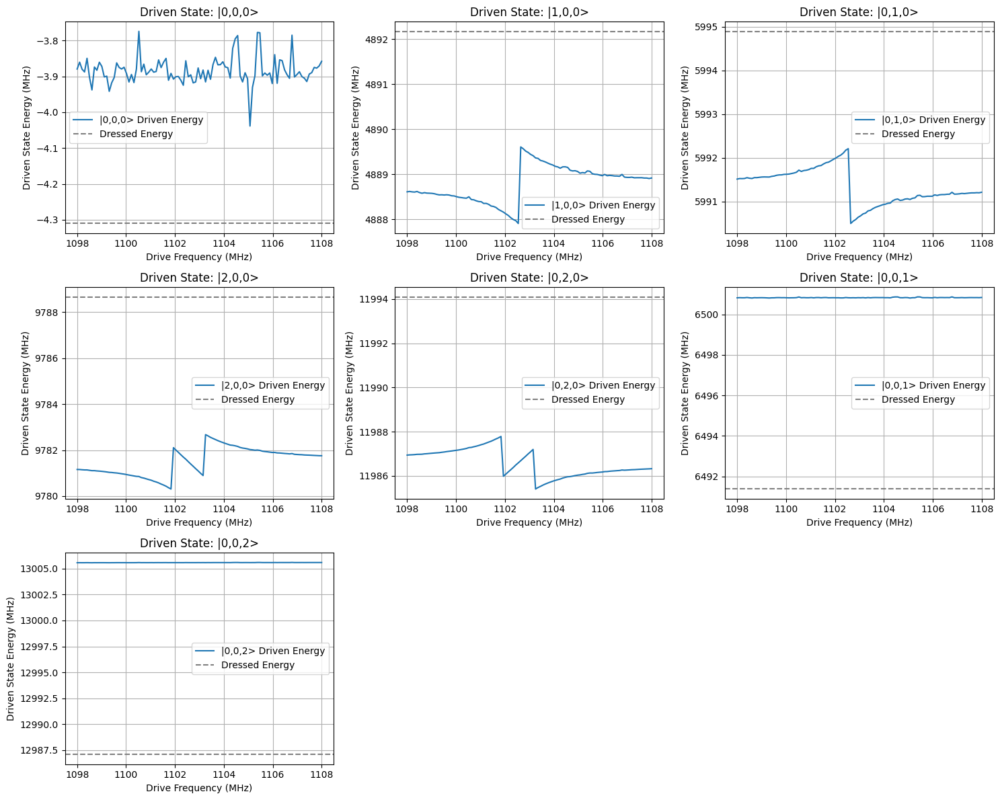

Saving plot to G:\Shared drives\SLab\Multimode\simulation\data\June2025_coupler_sims\2025-06-09\plots\dressed_state_frequency_shift_25.png


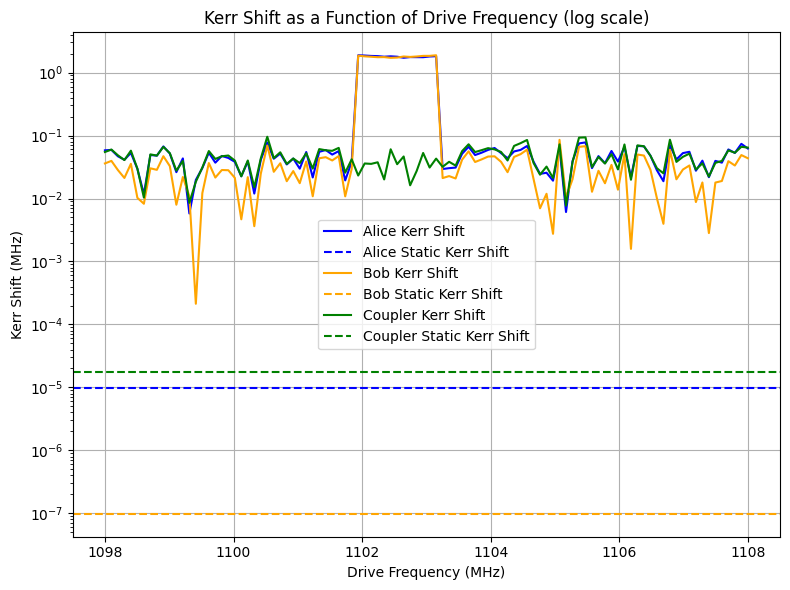

Analyzing amplitude 0.2355555555555555 at index 7


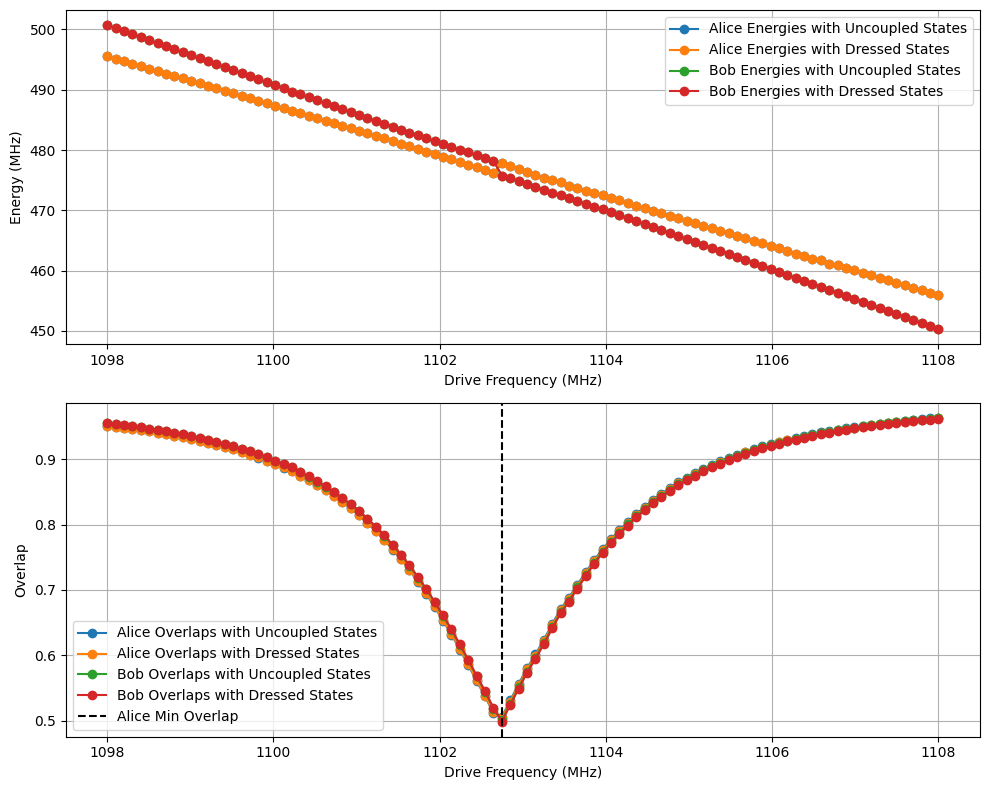

Minimum frequency: 1102.7474747474748 MHz, Minimum index: 47


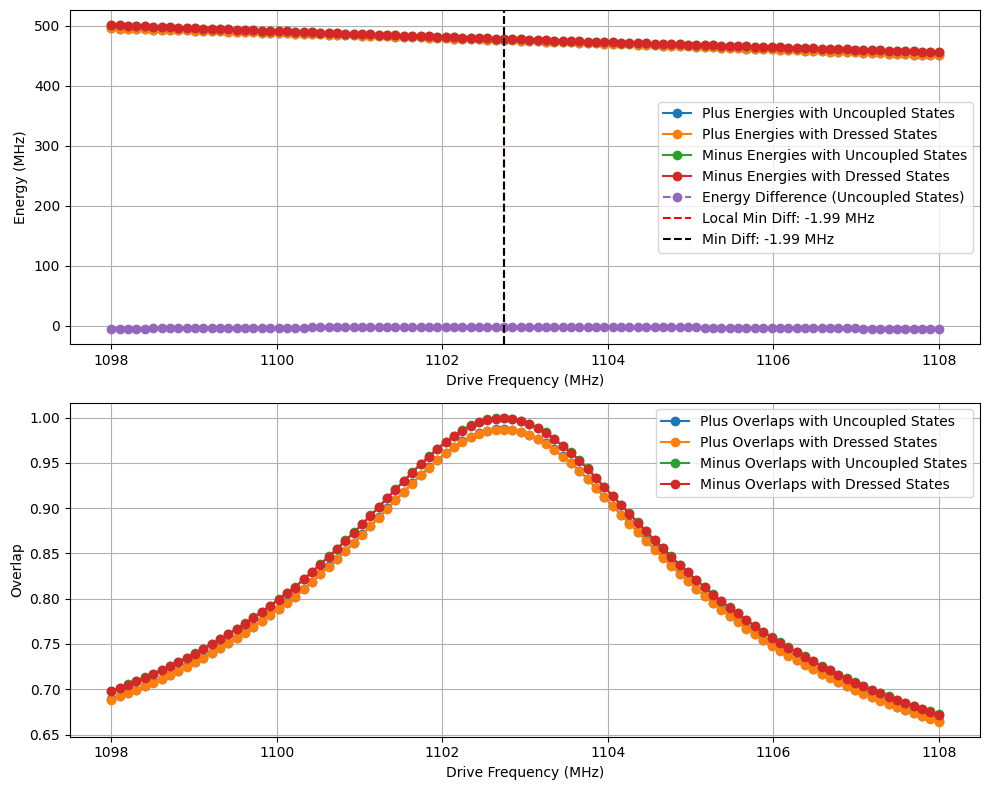

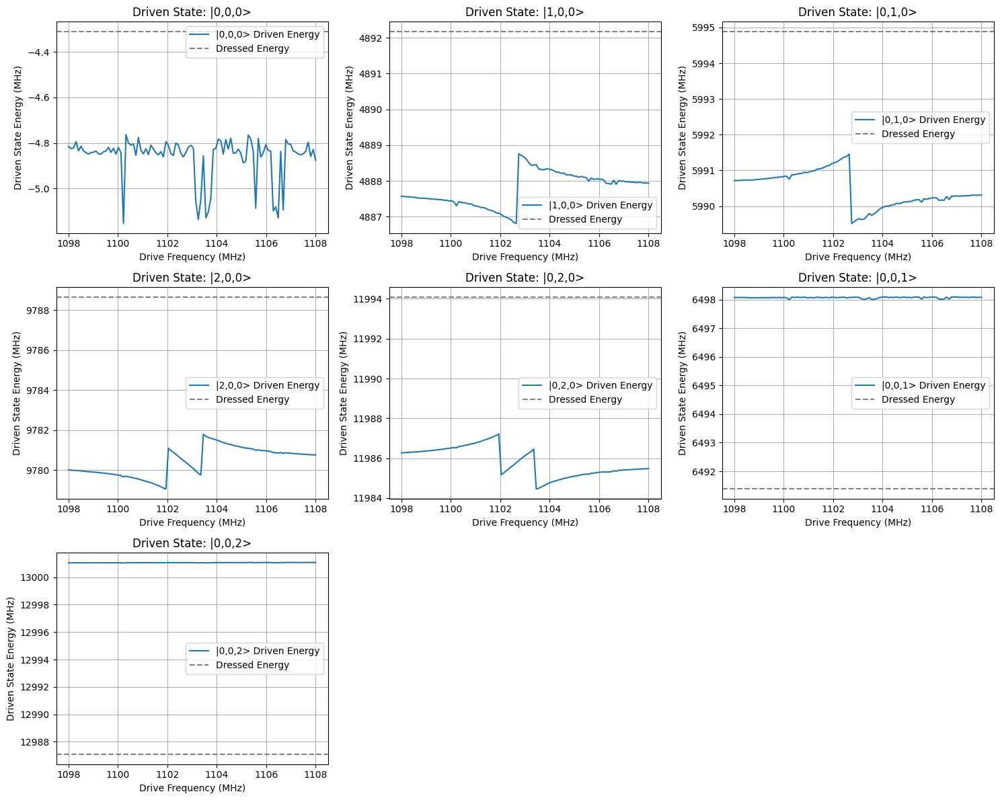

Saving plot to G:\Shared drives\SLab\Multimode\simulation\data\June2025_coupler_sims\2025-06-09\plots\dressed_state_frequency_shift_26.png


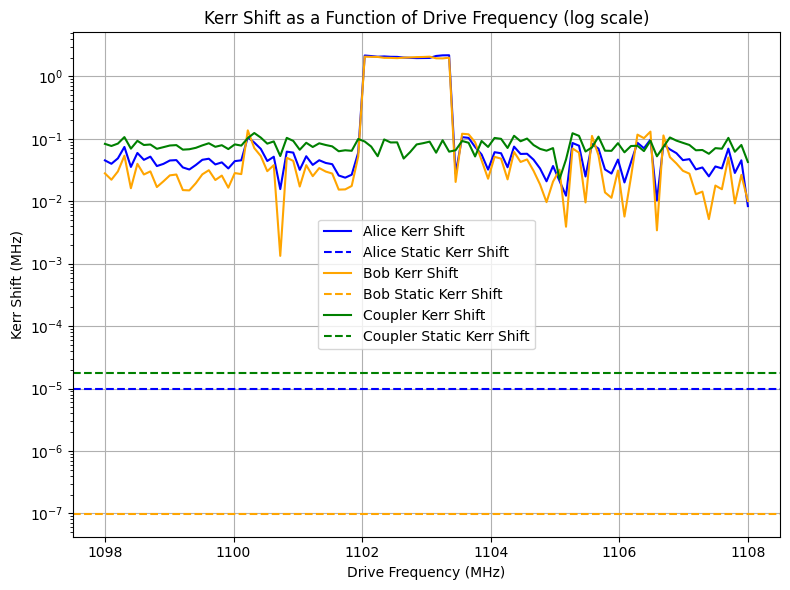

Analyzing amplitude 0.2677777777777778 at index 8


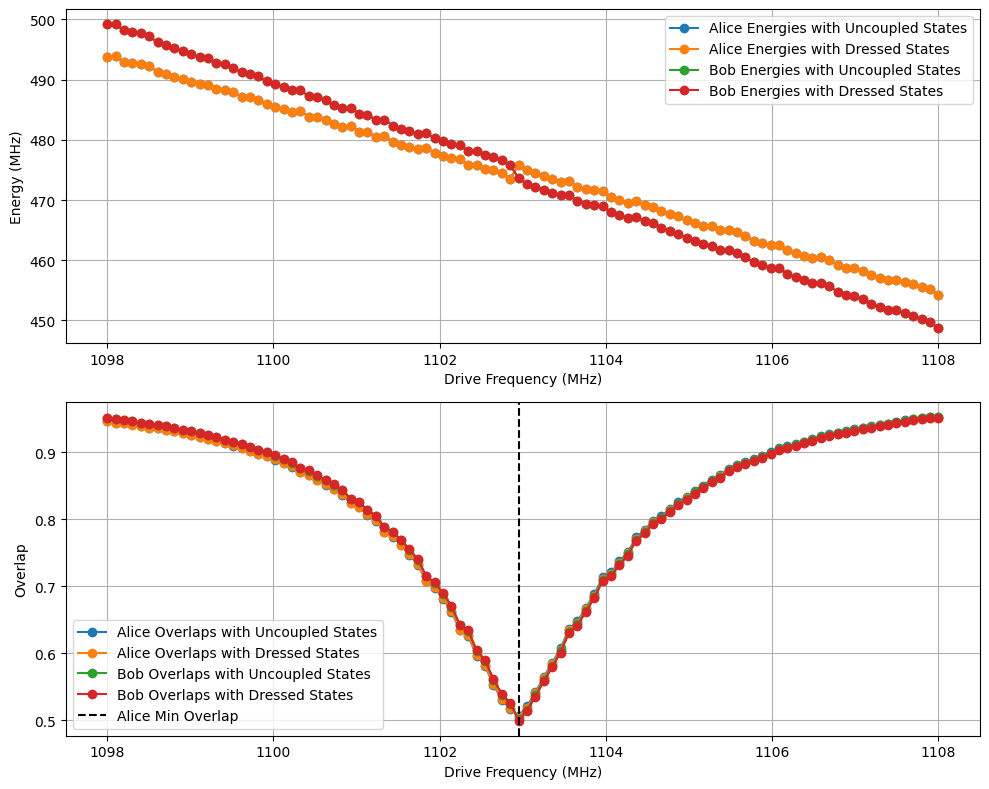

Minimum frequency: 1102.949494949495 MHz, Minimum index: 49


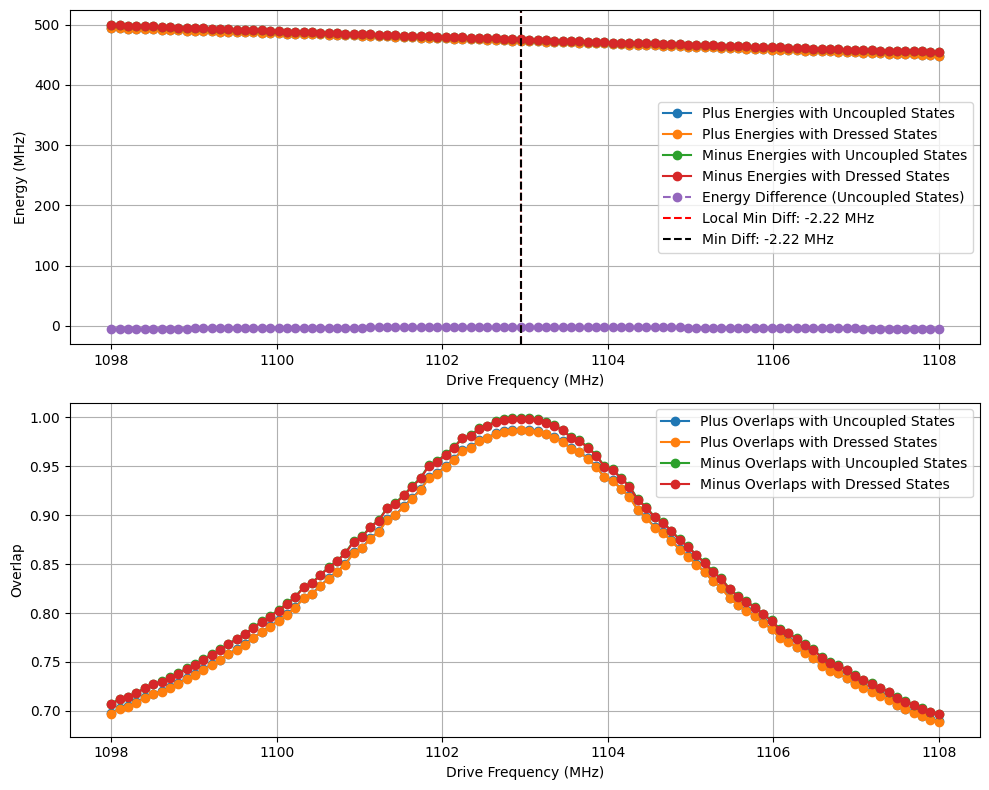

KeyboardInterrupt: 

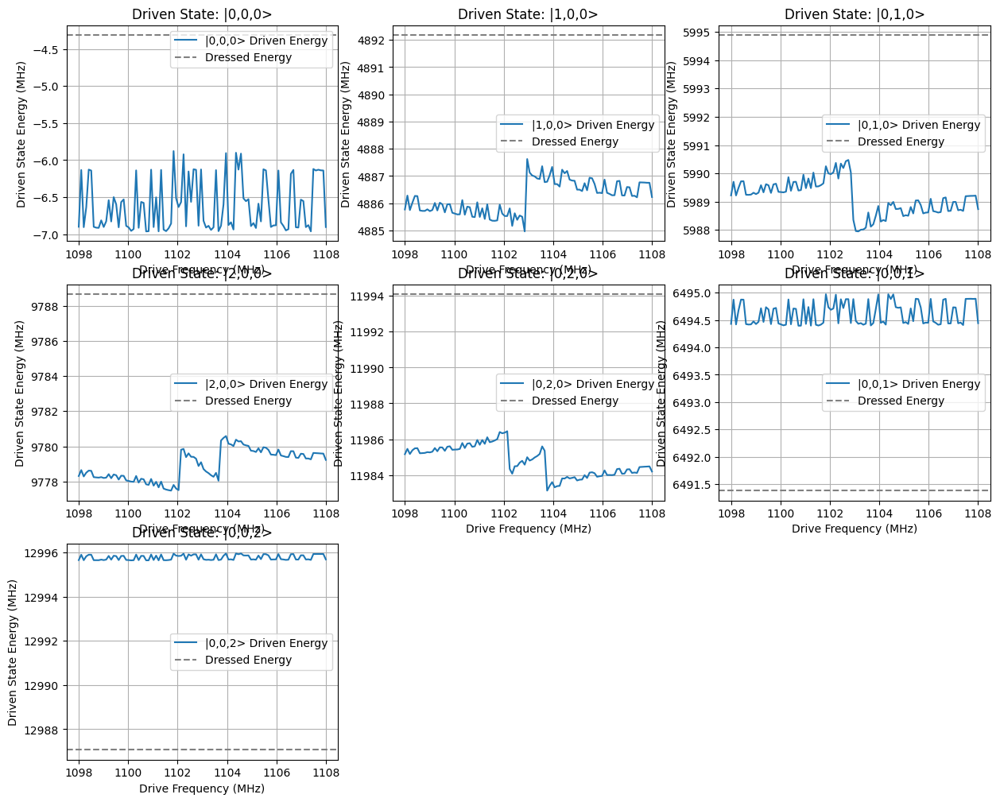

In [22]:
# open the csv 
save_dir = troyonium_dir
coupler_analysis = coupler_driving_analysis(sim_name='coupler_amp_sweep_analysis',
                                        save_dir=save_dir,
                                        plots_dir = gdrive_dir,
                                        coupler_ham=coup_ham)                                                       

floquet_class = FloquetHamiltonian(H = None, T=1, args=None, save_dir=save_dir)
results_dict = coupler_analysis.load_results_from_csv('sweep_amps_and_frequencies_20250606_200736.csv')
amplitudes = results_dict['amp_list']
alice_kerr = []

for idx, amp in enumerate(amplitudes):
    print(f"Analyzing amplitude {amp} at index {idx}")
    # Load the results for the current amplitude
    floquet_class.load_sweep_results(results_dict['uncoupled_fnames'][idx],  'frequencies')
    floquet_class.load_sweep_results(results_dict['coupled_fnames'][idx],  'frequencies')
    
    # Run the full g-kerr analysis
    results_uncoup = floquet_class.load_sweep_results(results_dict['uncoupled_fnames'][idx],  'frequencies')
    results_coup = floquet_class.load_sweep_results(results_dict['coupled_fnames'][idx],  'frequencies')
    args = coupler_analysis.run_full_g_kerr_analysis(
                    floquet_class, floquet_class, results_uncoup, results_coup, save_fig=False)
    alice_kerr.append(np.max(args['kerr_dict']['alice_kerr']))

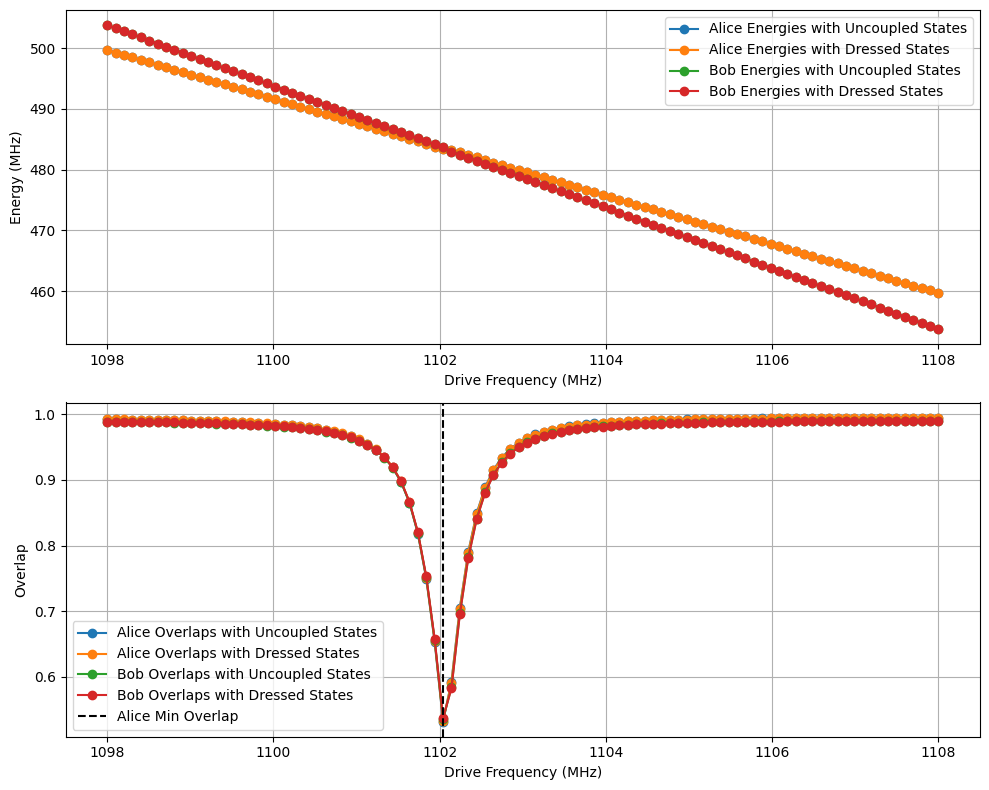

Minimum frequency: 1102.0404040404042 MHz, Minimum index: 40


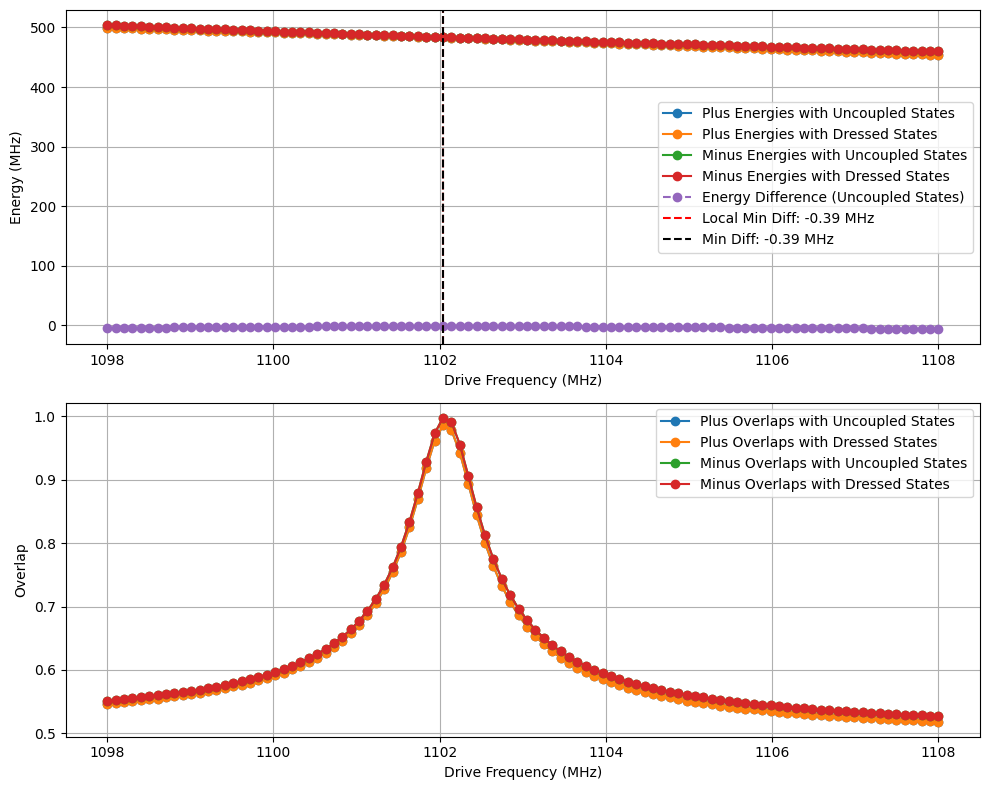

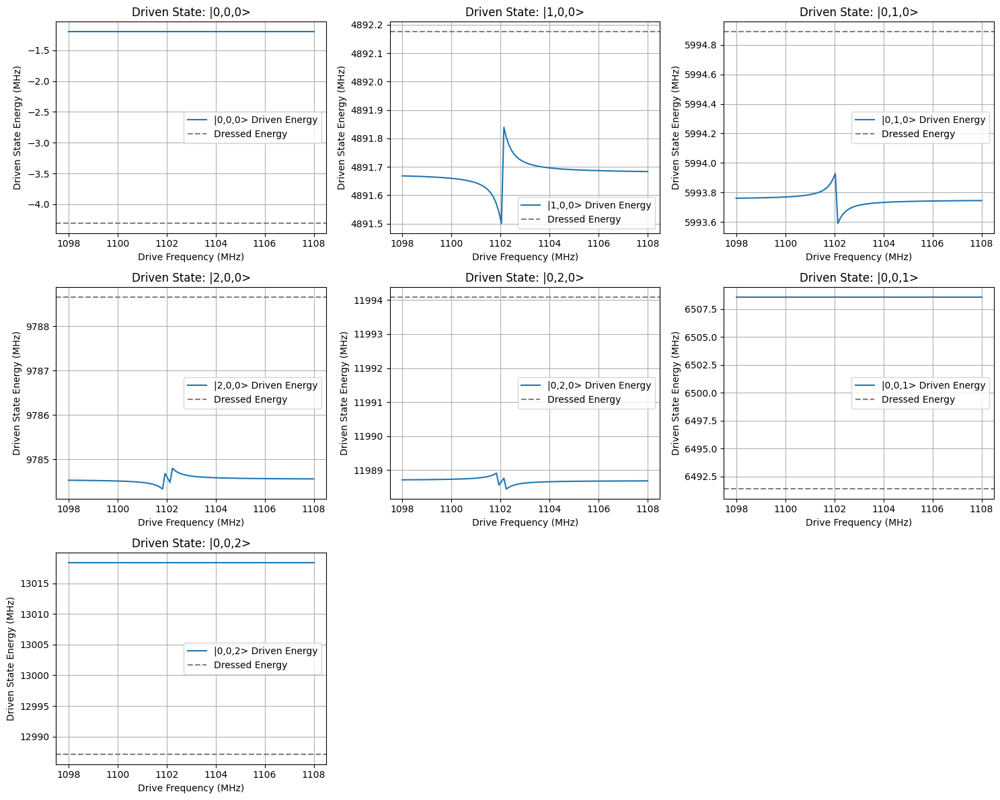

Saving plot to G:\Shared drives\SLab\Multimode\simulation\data\June2025_coupler_sims\2025-06-09\plots\dressed_state_frequency_shift_28.png


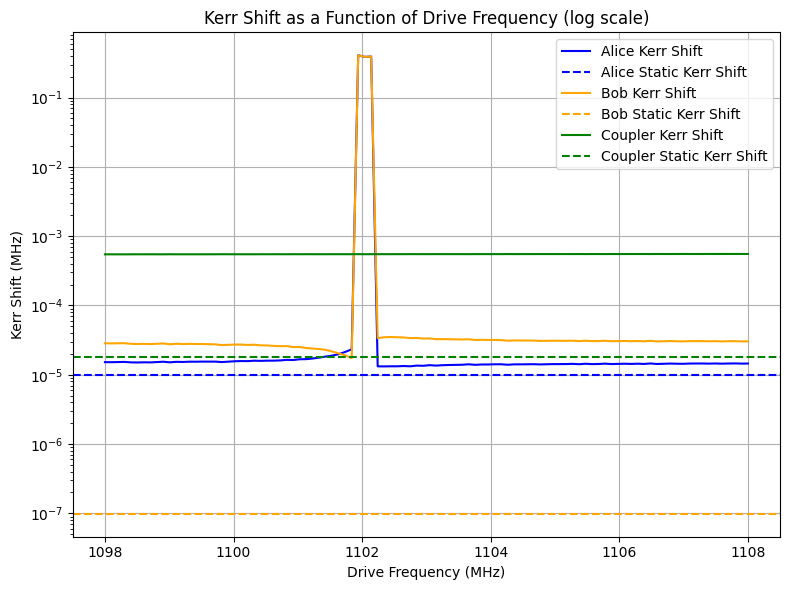

In [66]:
idx = 1
floquet_class.load_sweep_results(results_dict['uncoupled_fnames'][idx],  'frequencies')
floquet_class.load_sweep_results(results_dict['coupled_fnames'][idx],  'frequencies')

# Run the full g-kerr analysis
results_uncoup = floquet_class.load_sweep_results(results_dict['uncoupled_fnames'][idx],  'frequencies')
results_coup = floquet_class.load_sweep_results(results_dict['coupled_fnames'][idx],  'frequencies')
args = coupler_analysis.run_full_g_kerr_analysis(
                floquet_class, floquet_class, results_uncoup, results_coup, save_fig=False)
# alice_kerr.append(np.max(args['kerr_dict']['alice_kerr']))


In [24]:
args['freq_shifts'].keys()

dict_keys(['|0,0,0>', '|1,0,0>', '|0,1,0>', '|2,0,0>', '|0,2,0>', '|0,0,1>', '|0,0,2>'])

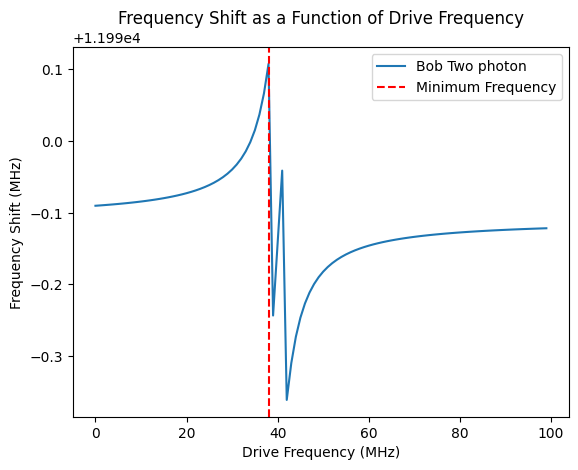

In [67]:
frequencies = results_coup['frequencies']
alice_single_photon_freq = args['freq_shifts']['|1,0,0>'] / 2 / np.pi
alice_two_photon_freq = args['freq_shifts']['|2,0,0>'] / 2 / np.pi
no_photon_freq = args['freq_shifts']['|0,0,0>'] / 2 / np.pi
bob_single_photon_freq = args['freq_shifts']['|0,1,0>'] / 2 / np.pi
bob_two_photon_freq = args['freq_shifts']['|0,2,0>'] / 2 / np.pi

# plt.plot(bob_single_photon_freq - no_photon_freq, label='Bob Single photon')
plt.plot(bob_two_photon_freq - no_photon_freq, label='Bob Two photon')

# plt.plot(alice_single_photon_freq - no_photon_freq, label='Alice Single photon')
# plt.plot(alice_two_photon_freq - no_photon_freq, label='Alice Two photon')
plt.axvline(x=38, color='r', linestyle='--', label='Minimum Frequency')
plt.xlabel('Drive Frequency (MHz)')
plt.ylabel('Frequency Shift (MHz)')
plt.title('Frequency Shift as a Function of Drive Frequency')
plt.legend()


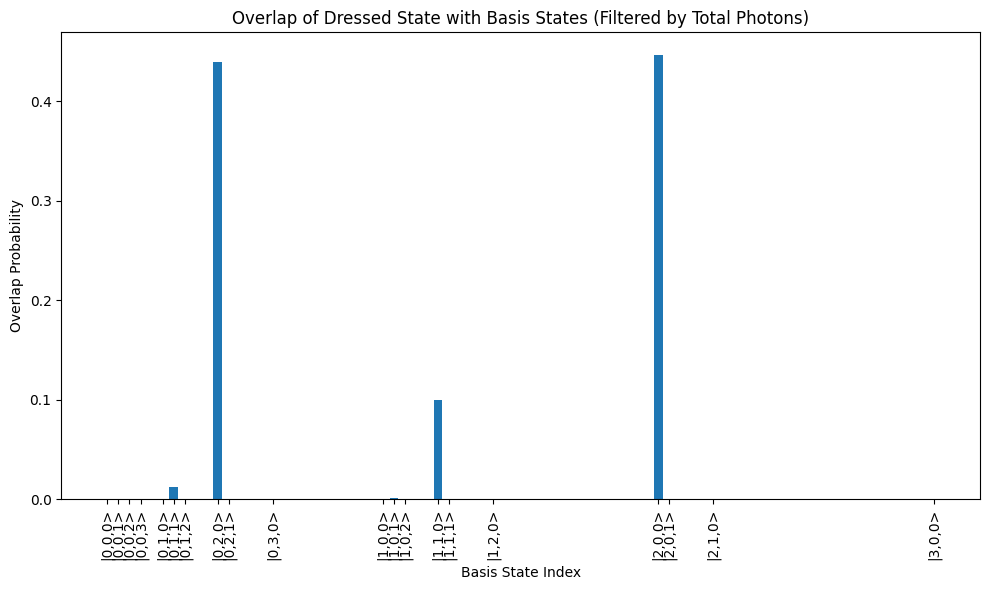

Energy of |0,2,0> in uncoupled modes: -82.8632453594451 MHz
Overlap index in uncoupled modes: 49


In [81]:
state_label = '|0,2,0>'
idx = 39
which_overlap_idx = 0
state = coup_ham.basis_states[coup_ham.ket_to_basis_index(state_label)]

# Find the state in the uncoupled modes
overlap_idxs_uncoup, overlaps_uncoup = floquet_class.find_max_overlap_indices(
state, results_coup['modes'][idx], return_overlaps=True
)
args__ = coup_ham.plot_basis_state_overlap(results_coup['modes'][idx][overlap_idxs_uncoup[which_overlap_idx]])
# args__ = coup_ham.plot_basis_state_overlap(results_coup['modes'][idx][50])
# print energy of state 
print(f"Energy of {state_label} in uncoupled modes: {results_uncoup['energies'][idx][overlap_idxs_uncoup[which_overlap_idx]] / 2 / np.pi} MHz")
# print overlap idx
print(f"Overlap index in uncoupled modes: {overlap_idxs_uncoup[which_overlap_idx]}")

In [ ]:
coup_ham.calculate_coupled_uncoupled_dressed_overlaps_and_energies

In [130]:
overlap_idxs_uncoup[0]

47

In [71]:
overlaps_uncoup

[0.4396076680978553,
 0.43073679037091167,
 0.11215744066204567,
 0.011452894129891103,
 0.00582668920963803,
 7.574669565189168e-05,
 5.0439248229228984e-05,
 2.4128634335650145e-05,
 2.1735645188152447e-05,
 1.382522363863956e-05,
 1.3175253471809297e-05,
 6.873225345411511e-06,
 4.862656117611176e-06,
 2.9001739253368366e-06,
 2.4059582203115167e-06,
 1.0820652938392406e-06,
 5.962820537022822e-07,
 3.64081851653947e-07,
 3.61860892709111e-07,
 7.55011219790059e-09,
 3.198696389828191e-09,
 3.122030466018584e-09,
 2.964721584384378e-09,
 1.9116032518268165e-09,
 1.836586158931746e-09,
 1.383246647168159e-09,
 7.497203247481624e-10,
 5.527829678093189e-10,
 5.009813694350977e-10,
 1.5433924686104947e-10,
 1.3147907993597173e-10,
 1.3085531327518593e-10,
 8.665366391182612e-11,
 5.169653493684231e-11,
 4.5467608754128074e-11,
 2.9273216597252495e-11,
 2.1215309534836468e-11,
 6.7296669028247674e-12,
 1.6994385151543998e-12,
 6.010051918803776e-13,
 4.742897925481676e-13,
 3.2285928401

In [114]:
results_uncoup['modes'][0][0]

Quantum object: dims=[[125], [1]], shape=(125, 1), type='ket', dtype=Dense
Qobj data =
[[-0.00000000e+00+0.00000000e+00j]
 [-0.00000000e+00+0.00000000e+00j]
 [-0.00000000e+00+0.00000000e+00j]
 [-0.00000000e+00+0.00000000e+00j]
 [-0.00000000e+00+0.00000000e+00j]
 [-0.00000000e+00+0.00000000e+00j]
 [-0.00000000e+00+0.00000000e+00j]
 [-0.00000000e+00+0.00000000e+00j]
 [-0.00000000e+00+0.00000000e+00j]
 [-0.00000000e+00+0.00000000e+00j]
 [-0.00000000e+00+0.00000000e+00j]
 [-0.00000000e+00+0.00000000e+00j]
 [-0.00000000e+00+0.00000000e+00j]
 [-0.00000000e+00+0.00000000e+00j]
 [-0.00000000e+00+0.00000000e+00j]
 [-0.00000000e+00+0.00000000e+00j]
 [-0.00000000e+00+0.00000000e+00j]
 [-0.00000000e+00+0.00000000e+00j]
 [-0.00000000e+00+0.00000000e+00j]
 [-0.00000000e+00+0.00000000e+00j]
 [-0.00000000e+00+0.00000000e+00j]
 [-0.00000000e+00+0.00000000e+00j]
 [-0.00000000e+00+0.00000000e+00j]
 [-0.00000000e+00+0.00000000e+00j]
 [-0.00000000e+00+0.00000000e+00j]
 [-0.00000000e+00+0.00000000e+00j]
 [-

In [ ]:
calculate_coupled_uncoupled_dressed_overlaps_and_energies

In [101]:
idx = 38
kerr = (alice_two_photon_freq - no_photon_freq) - 2*(alice_single_photon_freq - no_photon_freq)
kerr[idx]

2.3314618374570273e-05

In [78]:
dicty = coupler_analysis.calculate_coupled_uncoupled_dressed_overlaps_and_energies(
                floquet_class, floquet_class, results_uncoup, results_coup, '|0,2,0>'
            )
dicty.keys()

dict_keys(['overlaps_coup_with_uncoupled', 'energies_coup_with_uncoupled', 'idxs_coup_with_uncoupled', 'overlaps_coup_with_dressed', 'energies_coup_with_dressed', 'idxs_coup_with_dressed'])

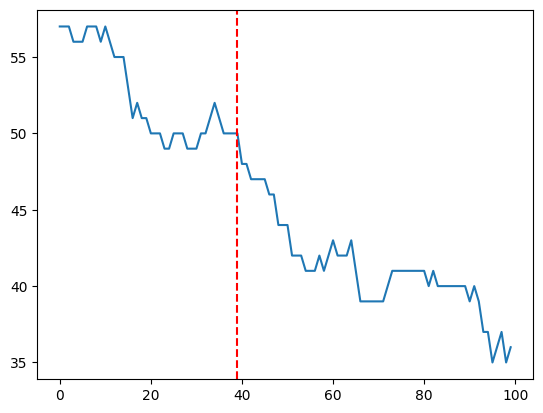

In [80]:
plt.plot(dicty['idxs_coup_with_dressed'])
plt.axvline(x=39, color='r', linestyle='--', label='Minimum Frequency')
# plt.plot(np.array(dicty['energies_coup_with_uncoupled'])/2/np.pi, label='Coupled Energies')

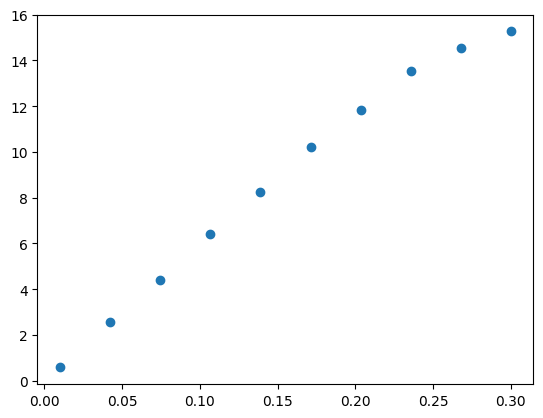

In [54]:
plt.plot(amplitudes, alice_kerr, 'o', label='Alice Kerr Shift')

In [49]:
np.max(np.abs(args['kerr_dict']['alice_kerr']))

16.806260038654727

In [34]:
results_dict['uncoupled_fnames'][idx]

'sweep_ac_drive_frequency_20250606_113523.csv'

In [51]:
results_dict.keys()

dict_keys(['amp_list', 'uncoupled_fnames', 'coupled_fnames', 'delta_bs', 'g_bs'])

In [32]:
np.shape(results_dict['uncoupled_fnames'])

(10,)

# Debug

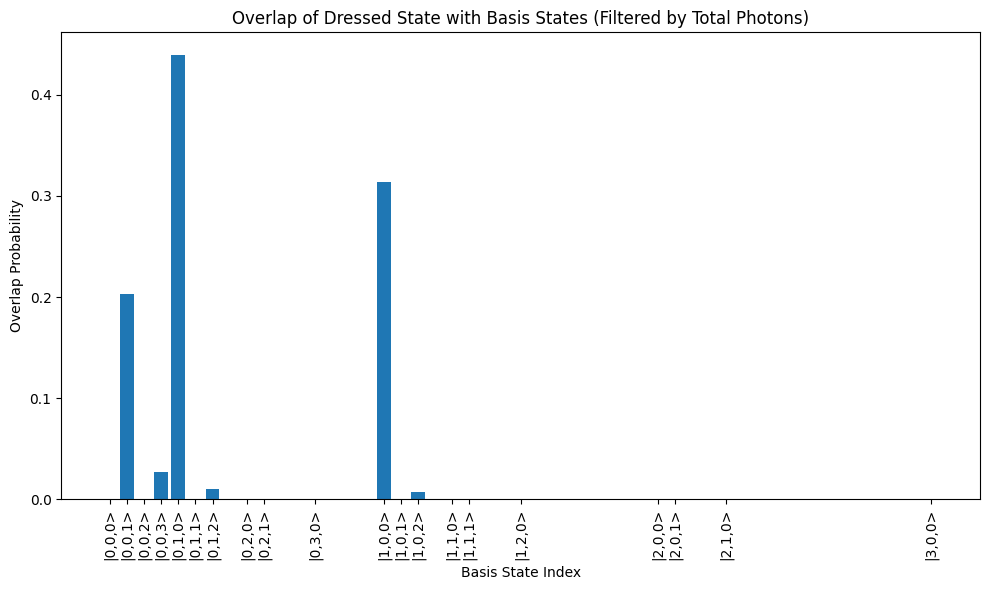

Overlap with uncoupled state: 0.4497847012563616


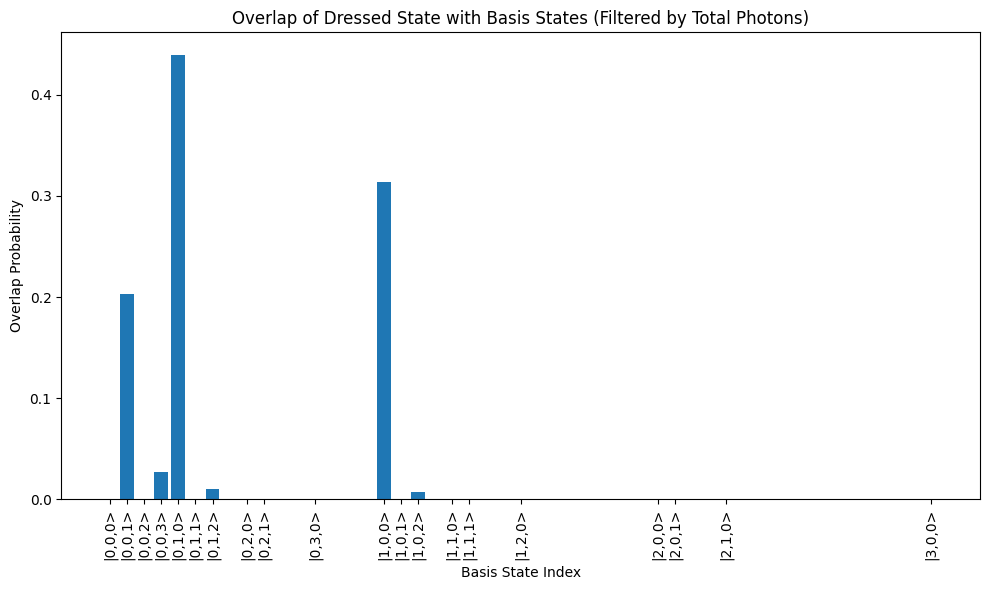

Overlap with dressed state: 0.5088686853073212


In [26]:
idx = 33
alice_state = coup_ham.basis_states[coup_ham.ket_to_basis_index('|0,1,0>')]
# find the alice state in the uncoupled modes
alice_overlap_idxs, alice_overlaps = floquet_class_uncoup.find_max_overlap_indices(alice_state, return_args_uncoup['modes'][idx], return_overlaps=True)
alice_driven_uncoupled_state = return_args_uncoup['modes'][idx][alice_overlap_idxs[0]]

# find the states in driven coupled modes which is closest to the uncoupled state
alice_overlap_idxs, alice_overlaps = floquet_class_coup.find_max_overlap_indices(alice_driven_uncoupled_state, return_args_coup['modes'][idx], return_overlaps=True)
# alice_overlaps_coup_with_uncoupled.append(alice_overlaps[0])
# plot the coupled alice mode
coup_ham.plot_dressed_state_overlap(return_args_coup['modes'][idx][alice_overlap_idxs[0]])
print(f"Overlap with uncoupled state: {alice_overlaps[0]}")

# find the state in driven coupled modes which is closest to the dressed state
alice_overlap_dressed_idxs, alice_overlaps_dressed = floquet_class_coup.find_max_overlap_indices(coup_ham.dressed_states[coup_ham.basis_to_dressed_mapping_dict[coup_ham.ket_to_basis_index('|0,1,0>')]], return_args_coup['modes'][idx], return_overlaps=True)
# alice_overlaps_coup_with_dressed.append(alice_overlaps_dressed[0])
# plot the coupled alice mode
coup_ham.plot_dressed_state_overlap(return_args_coup['modes'][idx][alice_overlap_dressed_idxs[0]])
print(f"Overlap with dressed state: {alice_overlaps_dressed[0]}")


### Back to main

In [ ]:
# now get floquet modes 
omegad = 2 * np.pi * 500 # Floquet drive frequency
amp = 0.2
H0 = coup_ham.H0
operator, time_func = coup_ham.linc_potential_operator()
args = {'amp': amp, 'omega': omegad}
H_fq = [H0, [operator, time_func]]

# return_dict = coup_ham.sweep_ac_drive_frequency(H_fq, amp, freq_range=(2 * np.pi * 375, 2 * np.pi * 425), num_points=10)


In [553]:
omegad = 2 * np.pi * 500 
args = {'amp': 0.02, 'omega': omegad}
floquet_class= FloquetHamiltonian(H = H_fq, T=2*np.pi/omegad, args=args)
ens, modes = floquet_class.compute_floquet_modes()


/opt/anaconda3/envs/quantum/lib/python3.12/site-packages/qutip/solver/options.py:16: FutureWarning: Dedicated options class are no longer needed, options should be passed as dict to solvers.
  warnings.warn(


In [560]:

floquet_class_= FloquetHamiltonian(H = H_fq, T=2*np.pi/omega_drive, args=args)
min_freq = 480 * 2 * np.pi
max_amp = 520 * 2 * np.pi
amp = 0.2
return_args = floquet_class.sweep_ac_drive_frequency(amp, freq_range = (min_freq, max_amp), num_points=20)

Computing Floquet modes: 100%|██████████| 20/20 [00:27<00:00,  1.40s/it]


In [561]:
freqs = return_args['frequencies']
energies = return_args['energies']
modes = return_args['modes']

# plot alice state 
alice_state = '|1,0,0>'
alice_dressed_state = coup_ham.dressed_states[coup_ham.basis_to_dressed_mapping_dict[coup_ham.ket_to_basis_index(alice_state)]]

# do same for bob state
bob_state = '|0,1,0>'
bob_dressed_state = coup_ham.dressed_states[coup_ham.basis_to_dressed_mapping_dict[coup_ham.ket_to_basis_index(bob_state)]]

Max overlap at index 1: 0.8366474498666698 for swept parameter 482.10526315789474
Min overlap at index 9: 0.3562146376447429 for swept parameter 498.9473684210526
Max overlap at index 1: 0.8585038761529307 for swept parameter 482.10526315789474
Min overlap at index 19: 0.2543449857559821 for swept parameter 520.0


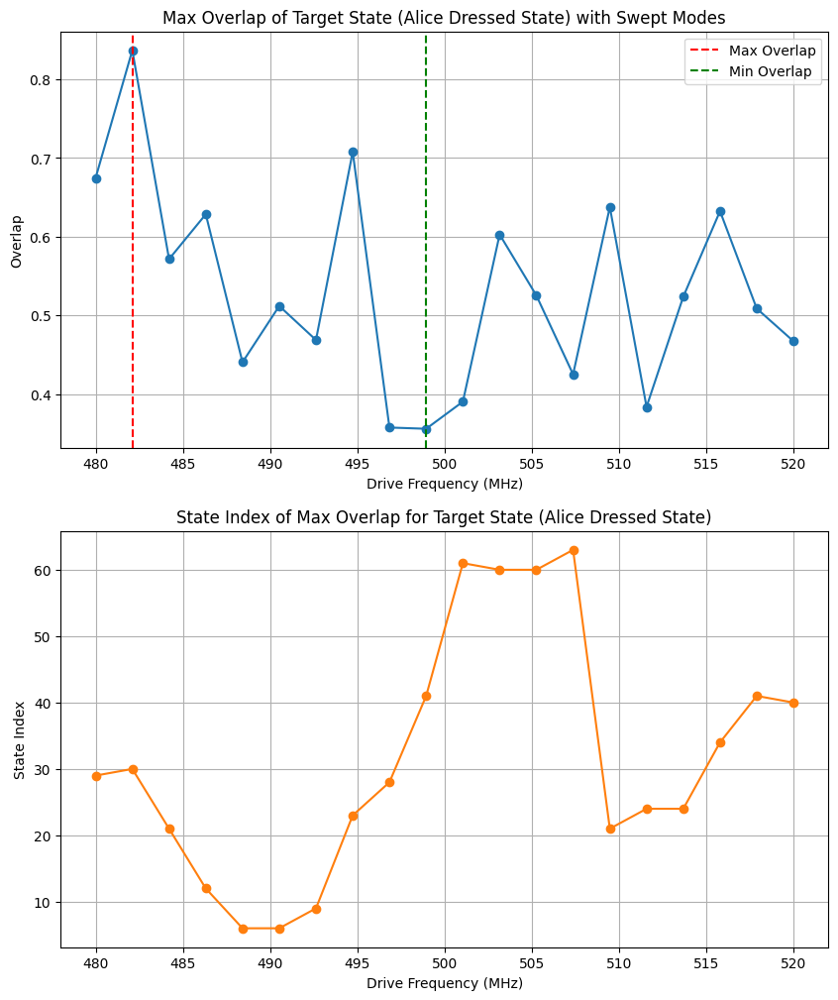

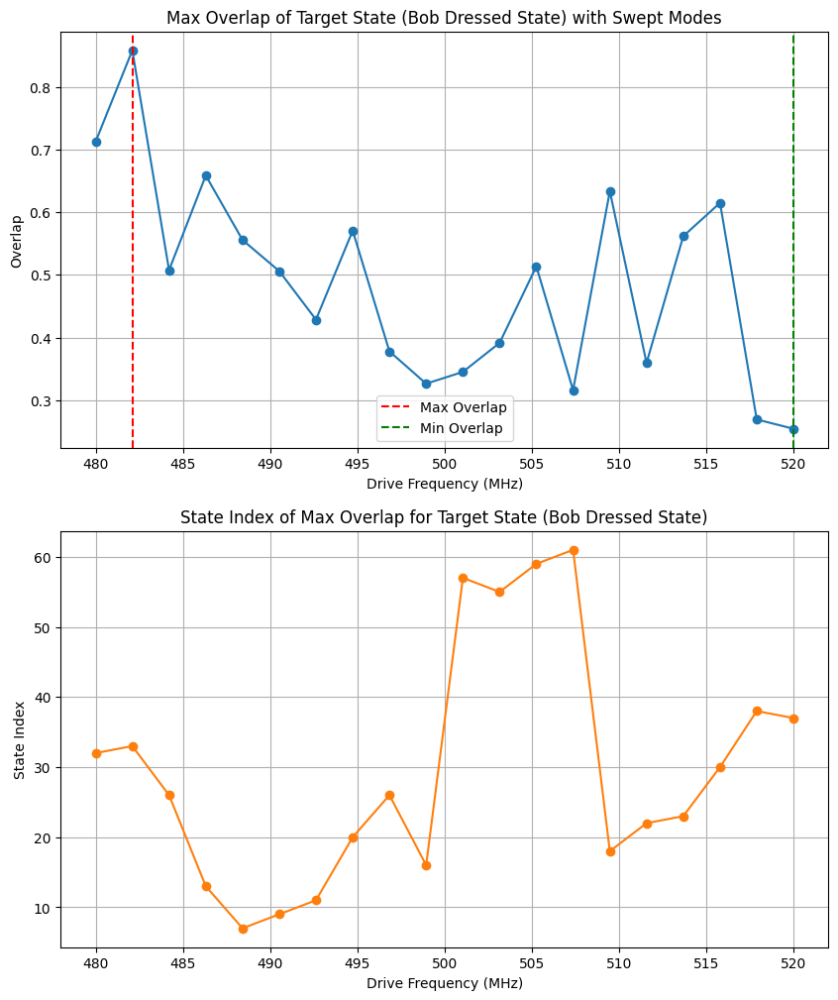

In [566]:
plus_state = (alice_dressed_state + bob_dressed_state) / np.sqrt(2)
minus_state = (alice_dressed_state - bob_dressed_state) / np.sqrt(2)

return_args_plotting = floquet_class.plot_overlaps_states(swept_list=freqs/2/np.pi,
                                                           target_states=[alice_dressed_state, bob_dressed_state],#,
                                                                          # plus_state, minus_state],
                                                           target_state_labels=['Alice Dressed State', 'Bob Dressed State', 'Plus', 'Minus'],
                                                           modes_swept_list= modes,
                                                              xlabel='Drive Frequency (MHz)', ylabel='Overlap',
                                                                find_min=True, find_max = True)

In [515]:
return_args_plotting[0].keys()

dict_keys(['swept_list', 'overlap_values', 'overlap_idxs', 'max_overlap_idx', 'min_overlap_idx'])

Alice index for frequency 482.11 MHz: 1
Overlaps with dressed states: [1.2367990894259497e-33, 0.03559833225331254, 0.8366474498666698, 0.07831050425519802, 1.1378438567741942e-31, 2.2644966553004566e-31, 3.1445740429966706e-34, 6.828294626364917e-32, 1.0847119765146658e-31, 6.254829688095965e-33, 0.010228344470383535, 0.008432689986251707, 0.000357272803495475, 0.010045946095591767, 0.0001980365081840799, 0.00012236240021514563, 0.00014553073783697267, 7.987654545928664e-05, 3.945584094137908e-05, 8.8530042409728e-06, 3.274657575579253e-32, 6.421957182697796e-32, 1.675874402565274e-33, 4.27576911386054e-33, 2.1517912440040767e-33, 1.4296542596837453e-32, 3.6503664135224606e-33, 1.5893814774432813e-31, 1.2534759957155704e-31, 6.181709052690708e-32, 6.426194120277838e-32, 3.2080567326646815e-30, 0.014930588239101275, 0.0032149465696176683, 0.00013224441510392286, 1.1771275457786765e-06, 0.0007281221981366926, 0.00019126148546906975, 4.181947030462669e-08, 0.00016992260488250444, 2.07916

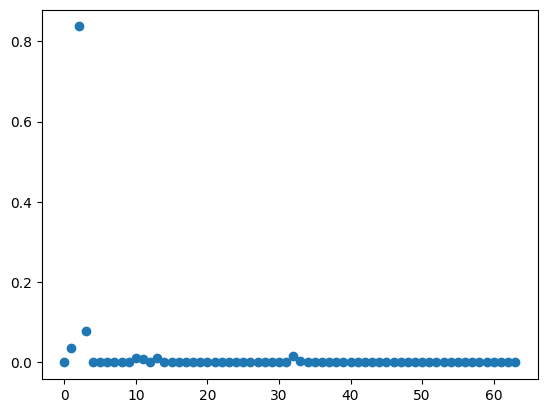

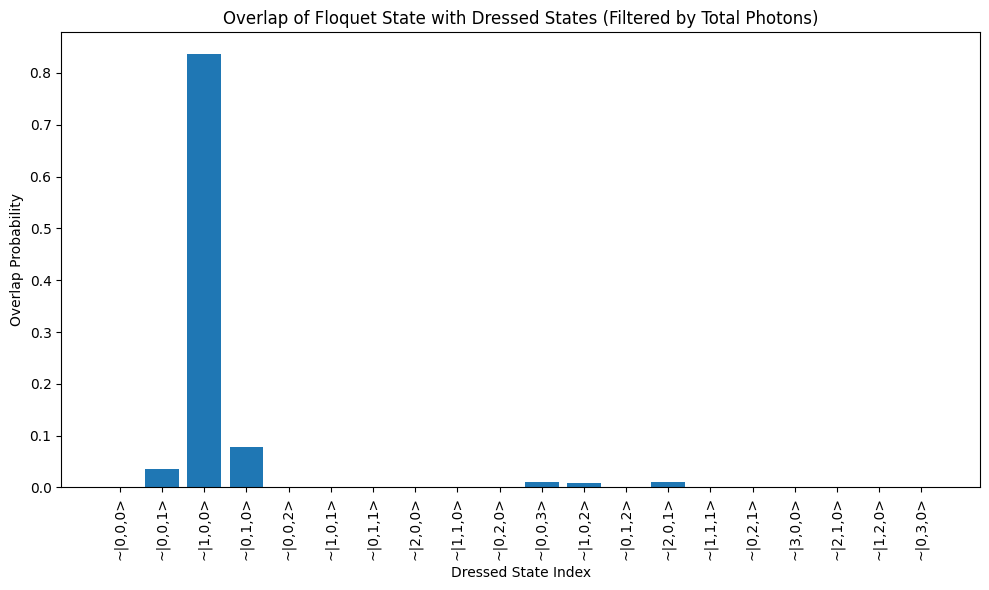

In [564]:
alice_idx_for_freq = return_args_plotting[0]['max_overlap_idx'] # where dip happends
print(f"Alice index for frequency {freqs[alice_idx_for_freq]/2/np.pi:.2f} MHz: {alice_idx_for_freq}")
alice_floquet_mode_state = modes[alice_idx_for_freq][return_args_plotting[0]['overlap_idxs'][alice_idx_for_freq]]
coup_ham.plot_floquet_state_overlap(alice_floquet_mode_state)

In [524]:
alice_floquet_mode_state

Quantum object: dims=[[4, 4], [1]], shape=(16, 1), type='ket', dtype=Dense
Qobj data =
[[-2.17530617e-22-1.73422170e-23j]
 [ 1.00000000e+00+0.00000000e+00j]
 [ 5.08551338e-20-4.97818007e-20j]
 [-1.08576109e-13+4.65852409e-15j]
 [-2.02120921e-10-2.12349316e-05j]
 [ 1.44231820e-16-9.69226220e-16j]
 [-1.82909324e-12-1.86476348e-07j]
 [ 3.92551678e-16+2.02140522e-16j]
 [ 4.80238362e-20-6.61143633e-20j]
 [-4.05578537e-12+6.76831883e-17j]
 [-1.75779976e-19+8.82862955e-20j]
 [-3.01145916e-14+7.76798263e-19j]
 [-5.07136463e-23+3.52980030e-18j]
 [-1.21120145e-15-2.09583998e-15j]
 [ 2.20348809e-23+6.70479150e-19j]
 [ 2.89180321e-15+3.93818770e-16j]]

Alice overlap indices: [61, 5, 62, 57, 19, 3, 8, 1, 6, 22, 24, 26, 16, 40, 23, 13, 42, 37, 59, 39, 11, 50, 14, 43, 55, 28, 53, 46, 29, 35, 32, 48, 25, 52, 54, 0, 51, 56, 7, 36, 60, 10, 41, 34, 21, 2, 45, 4, 38, 63, 9, 30, 12, 58, 47, 15, 44, 33, 18, 20, 31, 17, 49, 27]
Overlaps with dressed states: [1.167883392334791e-31, 0.009774296759339803, 0.39065205173695716, 0.1676406483101312, 4.750563349837526e-31, 4.5330729441729e-31, 6.518269567881709e-31, 7.219617115175569e-32, 6.794460567300177e-31, 5.795397328122405e-31, 0.0003893291030427148, 0.16958443263412595, 0.11498533980733315, 0.047363122582847125, 0.00029101894645299815, 0.006176593877208814, 0.07232770322462684, 0.001830951034305626, 1.9374218550923887e-05, 0.0012448970194136584, 7.225420871359461e-33, 2.8475866435851556e-31, 3.7265006471714735e-31, 7.5577406676759025e-31, 6.555707817348871e-32, 7.229200204069992e-32, 4.04365618631254e-33, 1.7796054432715363e-31, 1.1600983077675512e-31, 3.449518735202792e-31, 1.518306152329696e-3

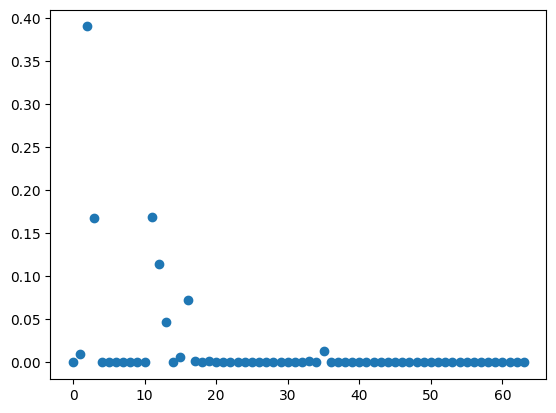

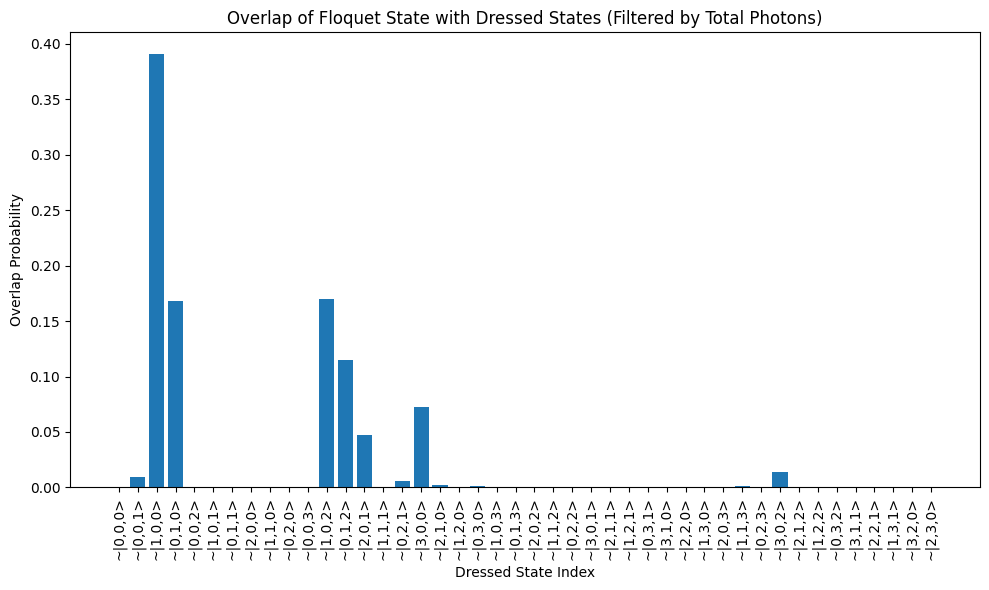

In [598]:
plus_state = (alice_dressed_state + bob_dressed_state) / np.sqrt(2)
minus_state = (alice_dressed_state - bob_dressed_state) / np.sqrt(2)

freq_idx = 10
alice_overlap_indices, alice_overlap = floquet_class_.find_max_overlap_indices(plus_state, modes[freq_idx], return_overlaps=True)
print(f"Alice overlap indices: {alice_overlap_indices}")
alice_floquet_state = modes[freq_idx][alice_overlap_indices[0]]
# alice_floquet_state = modes[freq_idx][28]
coup_ham.plot_floquet_state_overlap(alice_floquet_state, max_total_photons=5)

In [596]:
freq_index

166

In [597]:
alice_overlap_indices[0]

61

In [541]:
len(modes[0])

16

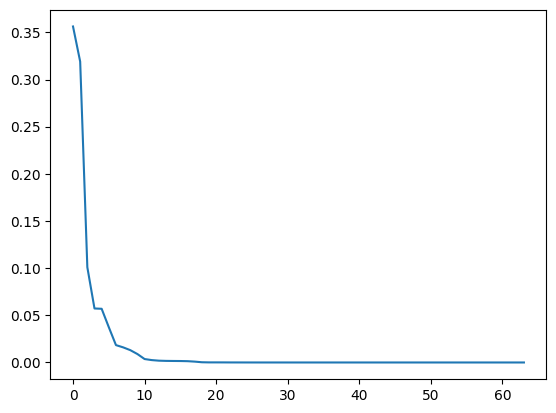

In [575]:
plt.plot(alice_overlap)

In [535]:
modes[50]

[Quantum object: dims=[[4, 4], [1]], shape=(16, 1), type='ket', dtype=Dense
 Qobj data =
 [[-5.10070342e-24+2.29822857e-21j]
  [ 5.06287232e-17+1.78942094e-16j]
  [-1.12471045e-16+5.86178466e-16j]
  [ 1.56103632e-20-2.17780175e-18j]
  [ 7.78110509e-19-9.75010582e-20j]
  [-5.22262201e-14-6.93980485e-17j]
  [-2.51570091e-16-1.13519397e-16j]
  [-5.02371246e-13+1.96075633e-14j]
  [ 2.15436264e-16+2.61151327e-16j]
  [-8.69483156e-23+7.42183446e-22j]
  [ 2.59963691e-10-3.95745705e-07j]
  [ 6.37350641e-23-2.06274678e-22j]
  [ 1.56651977e-27+1.75405267e-28j]
  [-2.98581055e-13-6.51910968e-15j]
  [-3.09765000e-27-8.64706062e-28j]
  [ 1.00000000e+00+0.00000000e+00j]],
 Quantum object: dims=[[4, 4], [1]], shape=(16, 1), type='ket', dtype=Dense
 Qobj data =
 [[-4.39392830e-37-3.65470550e-37j]
  [-3.01335952e-14-8.69839720e-18j]
  [-1.44554507e-22+2.63868953e-22j]
  [-2.87032166e-13+3.55180198e-15j]
  [ 2.01961440e-17-1.03342448e-17j]
  [ 1.00111518e-27+2.29073739e-28j]
  [ 5.84137497e-11-3.2307571

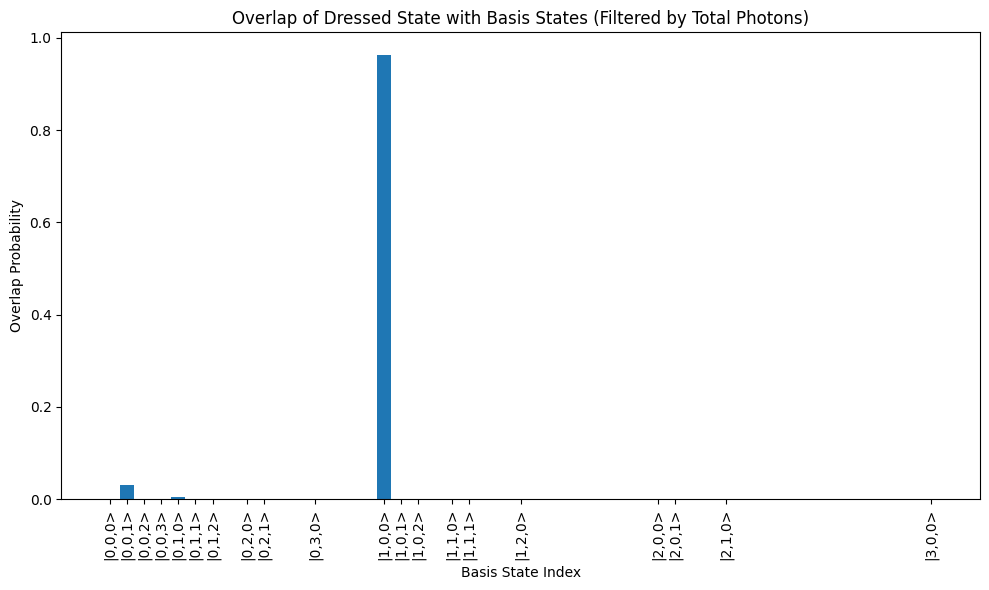

In [536]:
coup_ham.plot_dressed_state_overlap(alice_dressed_state)

In [517]:
return_args_plotting[0].keys()

dict_keys(['swept_list', 'overlap_values', 'overlap_idxs', 'max_overlap_idx', 'min_overlap_idx'])

In [521]:
return_args_plotting[0]['overlap_idxs'][alice_idx_for_freq]


13

In [ ]:
plus_plotting = return_args_plotting[-2]
minus_plotting = return_args_plotting[-1]
plus_plotting.keys()


dict_keys(['swept_list', 'overlap_values', 'overlap_idxs', 'max_overlap_idx', 'min_overlap_idx'])

In [477]:


# get the indices of max overlap for plus and minus states
plus_max_overlap_idx = plus_plotting['max_overlap_idx']
plus_max_overlap_mode_idx = plus_plotting['overlap_idxs'][plus_max_overlap_idx]
minus_max_overlap_idx = minus_plotting['max_overlap_idx']
minus_max_overlap_mode_idx = minus_plotting['overlap_idxs'][minus_max_overlap_idx]

# get the corresponding energies 
plus_energy = energies[plus_max_overlap_idx][plus_max_overlap_mode_idx]
minus_energy = energies[minus_max_overlap_idx][minus_max_overlap_mode_idx]
print(f"Plus state energy at 500 MHz: {plus_energy / 2 / np.pi:.2f} MHz")
print(f"Minus state energy at 500 MHz: {minus_energy / 2 / np.pi:.2f} MHz")
# effecive g is the difference in energy between the plus and minus states
energy_diff = minus_energy - plus_energy
print(f"Energy difference at 500 MHz: {energy_diff / 2 / np.pi:.2f} MHz")

Plus state energy at 500 MHz: 200.00 MHz
Minus state energy at 500 MHz: 2.02 MHz
Energy difference at 500 MHz: -197.98 MHz


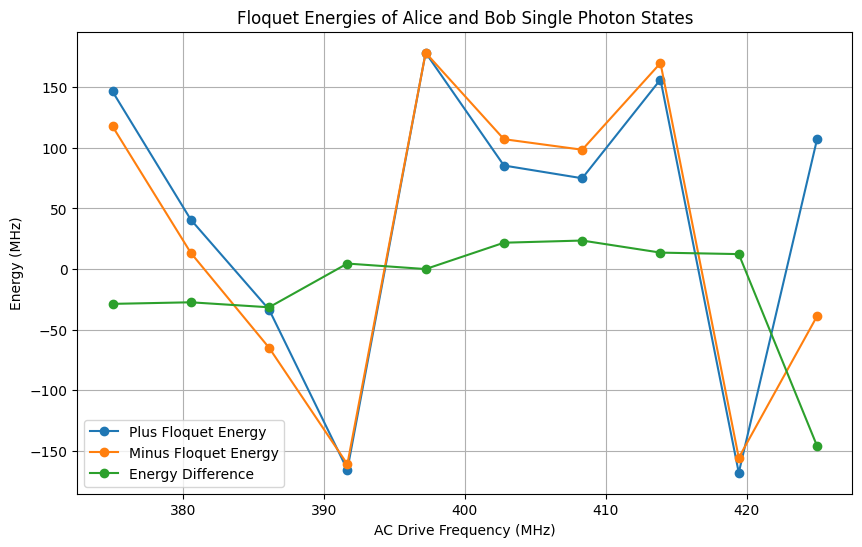

In [292]:
frequencies, energies, modes, mappings = return_dict['frequencies'], return_dict['energies'], return_dict['modes'], return_dict['mappings']

# compute alice and bob single photon dressed state energies as well as differences 
alice_floquet_energies = []
bob_floquet_energies = []
plus_floquet_energies = []
minus_floquet_energies = []
for idx, freq in enumerate(frequencies):
    H_fq = [H0, [operator, time_func]]
    f_energies, f_modes = energies[idx], modes[idx]
    dressed_to_floquet_mapping = mappings['dressed_to_floquet'][idx]
    floquet_to_dressed_mapping = mappings['floquet_to_dressed'][idx]
    
    alice_floquet_idx = dressed_to_floquet_mapping[coup_ham.basis_to_dressed_mapping_dict[coup_ham.ket_to_basis_index('|1,0,0>')]]
    bob_floquet_idx = dressed_to_floquet_mapping[coup_ham.basis_to_dressed_mapping_dict[coup_ham.ket_to_basis_index('|0,1,0>')]]
    alice_floquet_energies.append(f_energies[alice_floquet_idx])
    bob_floquet_energies.append(f_energies[bob_floquet_idx])


    alice_dressed_idx = coup_ham.basis_to_dressed_mapping_dict[coup_ham.ket_to_basis_index('|1,0,0>')]
    bob_dressed_idx = coup_ham.basis_to_dressed_mapping_dict[coup_ham.ket_to_basis_index('|0,1,0>')]
    alice_dressed_state = coup_ham.dressed_states[alice_dressed_idx]
    bob_dressed_state = coup_ham.dressed_states[bob_dressed_idx]

    plus_state = (alice_dressed_state + bob_dressed_state) / np.sqrt(2)
    minus_state = (alice_dressed_state - bob_dressed_state) / np.sqrt(2)

    # Find the floquet states with largest overlap with the plus and minus states
    plus_floquet = f_modes[coup_ham.find_max_overlap_indices(plus_state, f_modes)[0]]
    minus_floquet = f_modes[coup_ham.find_max_overlap_indices(minus_state, f_modes)[0]]
    plus_floquet_energy = f_energies[coup_ham.find_max_overlap_indices(plus_state, f_modes)[0]]
    minus_floquet_energy = f_energies[coup_ham.find_max_overlap_indices(minus_state, f_modes)[0]]
    plus_floquet_energies.append(plus_floquet_energy)
    minus_floquet_energies.append(minus_floquet_energy)


    
# Convert to numpy arrays for easier manipulation
alice_floquet_energies = np.array(alice_floquet_energies)
bob_floquet_energies = np.array(bob_floquet_energies)
plus_floquet_energies = np.array(plus_floquet_energies)
minus_floquet_energies = np.array(minus_floquet_energies)

# Plot the absolute energies and the energy difference
plt.figure(figsize=(10, 6))
# plt.plot(frequencies / (2 * np.pi), alice_floquet_energies / (2 * np.pi), label='Alice Single Photon Floquet Energy', marker='o')
# plt.plot(frequencies / (2 * np.pi), bob_floquet_energies / (2 * np.pi), label='Bob Single Photon Floquet Energy', marker='o')
# plt.plot(frequencies / (2 * np.pi), (bob_floquet_energies - alice_floquet_energies) / (2 * np.pi), label='Energy Difference', marker='o')
#plot the plus and minus floquet energies
plt.plot(frequencies / (2 * np.pi), plus_floquet_energies / (2 * np.pi), label='Plus Floquet Energy', marker='o')
plt.plot(frequencies / (2 * np.pi), minus_floquet_energies / (2 * np.pi), label='Minus Floquet Energy', marker='o')
#plot difference between plus and minus energies
plt.plot(frequencies / (2 * np.pi), (minus_floquet_energies - plus_floquet_energies) / (2 * np.pi), label='Energy Difference', marker='o')
plt.xlabel('AC Drive Frequency (MHz)')
plt.ylabel('Energy (MHz)')
plt.title('Floquet Energies of Alice and Bob Single Photon States')
plt.legend()
plt.grid()
plt.show()

In [291]:
frequencies / (2 * np.pi)

array([375.        , 380.55555556, 386.11111111, 391.66666667,
       397.22222222, 402.77777778, 408.33333333, 413.88888889,
       419.44444444, 425.        ])

In [ ]:

amplitudes, energies, modes, mappings = return_dict['amplitudes'], return_dict['energies'], return_dict['modes'], return_dict['mappings']

# compute alice and bob single photon dressed state energies as well as differences 
alice_floquet_energies = []
bob_floquet_energies = []
for idx, amp in enumerate(amplitudes):
    H_fq = [H0, [operator, time_func]]
    f_energies, f_modes = energies[idx], modes[idx]
    dressed_to_floquet_mapping = mappings['dressed_to_floquet'][idx]
    floquet_to_dressed_mapping = mappings['floquet_to_dressed'][idx]
    
    alice_floquet_idx = dressed_to_floquet_mapping[coup_ham.basis_to_dressed_mapping_dict[coup_ham.ket_to_basis_index('|1,0,0>')]]
    bob_floquet_idx = dressed_to_floquet_mapping[coup_ham.basis_to_dressed_mapping_dict[coup_ham.ket_to_basis_index('|0,1,0>')]]
    
    alice_floquet_energies.append(f_energies[alice_floquet_idx])
    bob_floquet_energies.append(f_energies[bob_floquet_idx])
# Convert to numpy arrays for easier manipulation
alice_floquet_energies = np.array(alice_floquet_energies)
bob_floquet_energies = np.array(bob_floquet_energies)

# Plot the absolute energies and the energy difference
plt.figure(figsize=(10, 6))
plt.plot(amplitudes, alice_floquet_energies / (2 * np.pi), label='Alice Single Photon Floquet Energy', marker='o')
plt.plot(amplitudes, bob_floquet_energies / (2 * np.pi), label='Bob Single Photon Floquet Energy', marker='o')
plt.plot(amplitudes, (bob_floquet_energies - alice_floquet_energies) / (2 * np.pi), label='Energy Difference', marker='o')
plt.xlabel('AC Drive Amplitude (phi_AC_amp)')
plt.ylabel('Energy (MHz)')
plt.title('Floquet Energies of Alice and Bob Single Photon States')
plt.legend()
plt.grid()
plt.show()

KeyError: 'amplitudes'

In [236]:
dressed_to_floquet_mapping[2]

1

In [123]:
operator

Quantum object: dims=[[5, 5, 5], [5, 5, 5]], shape=(125, 125), type='oper', dtype=Dense, isherm=True
Qobj data =
[[ 2.39846439e-05  0.00000000e+00 -1.03769820e-04 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00 -1.22768043e-04  0.00000000e+00 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [-1.03769820e-04  0.00000000e+00  6.10353204e-05 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 ...
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 ...  6.10353204e-05
   0.00000000e+00  3.20868271e-05]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 ...  0.00000000e+00
   2.44679836e-05  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 ...  3.20868271e-05
   0.00000000e+00 -3.32002383e-06]]

In [ ]:
s

In [97]:
coup_ham.generate_H0()/2/np.pi

Quantum object: dims=[[5, 5, 5], [5, 5, 5]], shape=(125, 125), type='oper', dtype=Dia, isherm=True
Qobj data =
[[    0.     0.     0. ...     0.     0.     0.]
 [    0.  4000.     0. ...     0.     0.     0.]
 [    0.     0.  8000. ...     0.     0.     0.]
 ...
 [    0.     0.     0. ... 52000.     0.     0.]
 [    0.     0.     0. ...     0. 56000.     0.]
 [    0.     0.     0. ...     0.     0. 60000.]]

In [98]:
quasienergies

array([-5.19649817e-06, -3.58720499e-06, -2.59428541e-06, -2.00326726e-06,
       -0.00000000e+00,  8.34470853e-06,  3.43124620e-05,  3.43124687e-05,
        8.64484887e-05,  1.81275238e-04,  1.81275253e-04,  3.42381709e-04,
        6.02403460e-04,  6.02403475e-04,  1.00531485e-03,  1.00531485e-03,
        1.60904643e-03,  1.60904643e-03,  1.60904645e-03,  2.48843985e-03,
        2.48843987e-03,  3.73855107e-03,  3.73855107e-03,  3.73855110e-03,
        5.47831127e-03,  5.47831128e-03,  7.85455528e-03,  7.85455528e-03,
        7.85455528e-03,  1.10464261e-02,  1.10464261e-02,  1.10464261e-02,
        1.52701662e-02,  1.52701662e-02,  1.52701662e-02,  1.52701662e-02,
        2.07843050e-02,  2.07843050e-02,  2.07843050e-02,  2.78952564e-02,
        2.78952565e-02,  2.78952565e-02,  2.78952565e-02,  3.69633397e-02,
        3.69633397e-02,  4.84092411e-02,  4.84092411e-02,  4.84092411e-02,
        4.84092411e-02,  6.27209379e-02,  6.27209379e-02,  6.27209379e-02,
        6.27209379e-02,  

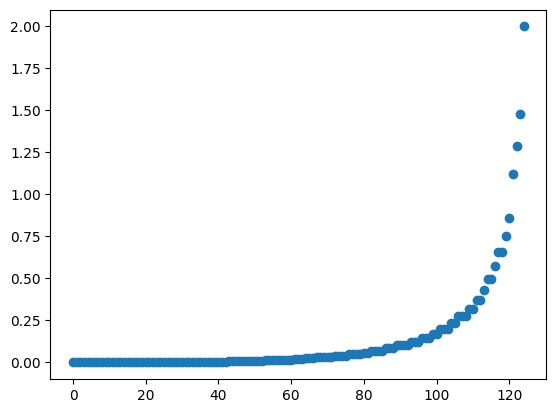

In [99]:
plt.plot(quasienergies/2/np.pi, 'o')

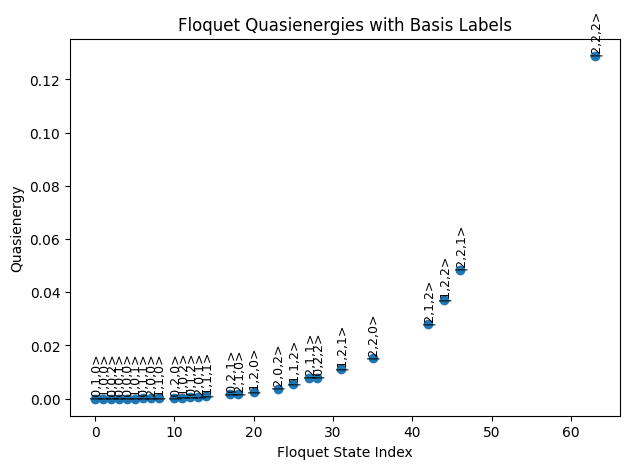

In [100]:
coup_ham.plot_floquet_energies( states, quasienergies)#, title="LINC potential quasienergies")

In [101]:
energies, modes = coup_ham.compute_states_over_floquet_period(omega =omegad, H = H, num_points = 10)


Computing Floquet states: 100%|██████████| 10/10 [00:23<00:00,  2.31s/it]


5
25
2
1
0
26
6
50
30
3
10
27
7
51
31
75
4
11
55
28
35
15
8
52
76
32
100
56
12
29
80
36
53
16
9
60
77
40
33
13
101
20
57
81
37
17
61
105
54
78
41
85
34
102
65
58
21
14
82
45
38
18
106
62
42
79
86
103
66
110
59
22
90
83
46
39
19
70
107
63
43
87
104
67
23
111
91
84
47
108
115
71
64
44
95
88
68
112
24
48
92
109
116
72
96
89
120
113
69
93
49
73
117
97
114
121
94
118
74
98
122
119
99
123
124


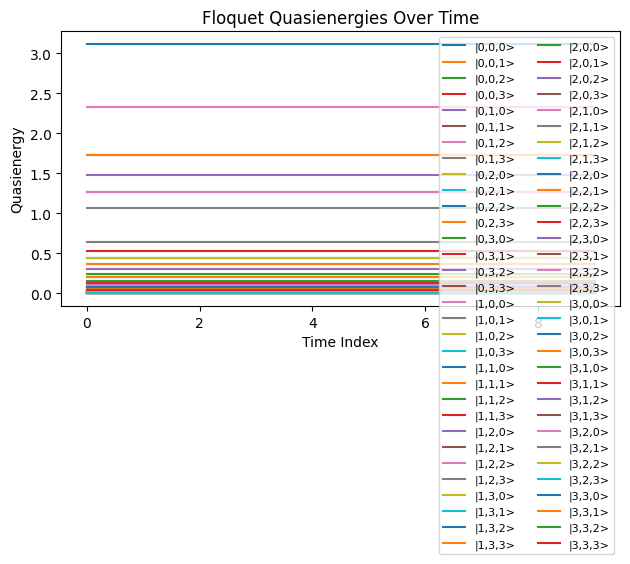

In [102]:
coup_ham.plot_floquet_energies_over_period(energies, modes, max_photons_per_mode=3)

In [ ]:
num_points = len(energies)
keys = big_mapping_list[0].keys()
en_for_state = np.zeros(( len(keys), num_points))
for j, key in enumerate(keys):
    en_for_state[j, :] = [big_mapping_list[i][key] for i in range(num_points)]




{0: 66,
 1: 61,
 2: 91,
 3: 36,
 4: 17,
 5: 42,
 6: 31,
 7: 16,
 8: 37,
 9: 32,
 10: 96,
 11: 27,
 12: 2,
 13: 117,
 14: 87,
 15: 112,
 16: 82,
 17: 107,
 18: 77,
 19: 102,
 20: 22,
 21: 47,
 22: 72,
 23: 122,
 24: 97,
 25: 26,
 26: 1,
 27: 1,
 28: 56,
 29: 61,
 30: 6,
 31: 86,
 32: 51,
 33: 76,
 34: 11,
 35: 41,
 36: 56,
 37: 16,
 38: 81,
 39: 91,
 40: 86,
 41: 101,
 42: 106,
 43: 96,
 44: 71,
 45: 111,
 46: 46,
 47: 21,
 48: 92,
 49: 37,
 50: 12,
 51: 17,
 52: 42,
 53: 7,
 54: 12,
 55: 37,
 56: 62,
 57: 27,
 58: 32,
 59: 57,
 60: 52,
 61: 87,
 62: 90,
 63: 121,
 64: 80,
 65: 77,
 66: 70,
 67: 45,
 68: 20,
 69: 95,
 70: 112,
 71: 107,
 72: 117,
 73: 78,
 74: 3,
 75: 28,
 76: 33,
 77: 8,
 78: 38,
 79: 53,
 80: 13,
 81: 64,
 82: 63,
 83: 78,
 84: 68,
 85: 83,
 86: 18,
 87: 43,
 88: 18,
 89: 93,
 90: 120,
 91: 39,
 92: 94,
 93: 84,
 94: 79,
 95: 19,
 96: 14,
 97: 9,
 98: 39,
 99: 44,
 100: 4,
 101: 29,
 102: 34,
 103: 54,
 104: 59,
 105: 63,
 106: 88,
 107: 98,
 108: 103,
 109: 73,
 110: